# FIT5149 S1 2009 Assessment 1: Choosing and Explaining Likely Caravan Insurance Customers


Student information
- Family Name: Sapra
- Given Name: Akshay
- Student ID: 29858186
- Student email: asap0003@student.monash.edu

Programming Language: R 3.5.1 in Jupyter Notebook

R Libraries used:
- ISLR
- psych
- ggplot2
- reshape2
- leaps
- glmnet
- lattice

## Table of Contents

* [Introduction](#sec_1)
* [Data Exploration](#sec_2)
* [Model Development](#sec_3)
* [Model Comparison](#sec_4)
* [Variable Identification and Explanation](#sec_5)
* [Conclusion](#sec_6)
* [References](#sec_7)

## 1. Introduction <a class="anchor" id="sec_1"></a>

This task based on the intention to extract important features from car insurance data (COIL challenge). This task is designed keeping inmind that company will devise their marketting stratergy on the basis of result of this task. 
The problem that will be solved by this task are: 
- predict who would be interested in buying a caravan insurance policy?
-  explain why you make such a prediction? Describe the actual or potential customers; and explain why these customers buy a caravan policy.


In [47]:
library (ISLR)
library (psych)
library(ggplot2)
library(reshape2)
library(leaps)
library(glmnet)
library(lattice)
library (MASS)
library(GGally)
library(caret)
options(warn=-1) 
# # Refernece: https://stackoverflow.com/questions/16194212/how-to-suppress-warnings-globally-in-an-r-script

Reading the Data

In [48]:
insTrainData <- read.csv("ticdata2000.txt", header = F, sep = "\t")
insTestData <- read.csv("ticeval2000.txt", header = F, sep = '\t')
insEvalData <- read.csv("tictgts2000.txt", header = F, sep = '\t')

***
## 2. Data Exploration (EDA) <a class="anchor" id="sec_2"></a>


There are 3 files present. 
ticdata2000.txt or insTrainData contains training data.
ticeval2000.txt or insTestData contains test data without the target values.
tictgts2000.txt or insEvalData contains target variable of the test data.

* Before proceeding any further we will first verify the dimension of the training and test data so that we are sure data is intact as mentioned in the problem description

In [49]:
dim (insTrainData)
dim (insTestData)
dim (insEvalData)

[1] 5822   86

[1] 4000   85

[1] 4000    1

After checking the dimensions of data we can indeed verify that training data has 5822 rows and 86 columns, where as test data has 4000 rows and 85 columns/1 column in case of target variable data.

***
Before working on the data,first step is to see/verify first few rows and the name of variables for each data set in order to access them.

In [50]:
head (insTrainData)
head (insTestData)
head (insEvalData)

V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,⋯,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86
33,1,3,2,8,0,5,1,3,7,⋯,0,0,0,1,0,0,0,0,0,0
37,1,2,2,8,1,4,1,4,6,⋯,0,0,0,1,0,0,0,0,0,0
37,1,2,2,8,0,4,2,4,3,⋯,0,0,0,1,0,0,0,0,0,0
9,1,3,3,3,2,3,2,4,5,⋯,0,0,0,1,0,0,0,0,0,0
40,1,4,2,10,1,4,1,4,7,⋯,0,0,0,1,0,0,0,0,0,0
23,1,2,1,5,0,5,0,5,0,⋯,0,0,0,0,0,0,0,0,0,0


V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,⋯,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85
33,1,4,2,8,0,6,0,3,5,⋯,0,0,0,0,1,0,0,0,0,0
6,1,3,2,2,0,5,0,4,5,⋯,2,0,0,0,1,0,0,0,0,0
39,1,3,3,9,1,4,2,3,5,⋯,1,0,0,0,1,0,0,0,0,0
9,1,2,3,3,2,3,2,4,5,⋯,0,0,0,0,1,0,0,0,0,0
31,1,2,4,7,0,2,0,7,9,⋯,0,0,0,0,1,0,0,0,0,0
30,1,2,4,7,1,4,2,3,5,⋯,0,0,0,0,2,0,0,0,0,0


V1
0
1
0
0
0
0


After looking at the first few rows of each data, name of the variable doesn not seem to create any meaning.
So in order to make data accessibility and understanding more convinient we will change the name of variables by looking into the data dictionary provided with the problem. 

In [51]:
trainCol= c('CUST_SUBTYPE','NUM_OF_HOUSES','AVG_SIZE_HOUSEHOLD','AVG_AGE','CUST_MAIN_TYPE','ROMAN_CATHOLIC','PROTESTANT','OTHER_RELEGION','NO_RELEGION','MARRIED','LIVING_TOGETHER','OTHER_RELATION','SINGLE','HOUSE_WITHOUT_CHILD','HOUSE_WITH_CHILD','HIGH_LEV_EDU','MID_LEV_EDU','LOW_LEV_EDU','HIGH_STATUS','ENTREPRENEUR','FARMER','MID_MGMT','SKILLED_LABOUR','UNSKILLED_LABOUR','SOC_CLASS_A','SOC_CLASS_B1','SOC_CLASS_B2','SOC_CLASS_C','SOC_CLASS_D','RENTED_HOUSE','HOME_OWNER','CAR_1','CAR_2','CAR_0','NAT_HEATLH_SERVICE','PRIVATE_HEALTH_SERVICE','INCOME_LT_30','INCOME_BW_30_45','INCOME_BW_45_75','INCOME_BW_75_120','INCOME_MT_120','AVG_INCOME','PURCHASING_POWER_CLASS','CONTRIB_PRIVATE_3RD_PARTY_INSUR','CONTRIB_3RD_PARTY_INSUR_FIRMS','CONTRIB_3RD_PARTY_INSUR_AGRIC','CONTRIB_CAR_POLICIES','CONTRIB_VAN_POLICIES','CONTRIB_MOTOR_CYC_POLICIES','CONTRIB_LORRY_POLICIES','CONTRIB_TRAILER_POLICIES','CONTRIB_TRACTOR_POLICIES','CONTRIB_AGRICULTURE_MACHINE_POLICIES','CONTRIB_MOPED_POLICIES','CONTRIB_LIFE_INSURANCE_POLICIES','CONTRIB_PRIVATE_ACCIDENT_POLICIES','CONTRIB_FAMILY_ACCIDENT_POLICIES','CONTRIB_DISABILITY_POLICIES','CONTRIB_FIRE_POLICIES','CONTRIB_SURFBOARD_POLICIES','CONTRIB_BOAT_POLICIES','CONTRIB_BICYCLE_POLICIES','CONTRIB_PROPERTY_POLICIES','CONTRIB_SOCIAL_SECURITY_POLICIES','NUM_OF_PRIVATE_3RD_PARTY_INSUR','NUM_OF_3RD_PARTY_INSUR_FIRMS','NUM_OF_3RD_PARTY_INSUR_AGRIC','NUM_OF_CAR_POLICIES','NUM_OF_VAN_POLICIES','NUM_OF_MOTOR_CYC_POLICIES','NUM_OF_LORRY_POLICIES','NUM_OF_TRAILER_POLICIES','NUM_OF_TRACTOR_POLICIES','NUM_OF_AGRICULTURE_MACHINE_POLICIES','NUM_OF_MOPED_POLICIES','NUM_OF_LIFE_INSURANCE_POLICIES','NUM_OF_PRIVATE_ACCIDENT_POLICIES','NUM_OF_FAMILY_ACCIDENT_POLICIES','NUM_OF_DISABILITY_POLICIES','NUM_OF_FIRE_POLICIES','NUM_OF_SURFBOARD_POLICIES','NUM_OF_BOAT_POLICIES','NUM_OF_BICYCLE_POLICIES','NUM_OF_PROPERTY_POLICIES','NUM_OF_SOCIAL_SECURITY_POLICIES','CARAVAN')
testCol = c('CUST_SUBTYPE','NUM_OF_HOUSES','AVG_SIZE_HOUSEHOLD','AVG_AGE','CUST_MAIN_TYPE','ROMAN_CATHOLIC','PROTESTANT','OTHER_RELEGION','NO_RELEGION','MARRIED','LIVING_TOGETHER','OTHER_RELATION','SINGLE','HOUSE_WITHOUT_CHILD','HOUSE_WITH_CHILD','HIGH_LEV_EDU','MID_LEV_EDU','LOW_LEV_EDU','HIGH_STATUS','ENTREPRENEUR','FARMER','MID_MGMT','SKILLED_LABOUR','UNSKILLED_LABOUR','SOC_CLASS_A','SOC_CLASS_B1','SOC_CLASS_B2','SOC_CLASS_C','SOC_CLASS_D','RENTED_HOUSE','HOME_OWNER','CAR_1','CAR_2','CAR_0','NAT_HEATLH_SERVICE','PRIVATE_HEALTH_SERVICE','INCOME_LT_30','INCOME_BW_30_45','INCOME_BW_45_75','INCOME_BW_75_120','INCOME_MT_120','AVG_INCOME','PURCHASING_POWER_CLASS','CONTRIB_PRIVATE_3RD_PARTY_INSUR','CONTRIB_3RD_PARTY_INSUR_FIRMS','CONTRIB_3RD_PARTY_INSUR_AGRIC','CONTRIB_CAR_POLICIES','CONTRIB_VAN_POLICIES','CONTRIB_MOTOR_CYC_POLICIES','CONTRIB_LORRY_POLICIES','CONTRIB_TRAILER_POLICIES','CONTRIB_TRACTOR_POLICIES','CONTRIB_AGRICULTURE_MACHINE_POLICIES','CONTRIB_MOPED_POLICIES','CONTRIB_LIFE_INSURANCE_POLICIES','CONTRIB_PRIVATE_ACCIDENT_POLICIES','CONTRIB_FAMILY_ACCIDENT_POLICIES','CONTRIB_DISABILITY_POLICIES','CONTRIB_FIRE_POLICIES','CONTRIB_SURFBOARD_POLICIES','CONTRIB_BOAT_POLICIES','CONTRIB_BICYCLE_POLICIES','CONTRIB_PROPERTY_POLICIES','CONTRIB_SOCIAL_SECURITY_POLICIES','NUM_OF_PRIVATE_3RD_PARTY_INSUR','NUM_OF_3RD_PARTY_INSUR_FIRMS','NUM_OF_3RD_PARTY_INSUR_AGRIC','NUM_OF_CAR_POLICIES','NUM_OF_VAN_POLICIES','NUM_OF_MOTOR_CYC_POLICIES','NUM_OF_LORRY_POLICIES','NUM_OF_TRAILER_POLICIES','NUM_OF_TRACTOR_POLICIES','NUM_OF_AGRICULTURE_MACHINE_POLICIES','NUM_OF_MOPED_POLICIES','NUM_OF_LIFE_INSURANCE_POLICIES','NUM_OF_PRIVATE_ACCIDENT_POLICIES','NUM_OF_FAMILY_ACCIDENT_POLICIES','NUM_OF_DISABILITY_POLICIES','NUM_OF_FIRE_POLICIES','NUM_OF_SURFBOARD_POLICIES','NUM_OF_BOAT_POLICIES','NUM_OF_BICYCLE_POLICIES','NUM_OF_PROPERTY_POLICIES','NUM_OF_SOCIAL_SECURITY_POLICIES')
tes= 'CARAVAN'
colnames (insTrainData)= trainCol
colnames (insTestData)= testCol
colnames (insEvalData)= tes

In [52]:
head(insTrainData)
head(insTestData)
head (insEvalData)

CUST_SUBTYPE,NUM_OF_HOUSES,AVG_SIZE_HOUSEHOLD,AVG_AGE,CUST_MAIN_TYPE,ROMAN_CATHOLIC,PROTESTANT,OTHER_RELEGION,NO_RELEGION,MARRIED,⋯,NUM_OF_PRIVATE_ACCIDENT_POLICIES,NUM_OF_FAMILY_ACCIDENT_POLICIES,NUM_OF_DISABILITY_POLICIES,NUM_OF_FIRE_POLICIES,NUM_OF_SURFBOARD_POLICIES,NUM_OF_BOAT_POLICIES,NUM_OF_BICYCLE_POLICIES,NUM_OF_PROPERTY_POLICIES,NUM_OF_SOCIAL_SECURITY_POLICIES,CARAVAN
33,1,3,2,8,0,5,1,3,7,⋯,0,0,0,1,0,0,0,0,0,0
37,1,2,2,8,1,4,1,4,6,⋯,0,0,0,1,0,0,0,0,0,0
37,1,2,2,8,0,4,2,4,3,⋯,0,0,0,1,0,0,0,0,0,0
9,1,3,3,3,2,3,2,4,5,⋯,0,0,0,1,0,0,0,0,0,0
40,1,4,2,10,1,4,1,4,7,⋯,0,0,0,1,0,0,0,0,0,0
23,1,2,1,5,0,5,0,5,0,⋯,0,0,0,0,0,0,0,0,0,0


CUST_SUBTYPE,NUM_OF_HOUSES,AVG_SIZE_HOUSEHOLD,AVG_AGE,CUST_MAIN_TYPE,ROMAN_CATHOLIC,PROTESTANT,OTHER_RELEGION,NO_RELEGION,MARRIED,⋯,NUM_OF_LIFE_INSURANCE_POLICIES,NUM_OF_PRIVATE_ACCIDENT_POLICIES,NUM_OF_FAMILY_ACCIDENT_POLICIES,NUM_OF_DISABILITY_POLICIES,NUM_OF_FIRE_POLICIES,NUM_OF_SURFBOARD_POLICIES,NUM_OF_BOAT_POLICIES,NUM_OF_BICYCLE_POLICIES,NUM_OF_PROPERTY_POLICIES,NUM_OF_SOCIAL_SECURITY_POLICIES
33,1,4,2,8,0,6,0,3,5,⋯,0,0,0,0,1,0,0,0,0,0
6,1,3,2,2,0,5,0,4,5,⋯,2,0,0,0,1,0,0,0,0,0
39,1,3,3,9,1,4,2,3,5,⋯,1,0,0,0,1,0,0,0,0,0
9,1,2,3,3,2,3,2,4,5,⋯,0,0,0,0,1,0,0,0,0,0
31,1,2,4,7,0,2,0,7,9,⋯,0,0,0,0,1,0,0,0,0,0
30,1,2,4,7,1,4,2,3,5,⋯,0,0,0,0,2,0,0,0,0,0


CARAVAN
0
1
0
0
0
0


After changing the name of columns we will verify the data type of each column.

***
* What are the attribute of each variable?

Now we will check the type of data in training data.

In [53]:
str(insTrainData) 

'data.frame':	5822 obs. of  86 variables:
 $ CUST_SUBTYPE                        : int  33 37 37 9 40 23 39 33 33 11 ...
 $ NUM_OF_HOUSES                       : int  1 1 1 1 1 1 2 1 1 2 ...
 $ AVG_SIZE_HOUSEHOLD                  : int  3 2 2 3 4 2 3 2 2 3 ...
 $ AVG_AGE                             : int  2 2 2 3 2 1 2 3 4 3 ...
 $ CUST_MAIN_TYPE                      : int  8 8 8 3 10 5 9 8 8 3 ...
 $ ROMAN_CATHOLIC                      : int  0 1 0 2 1 0 2 0 0 3 ...
 $ PROTESTANT                          : int  5 4 4 3 4 5 2 7 1 5 ...
 $ OTHER_RELEGION                      : int  1 1 2 2 1 0 0 0 3 0 ...
 $ NO_RELEGION                         : int  3 4 4 4 4 5 5 2 6 2 ...
 $ MARRIED                             : int  7 6 3 5 7 0 7 7 6 7 ...
 $ LIVING_TOGETHER                     : int  0 2 2 2 1 6 2 2 0 0 ...
 $ OTHER_RELATION                      : int  2 2 4 2 2 3 0 0 3 2 ...
 $ SINGLE                              : int  1 0 4 2 2 3 0 0 3 2 ...
 $ HOUSE_WITHOUT_CHILD                

We can clearly see that All the variables are stored as integer type.
As we can see in the data dictionary (shared with the specification) that somer of the variables are categorical. So it would be much more convinient for us to convert those variables to factor. 

But before converting any variables to factor we will check the  descriptive summary statistics. It will help us identify rough distribution of the data. 
After going through them, we can clearly identify there are some variables which are categorical, while some of the variables are of boolean type.

In [54]:
summary(insTrainData)

  CUST_SUBTYPE   NUM_OF_HOUSES    AVG_SIZE_HOUSEHOLD    AVG_AGE     
 Min.   : 1.00   Min.   : 1.000   Min.   :1.000      Min.   :1.000  
 1st Qu.:10.00   1st Qu.: 1.000   1st Qu.:2.000      1st Qu.:2.000  
 Median :30.00   Median : 1.000   Median :3.000      Median :3.000  
 Mean   :24.25   Mean   : 1.111   Mean   :2.679      Mean   :2.991  
 3rd Qu.:35.00   3rd Qu.: 1.000   3rd Qu.:3.000      3rd Qu.:3.000  
 Max.   :41.00   Max.   :10.000   Max.   :5.000      Max.   :6.000  
 CUST_MAIN_TYPE   ROMAN_CATHOLIC     PROTESTANT    OTHER_RELEGION
 Min.   : 1.000   Min.   :0.0000   Min.   :0.000   Min.   :0.00  
 1st Qu.: 3.000   1st Qu.:0.0000   1st Qu.:4.000   1st Qu.:0.00  
 Median : 7.000   Median :0.0000   Median :5.000   Median :1.00  
 Mean   : 5.774   Mean   :0.6965   Mean   :4.627   Mean   :1.07  
 3rd Qu.: 8.000   3rd Qu.:1.0000   3rd Qu.:6.000   3rd Qu.:2.00  
 Max.   :10.000   Max.   :9.0000   Max.   :9.000   Max.   :5.00  
  NO_RELEGION       MARRIED      LIVING_TOGETHER  OTHER

We can obtain more descriptive analysis through describe from psych library. 


In [55]:
describe (insTrainData, fast = FALSE)

,vars,n,mean,sd,median,trimmed,mad,min,max,range,skew,kurtosis,se
CUST_SUBTYPE,1,5822,24.2533494,12.8467057,30,24.9841134,11.8608,1,41,40,-0.43484627,-1.35267577,0.168366496
NUM_OF_HOUSES,2,5822,1.1106149,0.4058421,1,1.0000000,0.0000,1,10,9,7.41560941,99.98537492,0.005318889
AVG_SIZE_HOUSEHOLD,3,5822,2.6788045,0.7898345,3,2.6449120,1.4826,1,5,4,0.18337935,0.01093010,0.010351422
AVG_AGE,4,5822,2.9912401,0.8145888,3,2.9506226,0.0000,1,6,5,0.47173241,0.61903466,0.010675847
CUST_MAIN_TYPE,5,5822,5.7736173,2.8567598,7,5.9012452,2.9652,1,10,9,-0.33135845,-1.34546433,0.037440154
ROMAN_CATHOLIC,6,5822,0.6964960,1.0032338,0,0.5206097,0.0000,0,9,9,2.23693514,8.61679968,0.013148192
PROTESTANT,7,5822,4.6269323,1.7158425,5,4.6326750,1.4826,0,9,9,0.07449209,0.45420859,0.022487508
OTHER_RELEGION,8,5822,1.0699072,1.0175025,1,0.9574925,1.4826,0,5,5,0.90184897,0.78812149,0.013335196
NO_RELEGION,9,5822,3.2585022,1.5976466,3,3.3209532,1.4826,0,9,9,-0.13124562,-0.03204130,0.020938454
MARRIED,10,5822,6.1834421,1.9094825,6,6.3278231,1.4826,0,9,9,-0.71875777,0.68126357,0.025025316


Observations:
- Most of the variables have mean and median almost same which makes it close to gaussian disctribution with less skew.
- column starting with NUM_/Number of policies have very less range.
- cust_sub_type, cust_main_type, caravan can be converted to factors


***
We will begin by exploring how many insurance policies were purchased out of total 5822 rows of training data.


   0    1 
5474  348 

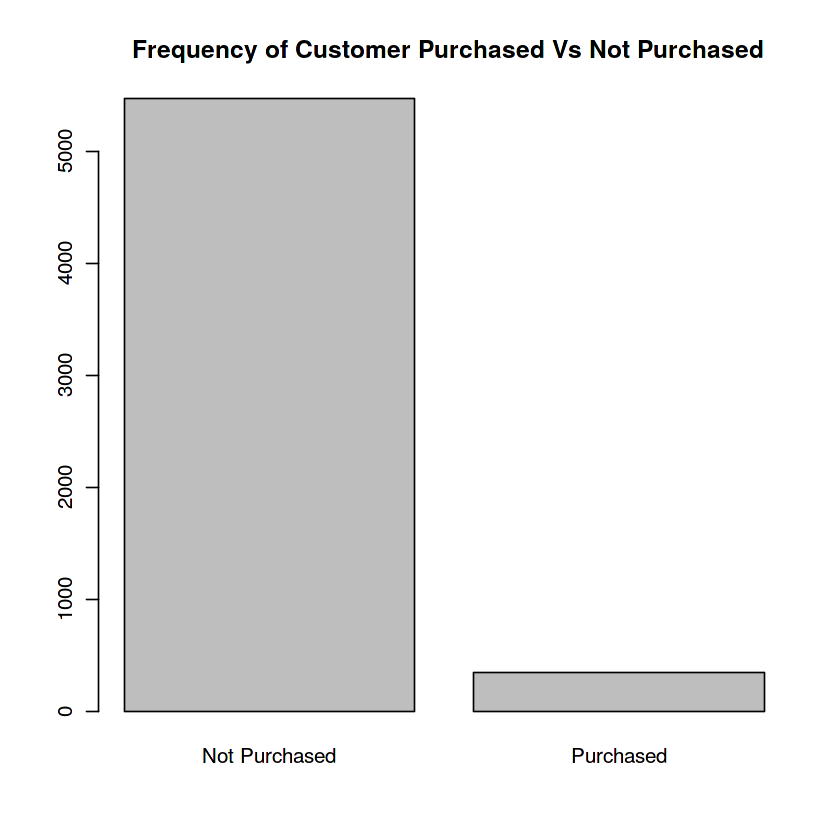

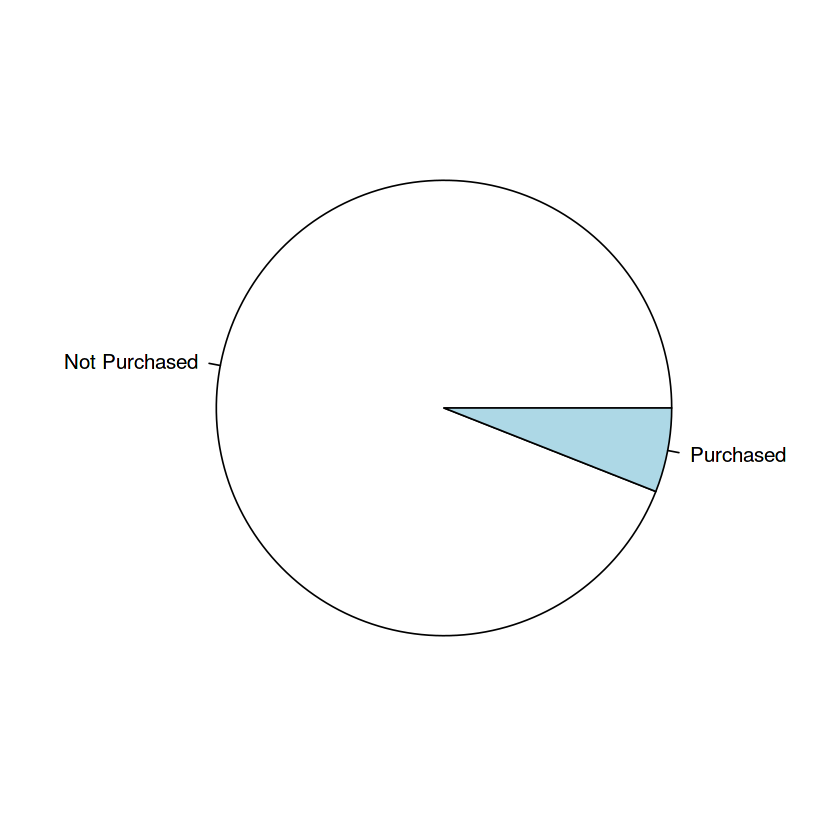

In [56]:
# par(mfrow = c(2,2))
table(insTrainData$CARAVAN)
barplot(table(insTrainData$CARAVAN),names.arg = c("Not Purchased", "Purchased"),beside = TRUE, main=" Frequency of Customer Purchased Vs Not Purchased" )
pie(table(insTrainData$CARAVAN), labels=c("Not Purchased", "Purchased") )


Now that we know how many customers have purchased insurance, we will try to identify the relation of each variable with purchase of insurance (CARAVAN Variable) through boxplot and histogram. 

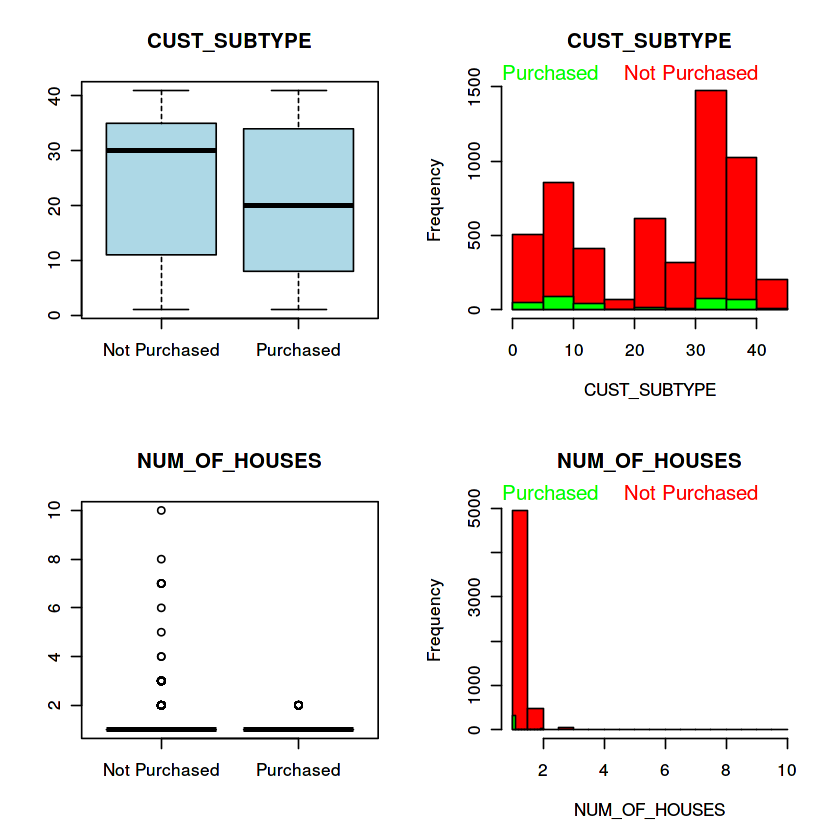

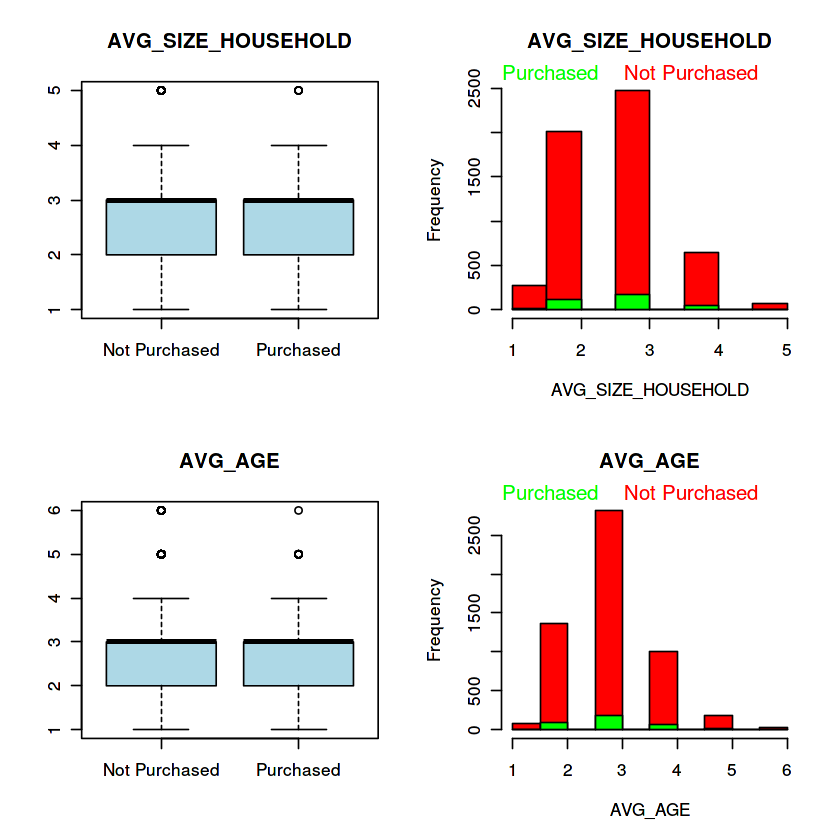

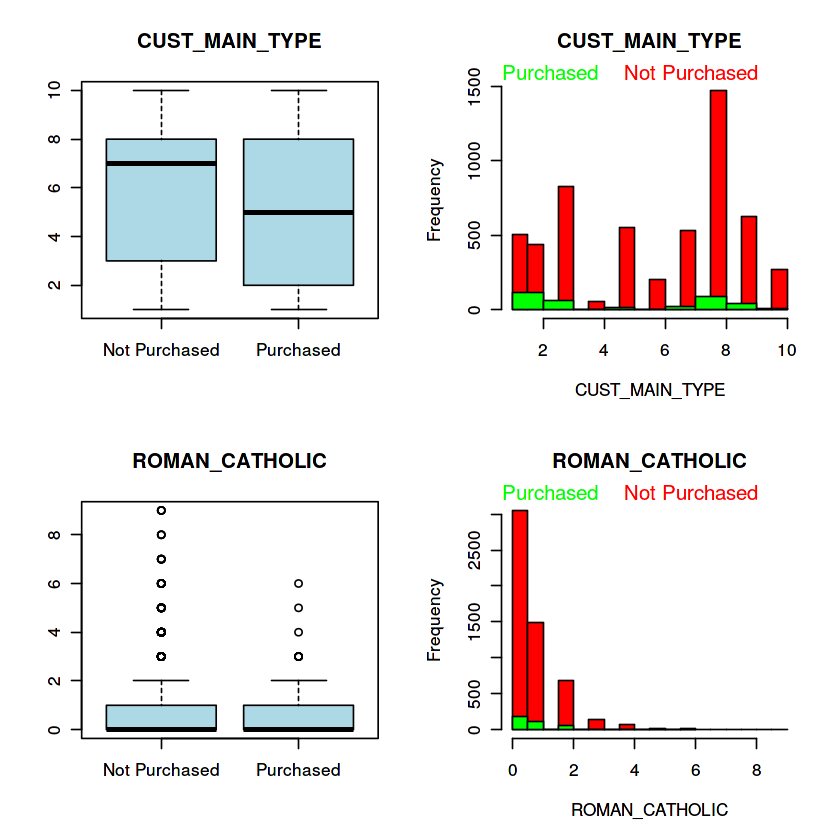

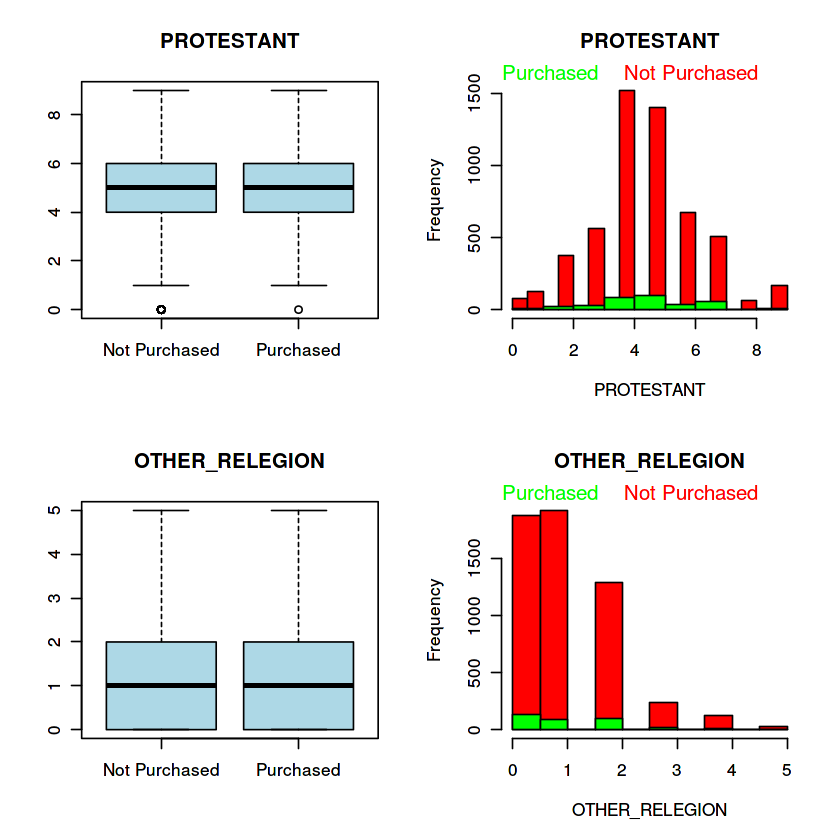

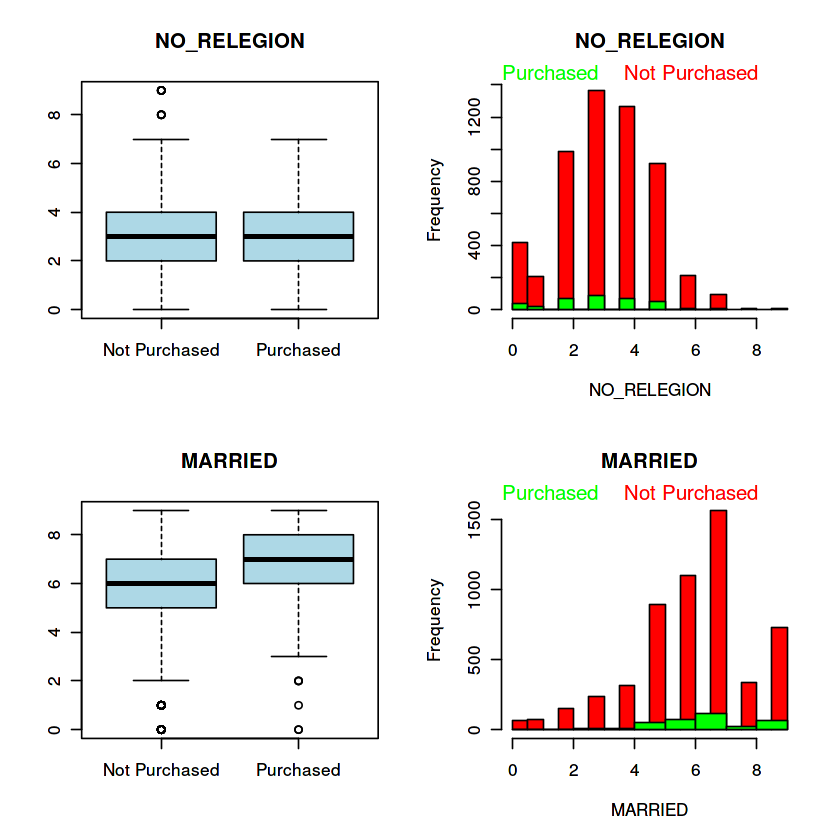

...

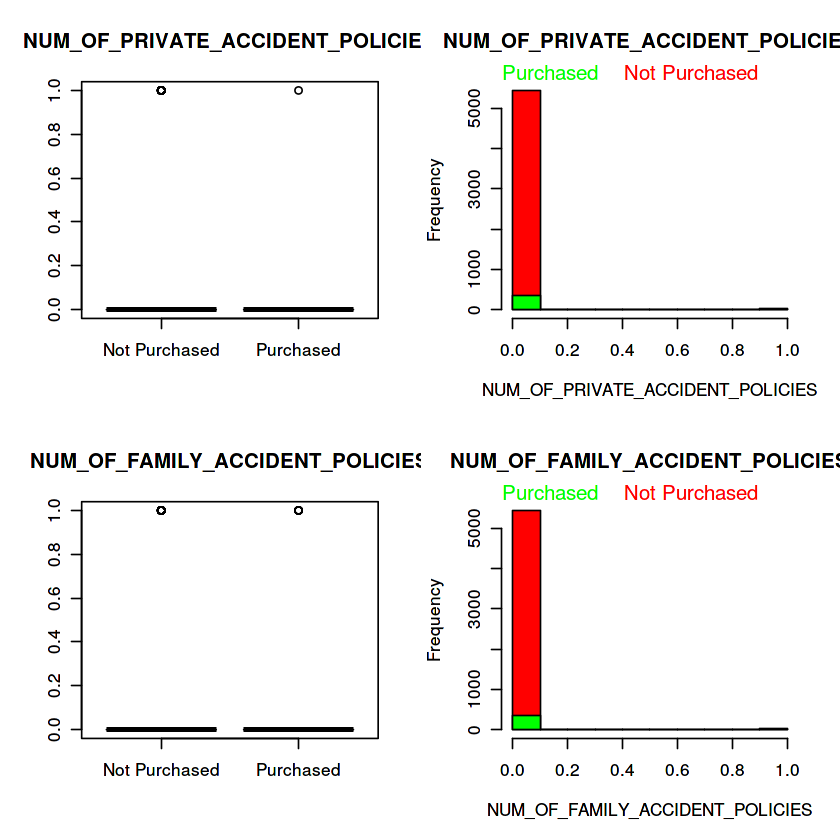

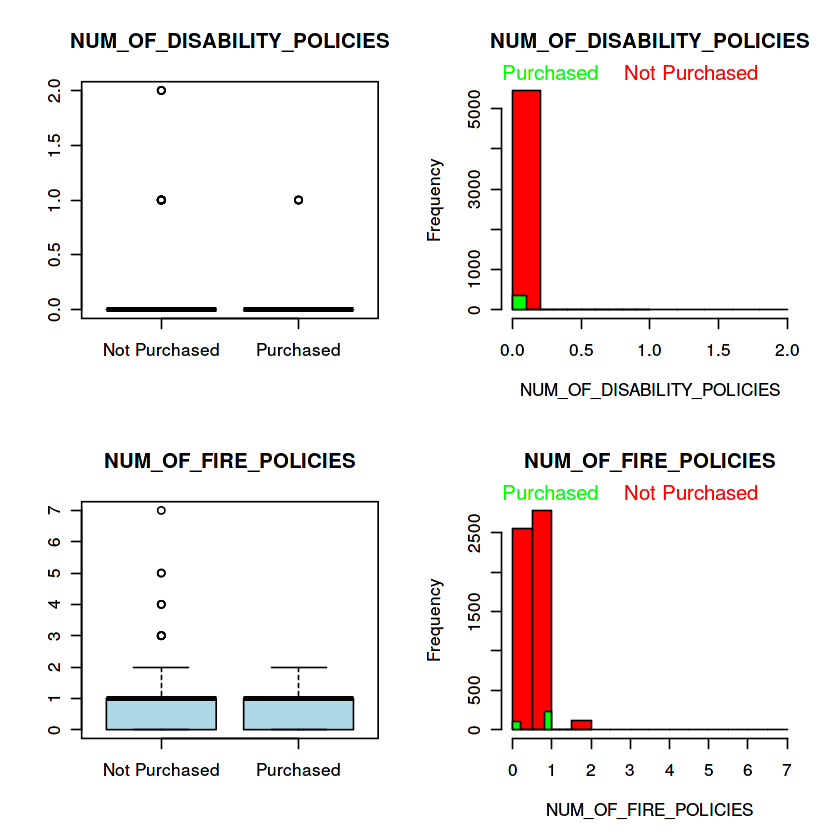

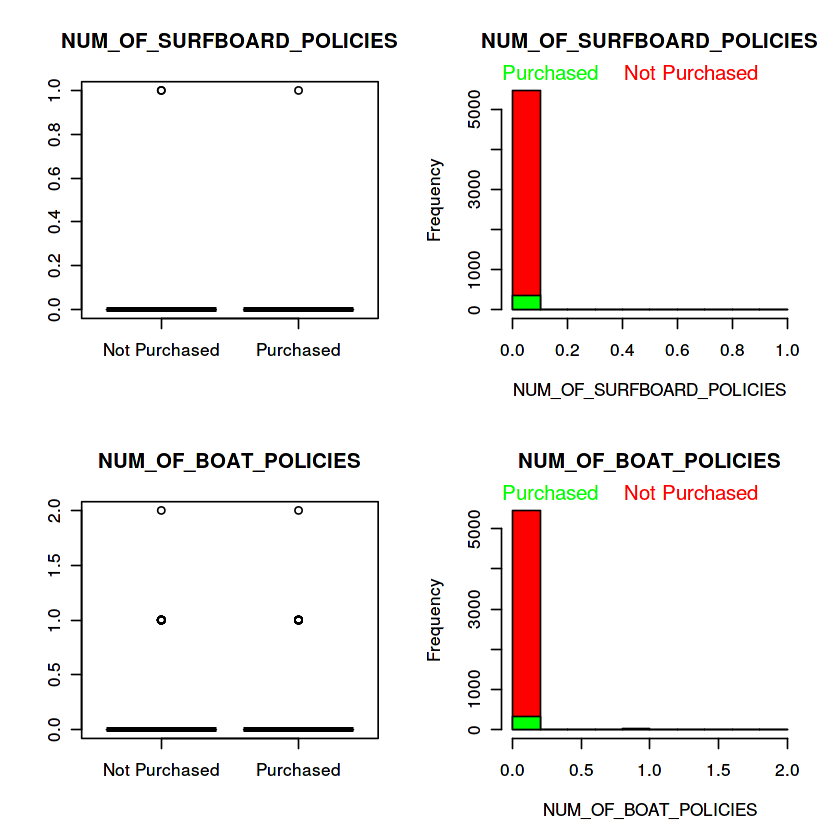

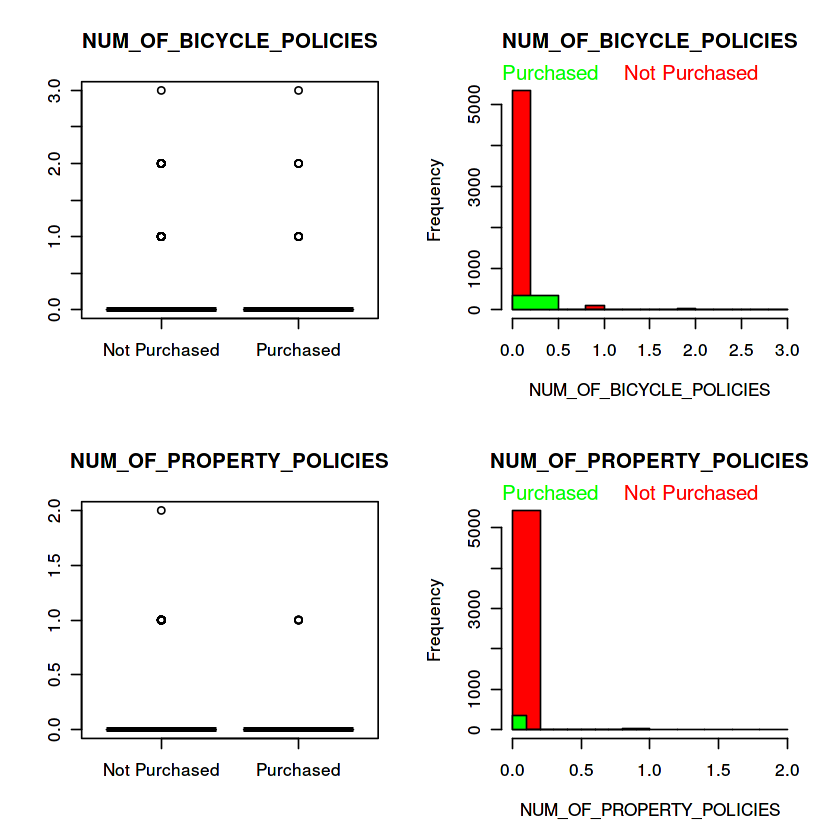

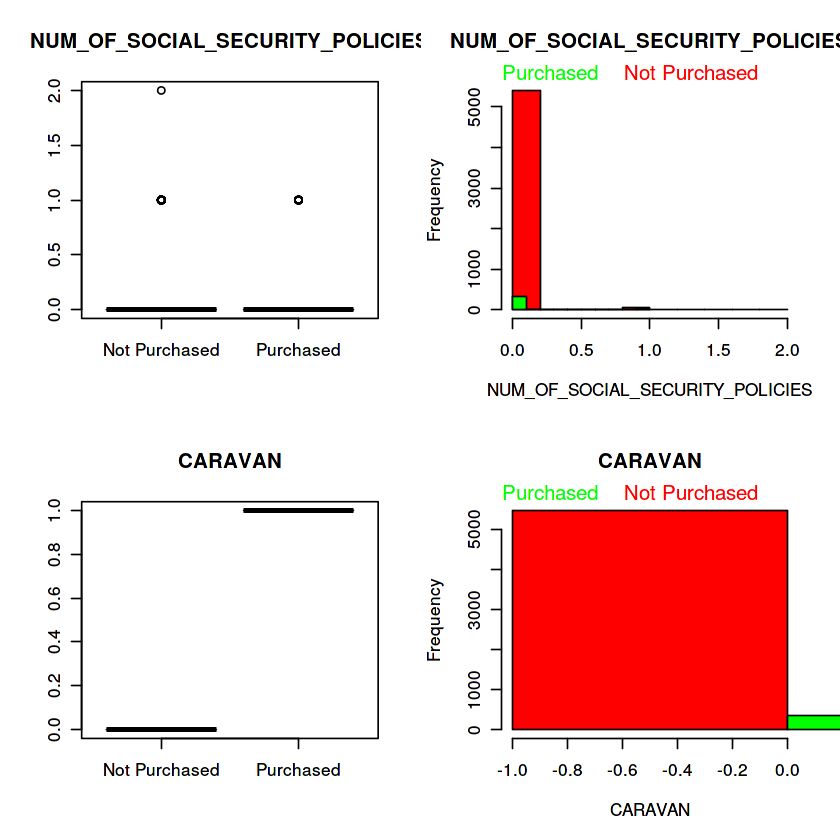

In [57]:
# or you can plot them all in a loop, notice the different scales now
par(mfrow = c(2,2)) # 6 x 2 grid
par(xpd=T, mar=par()$mar+c(0,0,0,0))
for (x in colnames(insTrainData)) {
        boxplot(insTrainData[,x]  ~ insTrainData$CARAVAN, main = names(insTrainData[x]), type="l", col = 'lightblue', names=c("Not Purchased","Purchased")) 
        hist(insTrainData[ , x][insTrainData$CARAVAN==0], xlab=x, main = names(insTrainData[x]),col ='red')
        hist(insTrainData[ , x][insTrainData$CARAVAN==1], xlab=x, main = names(insTrainData[x]),col ='green', add=TRUE)
        mtext(c("Purchased", "Not Purchased"), adj = c(0, 0.75), col = c("green", "red"))

}

Observations:
- One can easily observe that for all of the variables count of not purchased is very high.
- When observing the maximum, minimum and IQR, it is observed that for most of the variables there is no distinguishing statistic in distribution for the customers who purchsed or not purchsed the insurance.
- We can also see that customers who have more than 1 number of house didn't opted for insurance. 


We will try plotting some graphs which weren't too clear from above graphs'

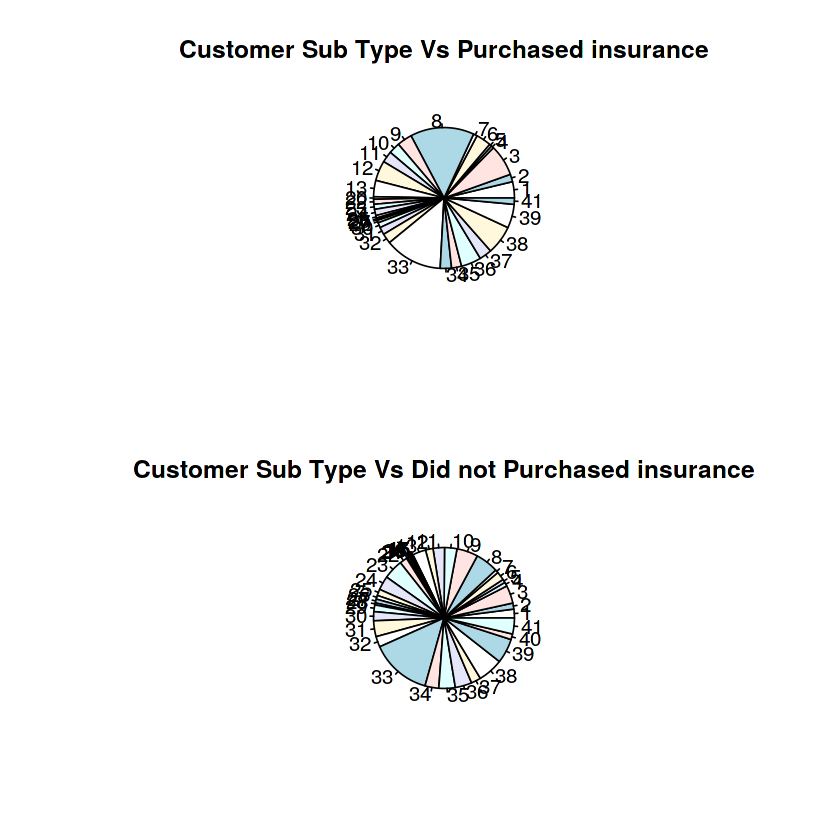

In [58]:
par(mfrow = c(2,1)) 
pie(table(insTrainData$CUST_SUBTYPE[insTrainData$CARAVAN==1]),main="Customer Sub Type Vs Purchased insurance" )
pie(table(insTrainData$CUST_SUBTYPE[insTrainData$CARAVAN==0]),main="Customer Sub Type Vs Did not Purchased insurance")

It can be wasily seen that certain customer sub type of customer would buy insurance. for eg. 
- Large families like customer of subtype 33 (Lower class large families), 34(Large family, employed child), 39 (LArge Religious Family)
- Middle class families like customer of subtype 8 (Middle class families) & 9 (Modern, complete families).
- High status old people like customer of subtype 3 (High status seniors)

P.S. Eventhough customer with lower class or large family (customer of sub type 8,33,38,39) comapritively buys more insurance but this cstegory is low return category considering investment of marketting as there is majority of chunk of same category which does not buy insurance.


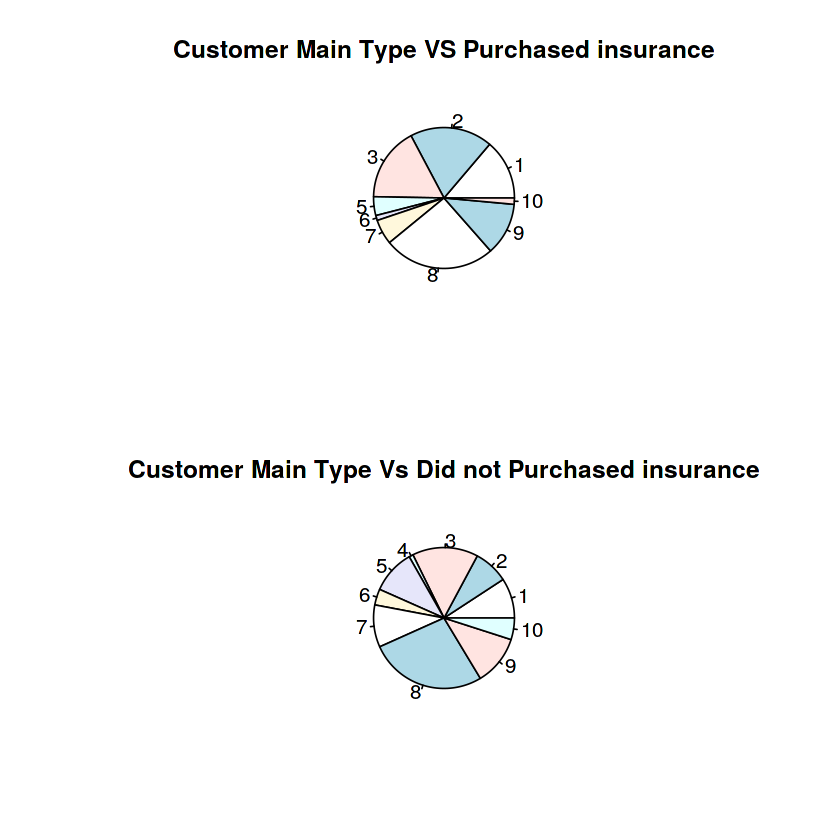

In [59]:
par(mfrow = c(2,1)) 
pie(table(insTrainData$CUST_MAIN_TYPE[insTrainData$CARAVAN==1]),main="Customer Main Type VS Purchased insurance" )
pie(table(insTrainData$CUST_MAIN_TYPE[insTrainData$CARAVAN==0]),main="Customer Main Type Vs Did not Purchased insurance")


Similarly It can be easily seen that certain customer types would be more inclined to buy insurance for eg. 2,3,8,9 & 1 would be more critical for prediction.

- Customer having large family like customer of main type 8 (Family with grown ups), 9(conservative families)
- Customer from middle class or average family like customer of main type 2 (Driven Growers), 3 (Average Family)
- Customer who are successful like customer of main type 1 (Successful hedonists)

P.S. Eventhough customer with lower class or large family (customer main type 3,8,9)comapritively buys more insurance but this cstegory is low return category considering investment of marketting as there is majority of chunk of same category which does not buy insurance.

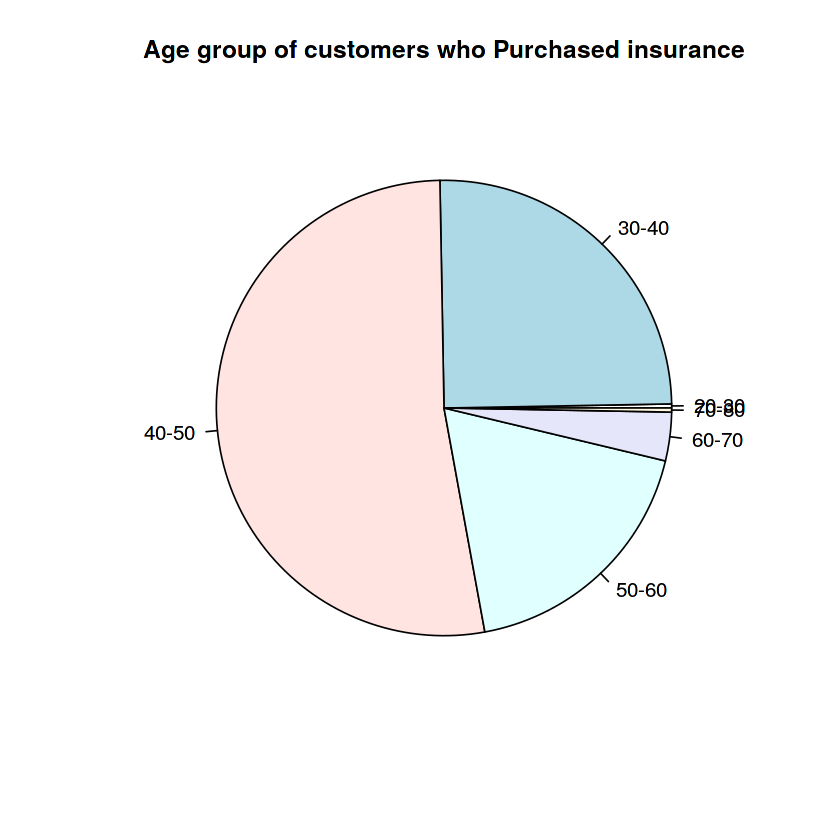

In [60]:
pie(table(insTrainData$AVG_AGE[insTrainData$CARAVAN==1]),main="Age group of customers who Purchased insurance", labels= c("20-30","30-40","40-50","50-60","60-70","70-80") )


It is evident from training data that more than 3/4th of customer are between age 30-60 & more than half are between age 40-50, which (seems like) will be very critical for prediction.

***
Next step is to identify if there is any Corelation between Insurance buyers and different variables. 

Therefore we will generate a corelation matrix and boxplot to identify a relation, if exists. 

In [61]:
cor(insTrainData[c(1:15,86)])
cor(insTrainData[c(16:30,86)])
cor(insTrainData[c(31:45,86)])
cor(insTrainData[c(46:60,86)])
cor(insTrainData[c(61:75,86)])
cor(insTrainData[c(76:86)])

,CUST_SUBTYPE,NUM_OF_HOUSES,AVG_SIZE_HOUSEHOLD,AVG_AGE,CUST_MAIN_TYPE,ROMAN_CATHOLIC,PROTESTANT,OTHER_RELEGION,NO_RELEGION,MARRIED,LIVING_TOGETHER,OTHER_RELATION,SINGLE,HOUSE_WITHOUT_CHILD,HOUSE_WITH_CHILD,CARAVAN
CUST_SUBTYPE,1.000000000,-0.038721258,-0.021996966,0.009454422,0.992671874,-0.193613010,0.09039908,-0.025642336,-0.019504734,-0.06559577,-0.01627010,0.086939441,0.02923993,-0.06625033,0.023407766,-0.069385237
NUM_OF_HOUSES,-0.038721258,1.000000000,0.010102243,0.056974604,-0.045816774,-0.006136360,-0.02436018,0.012056027,0.020540166,0.02302458,-0.03856563,-0.012544222,0.03253454,-0.08291918,0.042143280,-0.009809028
AVG_SIZE_HOUSEHOLD,-0.021996966,0.010102243,1.000000000,-0.328257249,0.016115371,0.013105189,0.04935646,-0.108649617,-0.005527394,0.53479779,-0.17558615,-0.500734749,-0.65955279,-0.31595958,0.794014246,0.035573157
AVG_AGE,0.009454422,0.056974604,-0.328257249,1.000000000,0.003872334,-0.037518737,0.09365402,0.057737161,-0.119966338,-0.04038381,-0.30740081,0.199773821,0.23659383,0.20422509,-0.355754273,0.004490697
CUST_MAIN_TYPE,0.992671874,-0.045816774,0.016115371,0.003872334,1.000000000,-0.199186199,0.09849256,-0.034565811,-0.021465787,-0.02661855,-0.03750886,0.052670612,-0.00344302,-0.07500025,0.058618783,-0.069299830
ROMAN_CATHOLIC,-0.193613010,-0.006136360,0.013105189,-0.037518737,-0.199186199,1.000000000,-0.37276739,0.021125102,-0.063904415,-0.02859444,0.11757578,-0.003456761,0.01631663,-0.01035914,-0.007469799,0.006225424
PROTESTANT,0.090399085,-0.024360178,0.049356463,0.093654020,0.098492561,-0.372767392,1.00000000,-0.317548571,-0.741894511,0.14725629,-0.21103140,-0.084050503,-0.11592168,0.06645693,0.023971825,0.032866330
OTHER_RELEGION,-0.025642336,0.012056027,-0.108649617,0.057737161,-0.034565811,0.021125102,-0.31754857,1.000000000,-0.139306355,-0.12570347,0.11176214,0.105340040,0.12219758,0.02285112,-0.105429978,0.004039404
NO_RELEGION,-0.019504734,0.020540166,-0.005527394,-0.119966338,-0.021465787,-0.063904415,-0.74189451,-0.139306355,1.000000000,-0.10789958,0.15955308,0.071837834,0.06464249,-0.08673087,0.032341690,-0.041706886
MARRIED,-0.065595774,0.023024578,0.534797785,-0.040383808,-0.026618553,-0.028594440,0.14725629,-0.125703467,-0.107899577,1.00000000,-0.47834065,-0.884361888,-0.68423328,0.07536334,0.500353687,0.070263828


,HIGH_LEV_EDU,MID_LEV_EDU,LOW_LEV_EDU,HIGH_STATUS,ENTREPRENEUR,FARMER,MID_MGMT,SKILLED_LABOUR,UNSKILLED_LABOUR,SOC_CLASS_A,SOC_CLASS_B1,SOC_CLASS_B2,SOC_CLASS_C,SOC_CLASS_D,RENTED_HOUSE,CARAVAN
HIGH_LEV_EDU,1.000000000,0.007527399,-0.63859360,0.56021700,0.26806179,-0.12538006,0.04137376,-0.33935775,-0.31054267,0.69369074,0.18059191,-0.019070616,-0.52517464,-0.26355206,-0.23068729,0.084635338
MID_LEV_EDU,0.007527399,1.000000000,-0.74758157,0.16000314,0.03664348,-0.05908486,0.39448921,-0.30674697,-0.24448346,0.17799081,0.38627073,0.279634124,-0.35624464,-0.37261078,-0.13648748,0.043517067
LOW_LEV_EDU,-0.638593595,-0.747581568,1.00000000,-0.49288321,-0.19987988,0.12490900,-0.31411483,0.46489458,0.39555604,-0.59207541,-0.40619426,-0.196104315,0.63126855,0.45789876,0.26514391,-0.090561330
HIGH_STATUS,0.560217003,0.160003140,-0.49288321,1.00000000,0.06250848,-0.09958999,-0.17352523,-0.39019108,-0.37734202,0.69260613,0.05138596,0.071880558,-0.53561710,-0.20876180,-0.33332240,0.065081606
ENTREPRENEUR,0.268061793,0.036643484,-0.19987988,0.06250848,1.00000000,0.07963948,-0.12132343,-0.09635075,-0.19953709,0.36301022,-0.04381393,-0.029451528,-0.17335386,-0.16259881,-0.11191024,0.021974498
FARMER,-0.125380059,-0.059084863,0.12490900,-0.09958999,0.07963948,1.00000000,-0.28421714,-0.06776200,-0.06690693,0.09927566,-0.10643914,0.187712548,-0.13957693,0.02360391,-0.19031850,-0.054002566
MID_MGMT,0.041373762,0.394489209,-0.31411483,-0.17352523,-0.12132343,-0.28421714,1.00000000,-0.35250505,-0.28352594,-0.16970268,0.52308450,0.156503696,-0.15249779,-0.21543020,0.01775177,0.047716187
SKILLED_LABOUR,-0.339357746,-0.306746971,0.46489458,-0.39019108,-0.09635075,-0.06776200,-0.35250505,1.00000000,-0.10613556,-0.35951201,-0.28968668,-0.212822158,0.61236509,0.08871565,0.12844239,-0.042495838
UNSKILLED_LABOUR,-0.310542671,-0.244483463,0.39555604,-0.37734202,-0.19953709,-0.06690693,-0.28352594,-0.10613556,1.00000000,-0.37770417,-0.18971304,-0.071683899,0.25625142,0.45048193,0.33655504,-0.054632386
SOC_CLASS_A,0.693690744,0.177990808,-0.59207541,0.69260613,0.36301022,0.09927566,-0.16970268,-0.35951201,-0.37770417,1.00000000,-0.05905585,-0.095574528,-0.55821456,-0.25305906,-0.32386282,0.063497598


,HOME_OWNER,CAR_1,CAR_2,CAR_0,NAT_HEATLH_SERVICE,PRIVATE_HEALTH_SERVICE,INCOME_LT_30,INCOME_BW_30_45,INCOME_BW_45_75,INCOME_BW_75_120,INCOME_MT_120,AVG_INCOME,PURCHASING_POWER_CLASS,CONTRIB_PRIVATE_3RD_PARTY_INSUR,CONTRIB_3RD_PARTY_INSUR_FIRMS,CARAVAN
HOME_OWNER,1.00000000,0.189649736,0.253922662,-0.39613960,-0.366490837,0.366035787,-0.494652019,-0.0116818404,0.349876478,0.239978114,0.172511413,0.42476170,0.42764246,0.015888283,0.0322218154,0.0784289165
CAR_1,0.18964974,1.000000000,-0.392514215,-0.73456372,-0.102885872,0.106547521,-0.317715237,0.0963165999,0.223255944,0.057266977,-0.082566348,0.22631209,0.27016710,0.024208744,0.0059773994,0.0699738688
CAR_2,0.25392266,-0.392514215,1.000000000,-0.27692152,-0.231967306,0.230792851,-0.185892645,0.0205969846,0.074134779,0.121638557,0.158614412,0.18075054,0.15705851,-0.035984247,0.0272777030,0.0077680756
CAR_0,-0.39613960,-0.734563719,-0.276921517,1.00000000,0.293693262,-0.296444847,0.468988320,-0.0930620705,-0.298111858,-0.135675124,-0.042282876,-0.38129170,-0.39914611,-0.003472060,-0.0185224968,-0.0765007839
NAT_HEATLH_SERVICE,-0.36649084,-0.102885872,-0.231967306,0.29369326,1.000000000,-0.999239299,0.298019769,0.2355780798,-0.337276226,-0.316810251,-0.241457439,-0.42194480,-0.39290545,-0.020284400,-0.0065959482,-0.0583778481
PRIVATE_HEALTH_SERVICE,0.36603579,0.106547521,0.230792851,-0.29644485,-0.999239299,1.000000000,-0.298702640,-0.2323300811,0.336611827,0.314516985,0.242150771,0.42221645,0.39298995,0.019257508,0.0062504661,0.0575181930
INCOME_LT_30,-0.49465202,-0.317715237,-0.185892645,0.46898832,0.298019769,-0.298702640,1.000000000,-0.3182858429,-0.550806135,-0.267982591,-0.109732247,-0.64560498,-0.40115343,-0.004282394,0.0039352425,-0.0797651169
INCOME_BW_30_45,-0.01168184,0.096316600,0.020596985,-0.09306207,0.235578080,-0.232330081,-0.318285843,1.0000000000,-0.419132696,-0.270625605,-0.205735088,-0.22665442,-0.12023107,-0.006754051,-0.0004791259,-0.0009823603
INCOME_BW_45_75,0.34987648,0.223255944,0.074134779,-0.29811186,-0.337276226,0.336611827,-0.550806135,-0.4191326955,1.000000000,0.036489076,0.045561553,0.52483206,0.35926188,-0.001935792,-0.0074716295,0.0576918269
INCOME_BW_75_120,0.23997811,0.057266977,0.121638557,-0.13567512,-0.316810251,0.314516985,-0.267982591,-0.2706256045,0.036489076,1.000000000,0.212026886,0.61650470,0.26619504,0.025957120,0.0010201830,0.0579205699


,CONTRIB_3RD_PARTY_INSUR_AGRIC,CONTRIB_CAR_POLICIES,CONTRIB_VAN_POLICIES,CONTRIB_MOTOR_CYC_POLICIES,CONTRIB_LORRY_POLICIES,CONTRIB_TRAILER_POLICIES,CONTRIB_TRACTOR_POLICIES,CONTRIB_AGRICULTURE_MACHINE_POLICIES,CONTRIB_MOPED_POLICIES,CONTRIB_LIFE_INSURANCE_POLICIES,CONTRIB_PRIVATE_ACCIDENT_POLICIES,CONTRIB_FAMILY_ACCIDENT_POLICIES,CONTRIB_DISABILITY_POLICIES,CONTRIB_FIRE_POLICIES,CONTRIB_SURFBOARD_POLICIES,CARAVAN
CONTRIB_3RD_PARTY_INSUR_AGRIC,1.000000000,0.073917646,0.023844349,-0.008091496,-0.0055320500,0.0876393053,0.5716756504,0.123920889,-0.009581265,0.0079490724,0.056270068,0.0136127689,0.056938161,0.231255272,-0.0028312032,-0.021630692
CONTRIB_CAR_POLICIES,0.073917646,1.000000000,0.014313512,0.056717663,0.0076025352,0.0283687708,0.0775306989,0.020876680,-0.186557067,0.0711583619,0.000102159,0.0484772799,-0.007359203,0.091435020,0.0042599332,0.150909715
CONTRIB_VAN_POLICIES,0.023844349,0.014313512,1.000000000,0.031970706,0.2184873867,0.1384693205,0.0546750663,0.212333661,-0.024027099,0.0256560666,-0.005965708,-0.0072157820,0.056334131,0.034478645,-0.0017952129,-0.006540680
CONTRIB_MOTOR_CYC_POLICIES,-0.008091496,0.056717663,0.031970706,1.000000000,-0.0075479378,0.0059446577,-0.0071511693,-0.011148408,-0.041811103,0.0392559334,0.018272743,-0.0075683296,0.006109528,0.003759074,-0.0038628981,0.005630161
CONTRIB_LORRY_POLICIES,-0.005532050,0.007602535,0.218487387,-0.007547938,1.0000000000,0.1348131607,0.0639258708,0.108220335,-0.010212806,-0.0083751182,-0.002535746,-0.0030670946,0.064932909,0.014748345,-0.0007630619,-0.009735867
CONTRIB_TRAILER_POLICIES,0.087639305,0.028368771,0.138469320,0.005944658,0.1348131607,1.0000000000,0.0826242999,0.124909366,-0.007185777,-0.0069800841,0.008966689,0.0005664251,0.058377440,0.057157553,0.0352131993,0.012628458
CONTRIB_TRACTOR_POLICIES,0.571675650,0.077530699,0.054675066,-0.007151169,0.0639258708,0.0826242999,1.0000000000,0.223954242,-0.002420732,0.0003217564,0.063426420,0.0248055810,0.086015178,0.205063732,-0.0030339218,-0.012276671
CONTRIB_AGRICULTURE_MACHINE_POLICIES,0.123920889,0.020876680,0.212333661,-0.011148408,0.1082203353,0.1249093659,0.2239542425,1.000000000,0.001528864,0.0143704275,0.096673914,-0.0045301410,0.092416159,0.063134211,-0.0011270529,-0.014380009
CONTRIB_MOPED_POLICIES,-0.009581265,-0.186557067,-0.024027099,-0.041811103,-0.0102128065,-0.0071857774,-0.0024207318,0.001528864,1.000000000,-0.0411351396,-0.017369050,-0.0045434332,-0.016586109,-0.170127429,-0.0052267298,-0.044409711
CONTRIB_LIFE_INSURANCE_POLICIES,0.007949072,0.071158362,0.025656067,0.039255933,-0.0083751182,-0.0069800841,0.0003217564,0.014370428,-0.041135140,1.0000000000,0.035117429,0.1258833036,-0.001368408,0.123807544,-0.0042862342,0.021152195


,CONTRIB_BOAT_POLICIES,CONTRIB_BICYCLE_POLICIES,CONTRIB_PROPERTY_POLICIES,CONTRIB_SOCIAL_SECURITY_POLICIES,NUM_OF_PRIVATE_3RD_PARTY_INSUR,NUM_OF_3RD_PARTY_INSUR_FIRMS,NUM_OF_3RD_PARTY_INSUR_AGRIC,NUM_OF_CAR_POLICIES,NUM_OF_VAN_POLICIES,NUM_OF_MOTOR_CYC_POLICIES,NUM_OF_LORRY_POLICIES,NUM_OF_TRAILER_POLICIES,NUM_OF_TRACTOR_POLICIES,NUM_OF_AGRICULTURE_MACHINE_POLICIES,NUM_OF_MOPED_POLICIES,CARAVAN
CONTRIB_BOAT_POLICIES,1.0000000000,-0.011138498,0.037774377,0.0104090878,-0.0004150716,-0.0076221667,-0.005611677,0.04386442,-0.005578706,-0.001416930,-0.002460189,0.053131953,-0.001837792,-0.003446147,-0.018385258,0.0913611589
CONTRIB_BICYCLE_POLICIES,-0.0111384984,1.000000000,0.003759419,0.0080472155,-0.0138567324,-0.0177256948,-0.015642212,-0.03918032,-0.004550213,-0.014511117,0.029139315,-0.007340432,-0.008863220,-0.008014172,-0.026235162,0.0286954418
CONTRIB_PROPERTY_POLICIES,0.0377743773,0.003759419,1.000000000,0.0321752192,0.0363643211,0.0228890372,-0.005175363,0.02894208,-0.006159836,0.004637262,-0.002716465,0.025766800,-0.007198188,-0.003805130,-0.020300438,0.0055281002
CONTRIB_SOCIAL_SECURITY_POLICIES,0.0104090878,0.008047215,0.032175219,1.0000000000,0.0403971254,-0.0002872068,0.006770889,0.09464445,0.010009058,0.017662385,-0.004135440,-0.011598377,0.025600923,-0.005792780,-0.015061802,0.0627888617
NUM_OF_PRIVATE_3RD_PARTY_INSUR,-0.0004150716,-0.013856732,0.036364321,0.0403971254,1.0000000000,-0.0458975823,-0.111309488,0.13212219,-0.039114019,0.011717721,-0.023528413,-0.026105803,-0.075289516,-0.026693794,-0.148915695,0.0893874727
NUM_OF_3RD_PARTY_INSUR_FIRMS,-0.0076221667,-0.017725695,0.022889037,-0.0002872068,-0.0458975823,1.0000000000,0.029090530,-0.01979541,0.178322859,-0.014153714,0.098025084,0.101031442,0.069714191,0.128583805,-0.029258115,-0.0007589975
NUM_OF_3RD_PARTY_INSUR_AGRIC,-0.0056116768,-0.015642212,-0.005175363,0.0067708894,-0.1113094879,0.0290905299,1.000000000,0.09103848,0.016208519,-0.004890185,-0.005156970,0.081662015,0.547174704,0.099864357,-0.006615791,-0.0212790767
NUM_OF_CAR_POLICIES,0.0438644153,-0.039180318,0.028942077,0.0946444453,0.1321221916,-0.0197954120,0.091038484,1.00000000,0.038694603,0.065304073,0.030259304,0.045081863,0.084731186,0.038339358,-0.162321680,0.1442104645
NUM_OF_VAN_POLICIES,-0.0055787058,-0.004550213,-0.006159836,0.0100090584,-0.0391140193,0.1783228587,0.016208519,0.03869460,1.000000000,0.014405484,0.165436438,0.181096478,0.043620058,0.379082282,-0.021414176,-0.0091760865
NUM_OF_MOTOR_CYC_POLICIES,-0.0014169305,-0.014511117,0.004637262,0.0176623846,0.0117177205,-0.0141537141,-0.004890185,0.06530407,0.014405484,1.000000000,-0.006373751,0.005984626,-0.006376093,-0.008928128,-0.039141722,0.0085891397


,NUM_OF_LIFE_INSURANCE_POLICIES,NUM_OF_PRIVATE_ACCIDENT_POLICIES,NUM_OF_FAMILY_ACCIDENT_POLICIES,NUM_OF_DISABILITY_POLICIES,NUM_OF_FIRE_POLICIES,NUM_OF_SURFBOARD_POLICIES,NUM_OF_BOAT_POLICIES,NUM_OF_BICYCLE_POLICIES,NUM_OF_PROPERTY_POLICIES,NUM_OF_SOCIAL_SECURITY_POLICIES,CARAVAN
NUM_OF_LIFE_INSURANCE_POLICIES,1.000000000,0.016411480,0.119148902,-0.006280104,0.0920780021,-0.004607228,-0.0037968843,0.003941884,0.032572383,0.017600157,0.037117623
NUM_OF_PRIVATE_ACCIDENT_POLICIES,0.016411480,1.000000000,-0.005930369,-0.004384055,0.0139740784,-0.001661271,0.0235262146,-0.011020163,-0.006390806,-0.008693221,-0.008491943
NUM_OF_FAMILY_ACCIDENT_POLICIES,0.119148902,-0.005930369,1.000000000,-0.004856792,0.0392323752,-0.001840408,-0.0059696930,0.038344701,0.016500945,0.114810193,0.033548403
NUM_OF_DISABILITY_POLICIES,-0.006280104,-0.004384055,-0.004856792,1.000000000,0.0339906750,-0.001360531,-0.0044131251,-0.009025180,-0.005233876,-0.007119484,0.022337311
NUM_OF_FIRE_POLICIES,0.092078002,0.013974078,0.039232375,0.033990675,1.0000000000,0.003902242,0.0001768573,-0.031095067,0.026274021,0.034853792,0.061381166
NUM_OF_SURFBOARD_POLICIES,-0.004607228,-0.001661271,-0.001840408,-0.001360531,0.0039022420,1.000000000,0.0910520408,-0.003419955,0.081688892,-0.002697821,0.026201088
NUM_OF_BOAT_POLICIES,-0.003796884,0.023526215,-0.005969693,-0.004413125,0.0001768573,0.091052041,1.0000000000,-0.011093237,0.040093516,0.026324891,0.105699504
NUM_OF_BICYCLE_POLICIES,0.003941884,-0.011020163,0.038344701,-0.009025180,-0.0310950672,-0.003419955,-0.0110932372,1.000000000,0.004845125,0.009245879,0.034143948
NUM_OF_PROPERTY_POLICIES,0.032572383,-0.006390806,0.016500945,-0.005233876,0.0262740207,0.081688892,0.0400935156,0.004845125,1.000000000,0.021273166,0.018025583
NUM_OF_SOCIAL_SECURITY_POLICIES,0.017600157,-0.008693221,0.114810193,-0.007119484,0.0348537916,-0.002697821,0.0263248910,0.009245879,0.021273166,1.000000000,0.066657851


Going through this matrix may seem a little challenging. So in order to represent the matrix graphically we can plot the graph to see the corelation

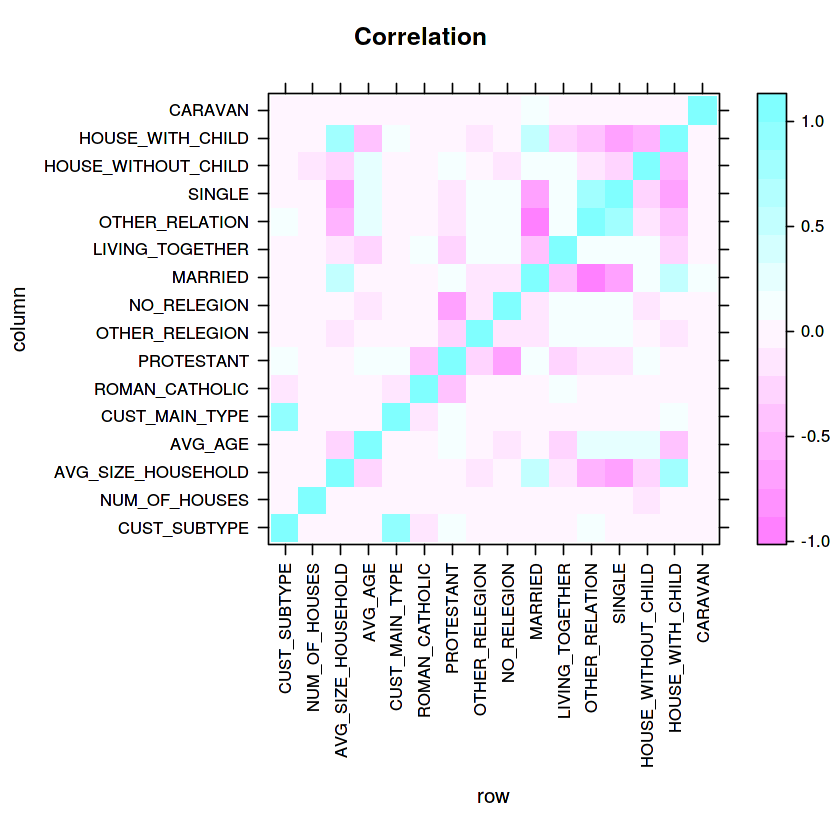

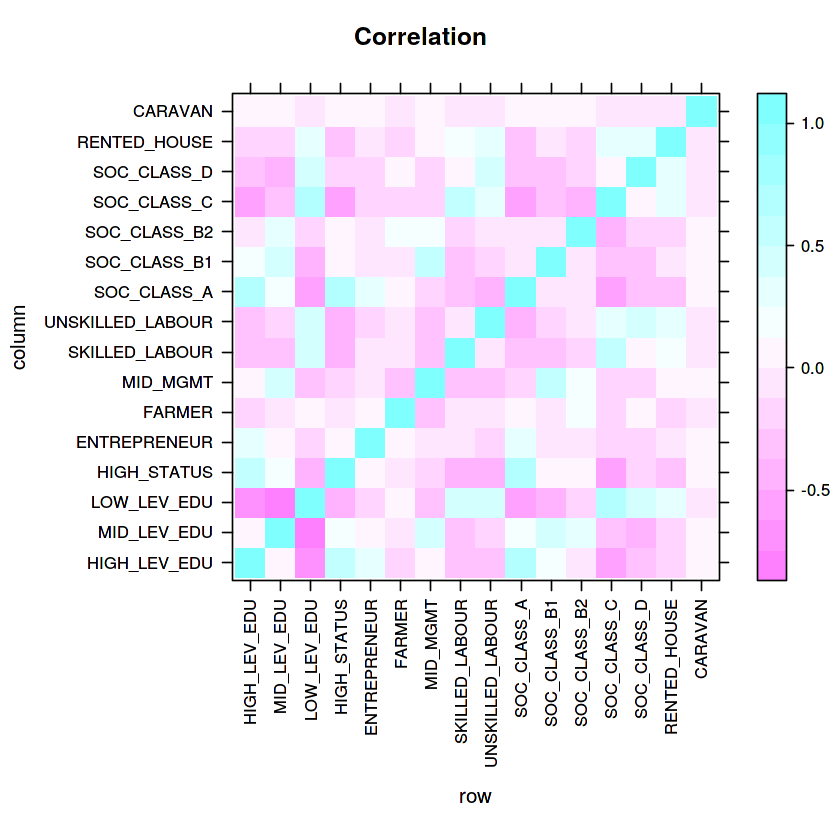

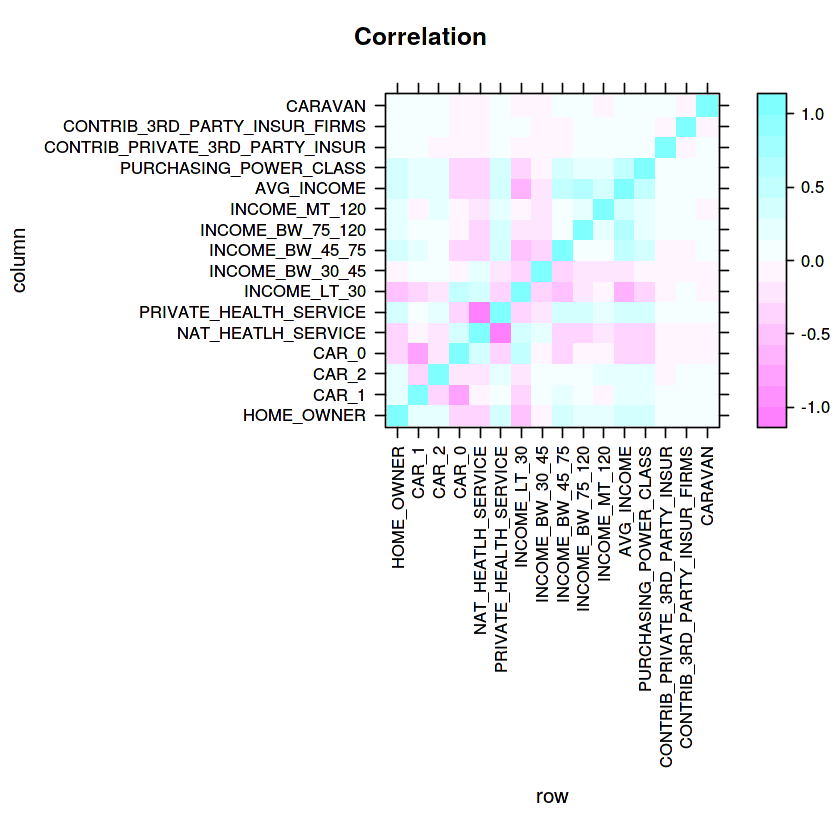

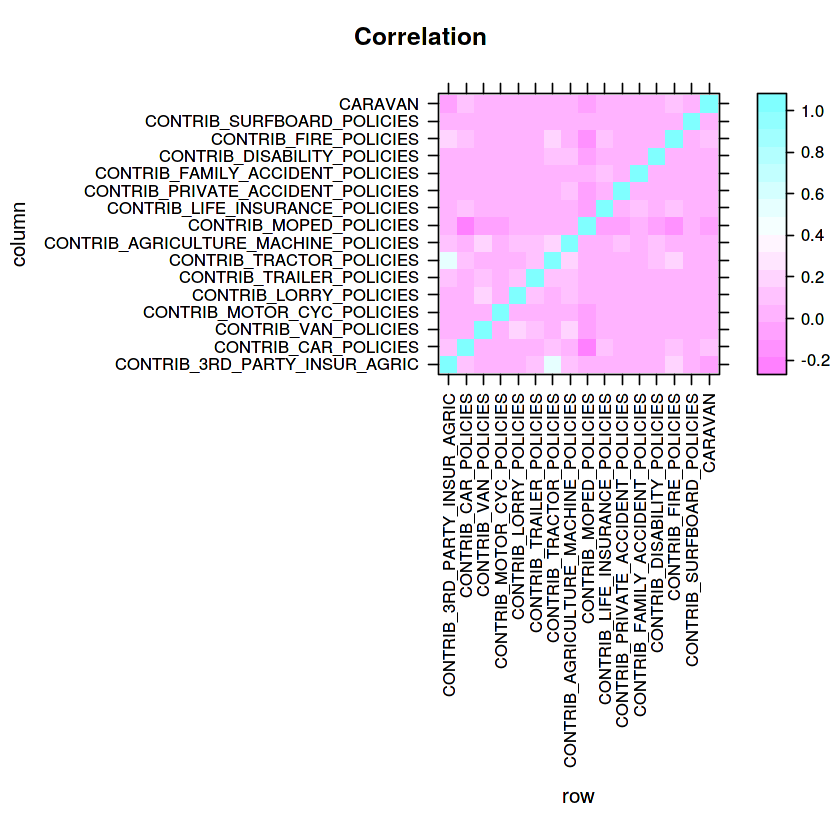

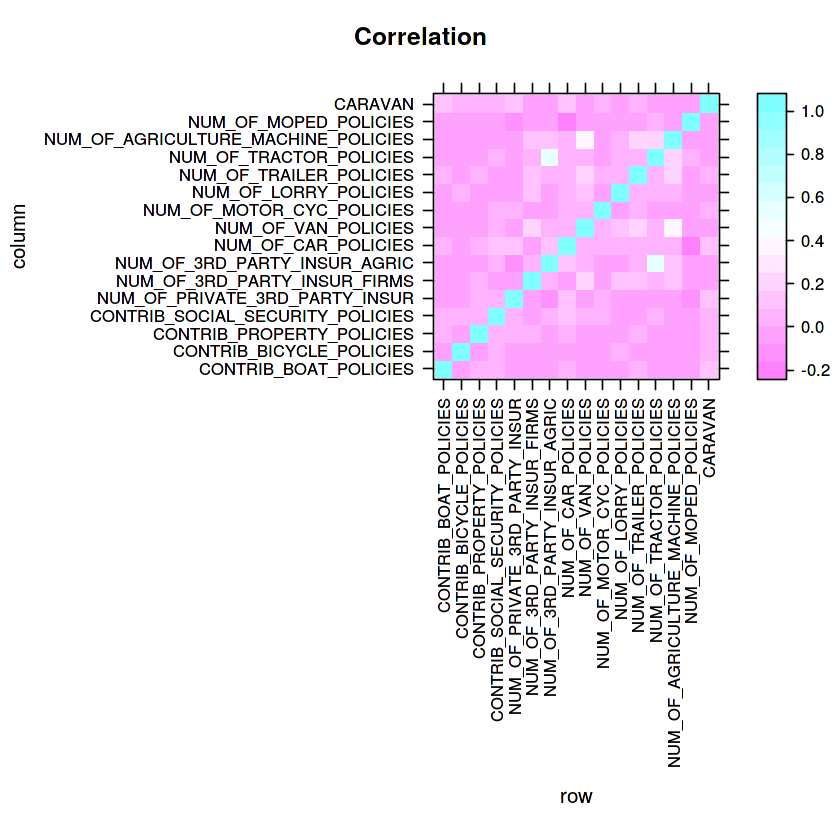

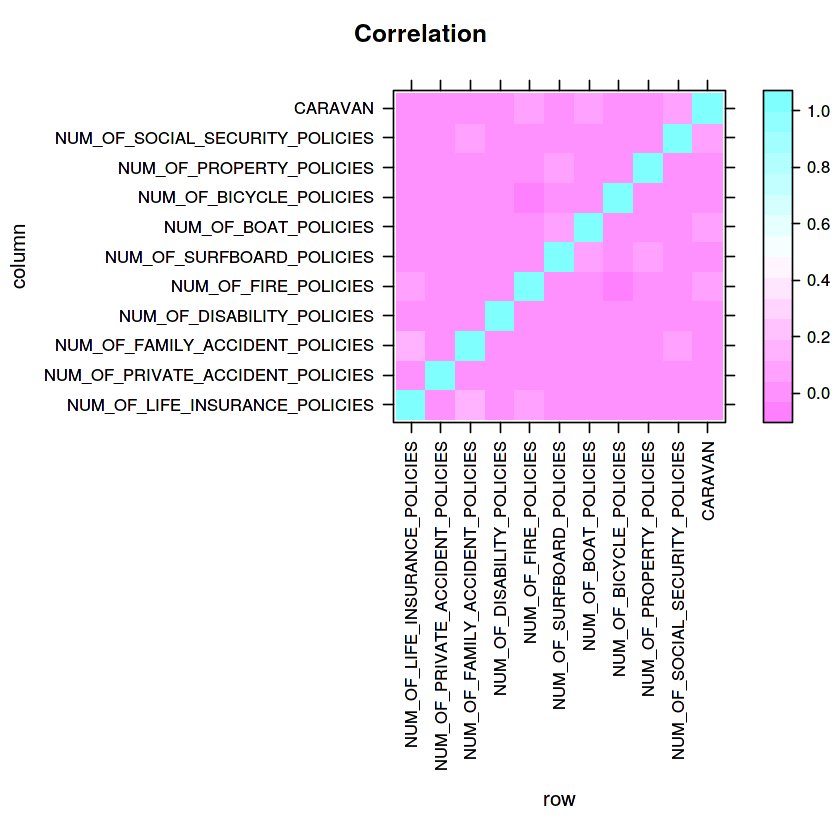

In [62]:

# par(mfrow = c(1,1)) # 6 x 2 grid
levelplot(cor(insTrainData[,c(1:15,86)]), scales = list(x = list(rot = 90)),main = "Correlation")
levelplot(cor(insTrainData[,c(16:30,86)]), scales = list(x = list(rot = 90)),main = "Correlation")
levelplot(cor(insTrainData[,c(31:45,86)]), scales = list(x = list(rot = 90)),main = "Correlation")
levelplot(cor(insTrainData[,c(46:60, 86)]), scales = list(x = list(rot = 90)),main = "Correlation")
levelplot(cor(insTrainData[,c(61:75,86)]), scales = list(x = list(rot = 90)),main = "Correlation")
levelplot(cor(insTrainData[,c(76:86)]), scales = list(x = list(rot = 90)),main = "Correlation")



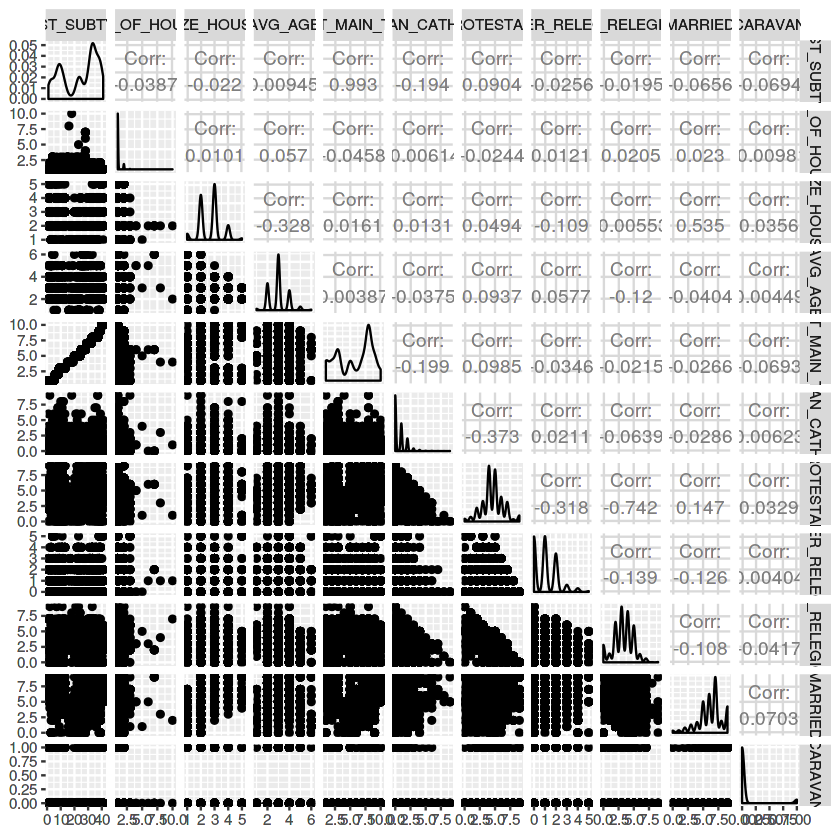

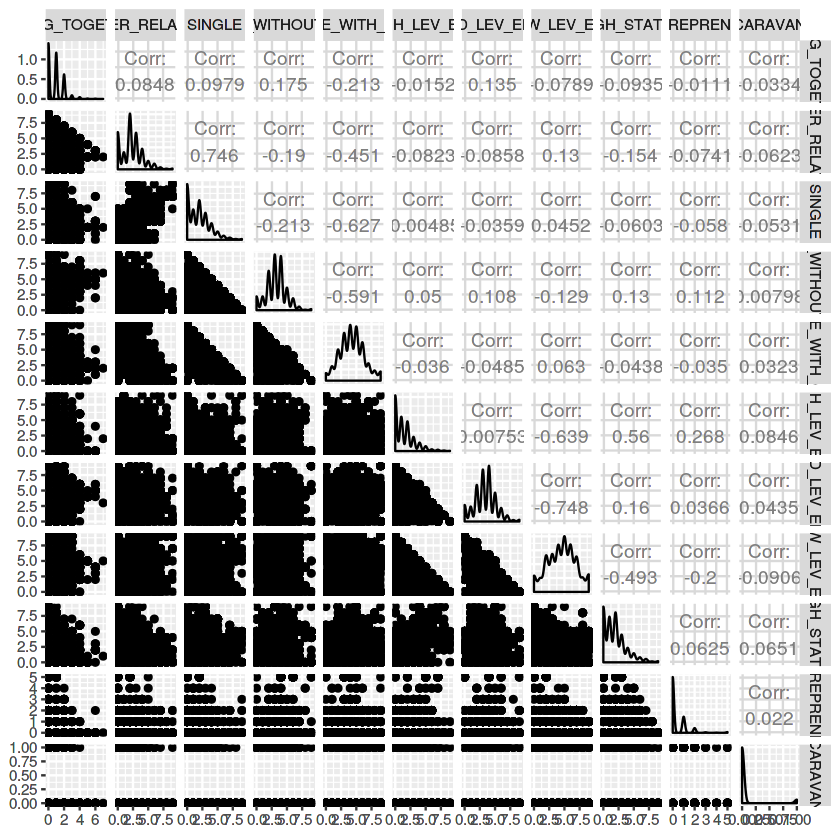

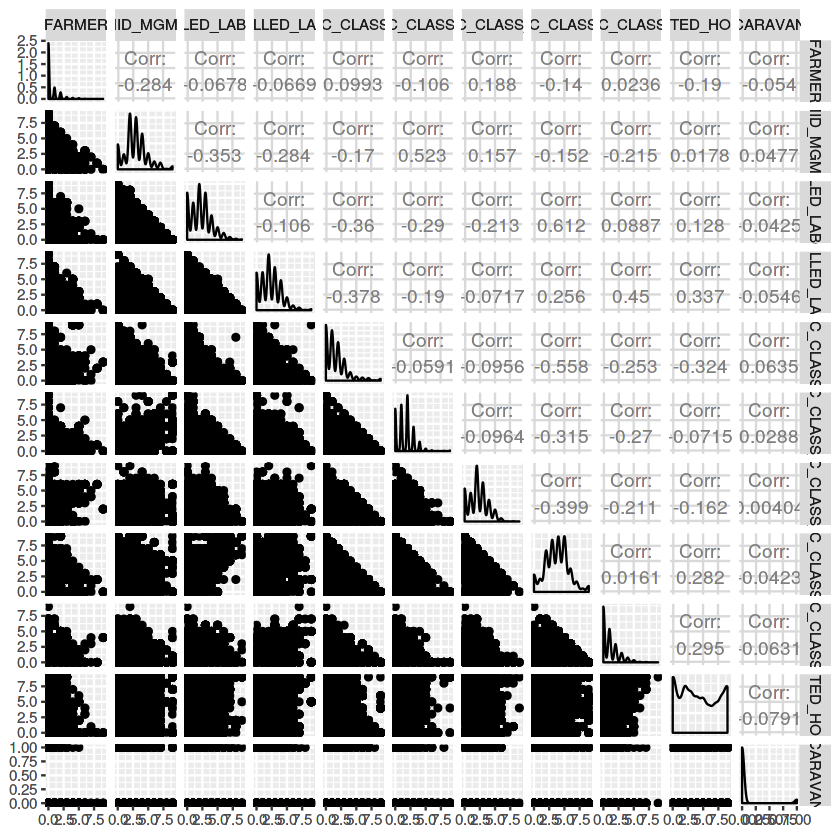

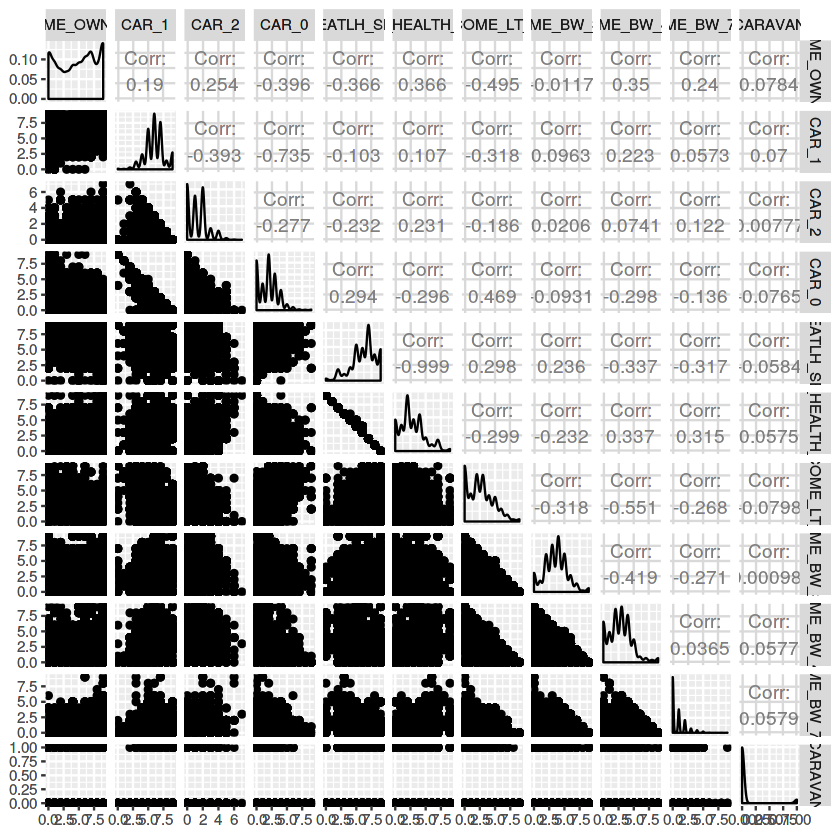

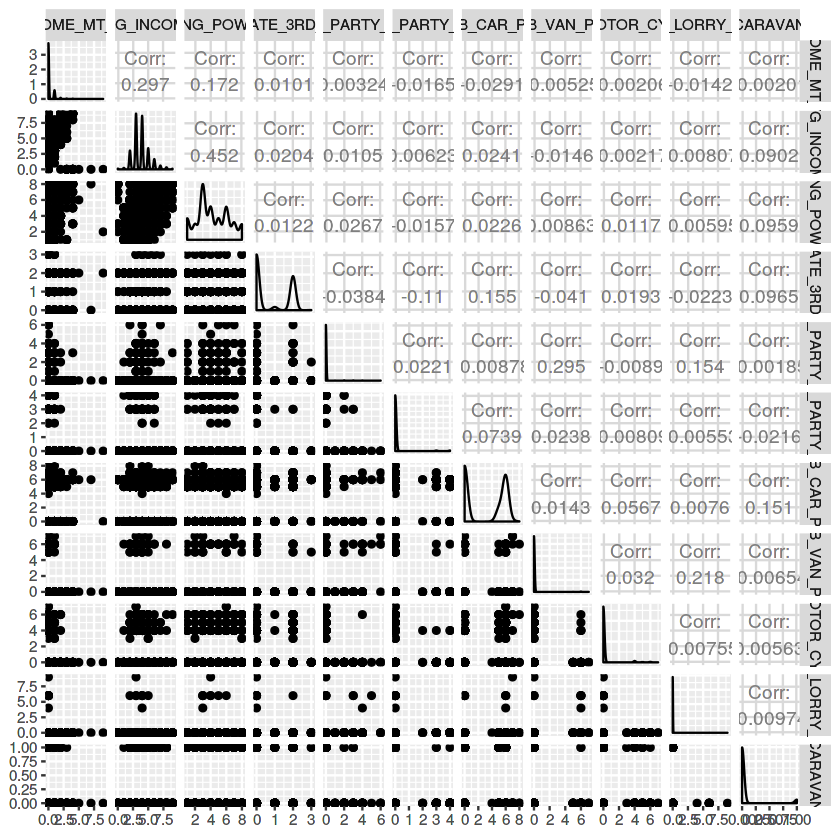

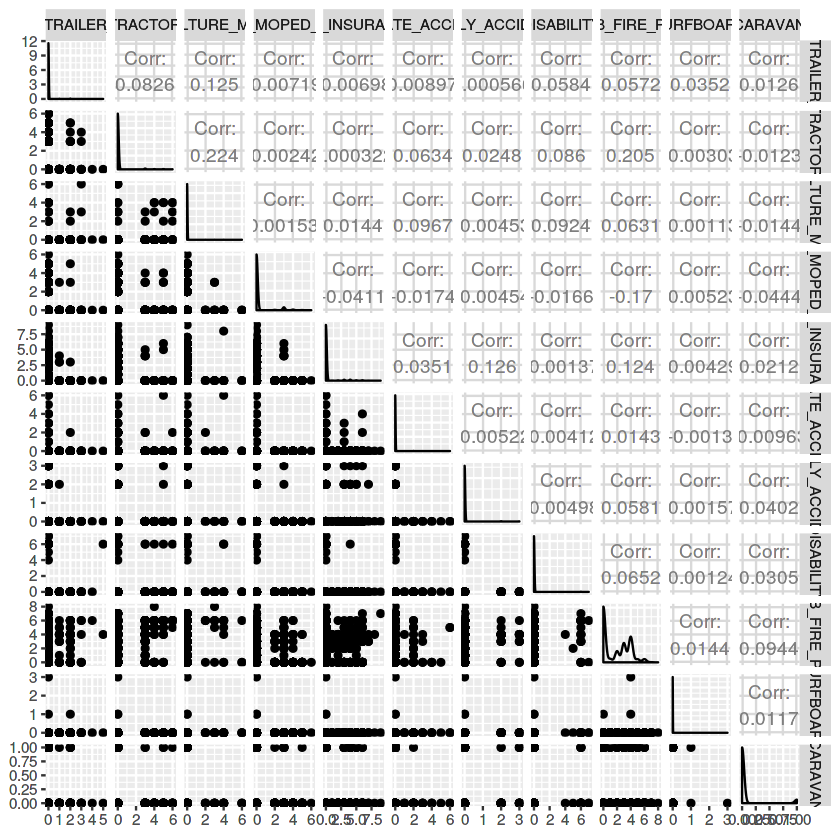

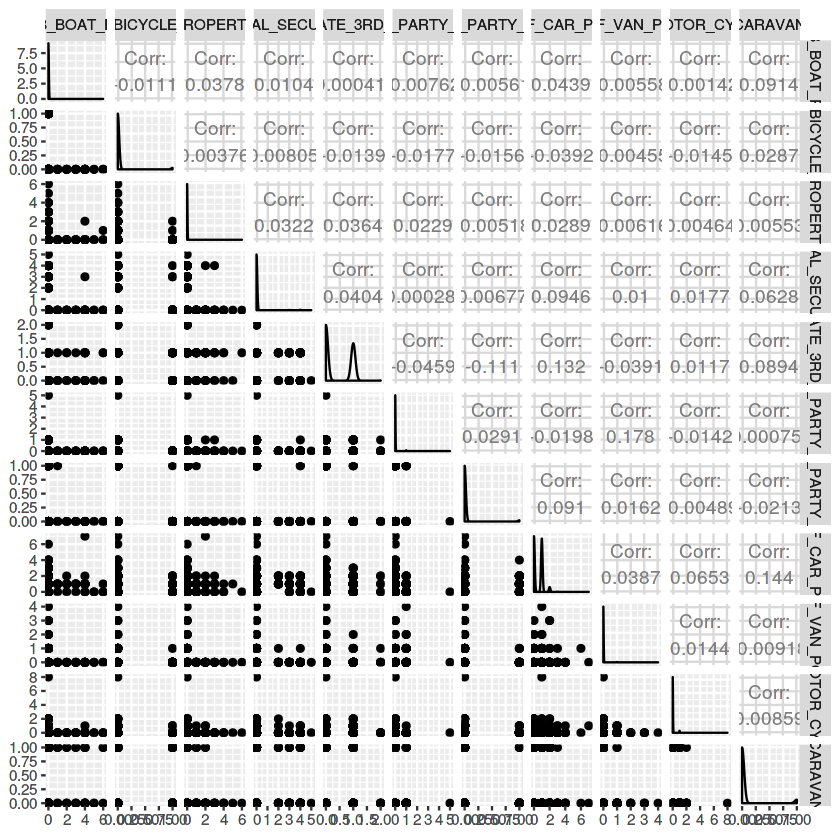

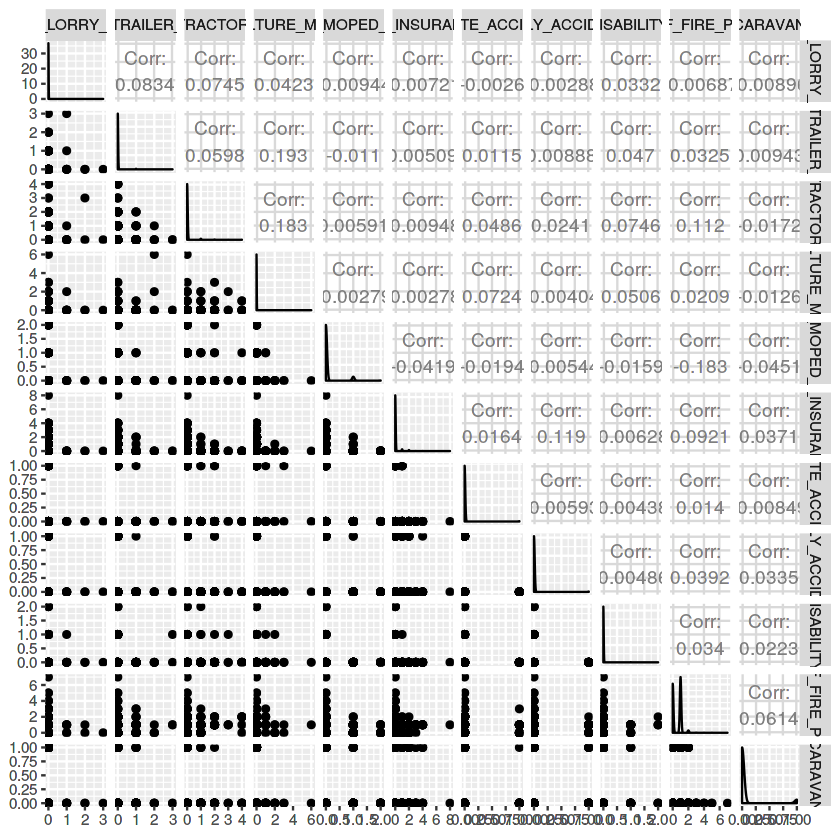

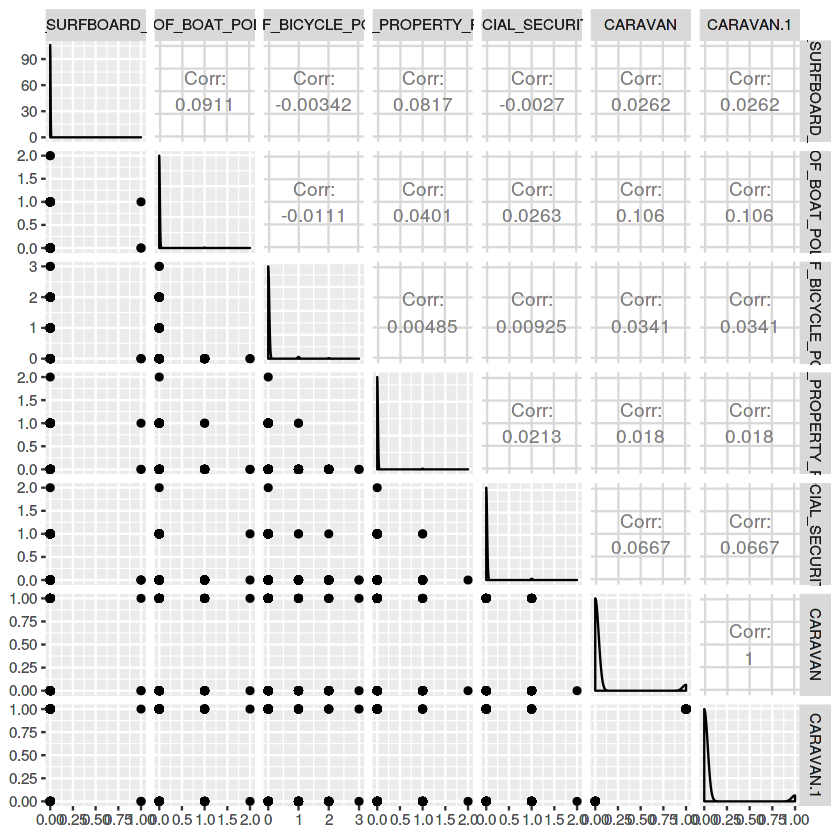

In [63]:
# par(mfrow = c(1,1)) # 6 x 2 grid
ggpairs(insTrainData[,c(1:10,86)])
ggpairs(insTrainData[,c(11:20,86)])
ggpairs(insTrainData[,c(21:30,86)])
ggpairs(insTrainData[,c(31:40,86)])
ggpairs(insTrainData[,c(41:50,86)])
ggpairs(insTrainData[,c(51:60,86)])
ggpairs(insTrainData[,c(61:70,86)])
ggpairs(insTrainData[,c(71:80,86)])
ggpairs(insTrainData[,c(81:86,86)])



We can see in the graph and tables there are only very few variables having corelation of mroe than 0.1 with CARAVAN
for eg. 
- Num_OF_BOAT_POLICIES = 0.1056995045	
- Num_OF_CAR_POLICIES = 0.14421046
- CONTRIB_CAR_POLICIES = 0.150909715

WE can also see there are certain predictor variables which have high corelation among themselves for eg. CAR_0, CAR_1, CAR_2. We can consider single variable out out those 3 (whoever have highest corelation with CARAVAN)

First few variables of dataframe have gaussian distribution.


Now that we know that these variables have high corelation with CARAVAN, we will explore relation of these variables with CARAVAN graphically

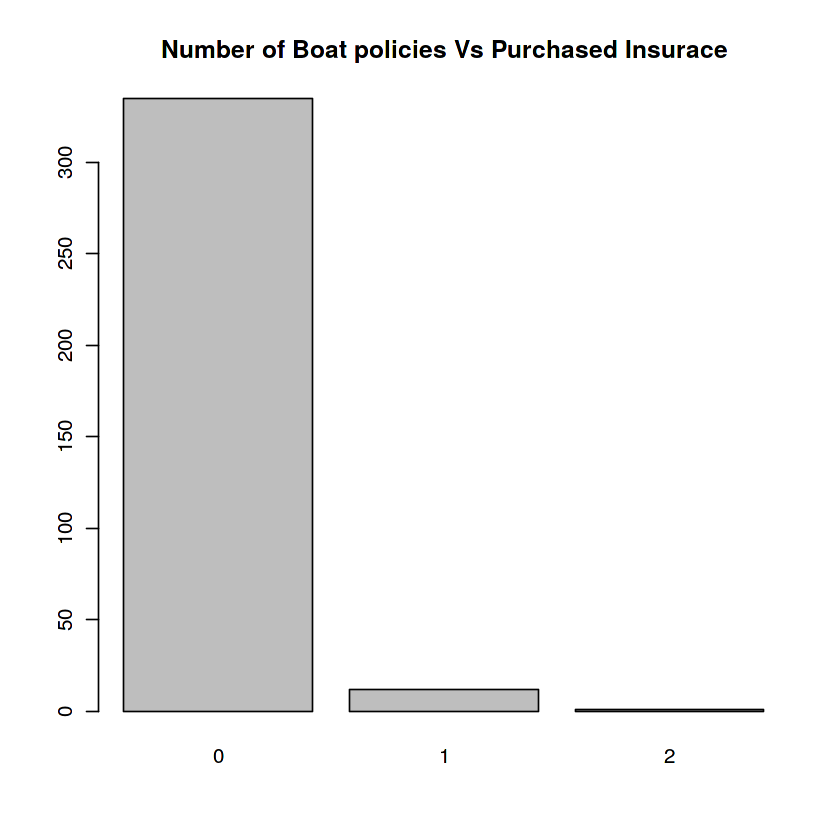

In [64]:
barplot(table(insTrainData$NUM_OF_BOAT_POLICIES[insTrainData$CARAVAN==1]), main ="Number of Boat policies Vs Purchased Insurace")

From the above hraph we can affirm that customer without any boat policy are more probable to buy the insurance as compared to those who buy boat policies.

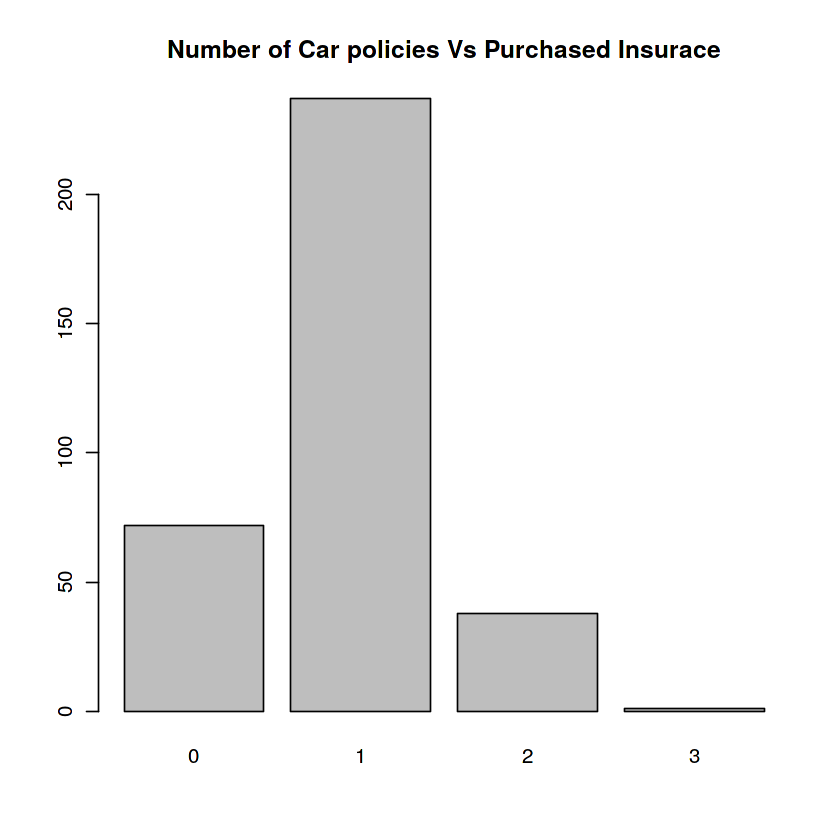

In [65]:
barplot(table(insTrainData$NUM_OF_CAR_POLICIES[insTrainData$CARAVAN==1]), main ="Number of Car policies Vs Purchased Insurace")

Similarly, we can identify that customer with 1 (or more) car policy are more likely to buy the insurance.

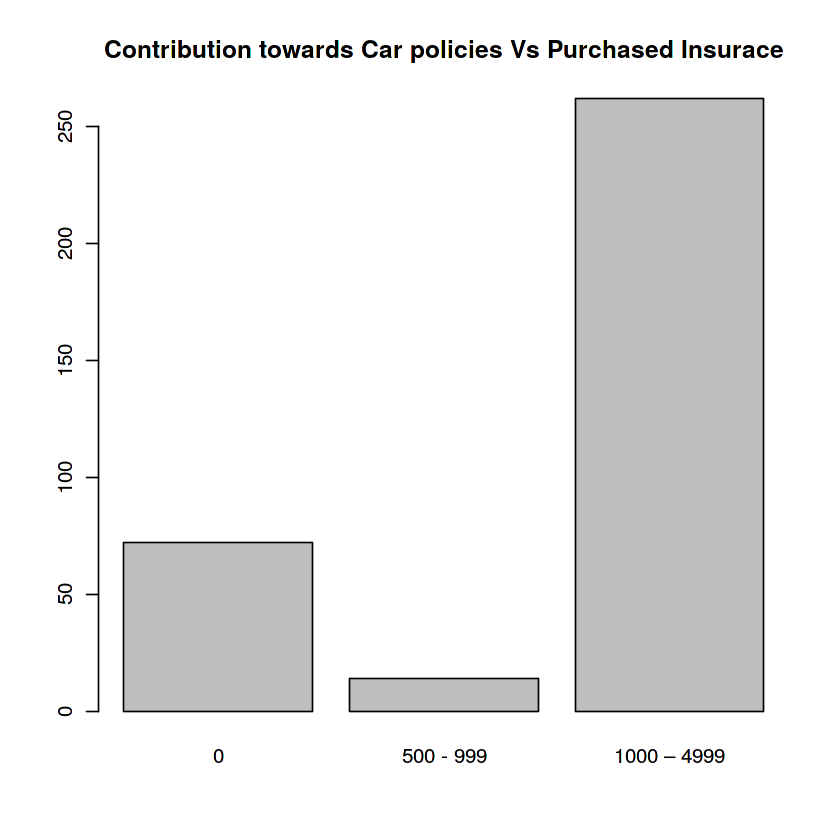

In [66]:
barplot(table(insTrainData$CONTRIB_CAR_POLICIES[insTrainData$CARAVAN==1]), main ="Contribution towards Car policies Vs Purchased Insurace", names= c("0","500 - 999","1000 – 4999"))

We can determine from the graph that customer who are spending more on the Car policies might more likely end up buying the Caravan insurance as well.

***


***
## 3. Model Development<a class="anchor" id="sec_3"></a>

Now that we are done with Data Exploration, Next step will be is to create models for prediction.
We have first developed **Feature Selection** models which will help usidentify key features of the model. After which we have developed the **Prediction Models** to predict the score and the first 800 customer who would be more likely to buy the  insurance.

### A. Feature Selection Models

We have discovered in EDA that there are a large number of predictor variables(X) in the data.

In our EDA, we have also identified that there are certain predictor variables(X) which does not have or have minimal association with target variable i.e. CARAVAN.

It leads to unnecessary complexity in our model and hence there is the need of removing irrelevant variables by setting their coeﬃcient to 0 increases the interpretability of the resulting model.

Thus below are few key models for variable selection. 

In our classes we have covered Subset Selection and Shrinkage methods and we will try and implement them in this project.

#### MRMR (Minimum Redundancy, Maximum Relevance) Feature Selection

Before covering subset selection or Shrinkage methods, we will apply MRMR (Minimum Redundancy, Maximum Relevance) method from the package praznik in order to select the features which have high corelation with target variables and low corelation among other predictor variables

Praznik package: A collection of feature selection filters performing greedy optimisation of mutual information-based usefulness criteria, inspired by the overview by Brown, Pocock, Zhao and Lujan (2012) <http://www.jmlr.org/papers/v13/brown12a.html>. Implements, among other, minimum redundancy maximal relevancy ('mRMR') method by Peng, Long and Ding (2005) <doi:10.1109/TPAMI.2005.159>; joint mutual information ('JMI') method by Yang and Moody (1999) <http://papers.nips.cc/paper/1779-data-visualization-and-feature-selection-new-algorithms-for-nongaussian-data>; double input symmetrical relevance ('DISR') method by Meyer and Bontempi (2006) <doi:10.1007/11732242_9> as well as joint mutual information maximisation ('JMIM') method by Bennasar, Hicks and Setchi (2015) <doi:10.1016/j.eswa.2015.07.007>.

In [67]:
# library(praznik)
# MRMR(insTrainData[,-86], insTrainData[,86],43)
# # as this library is not working on Monash Jupyter hub. I've ran the above code in R studio and copied the results here.

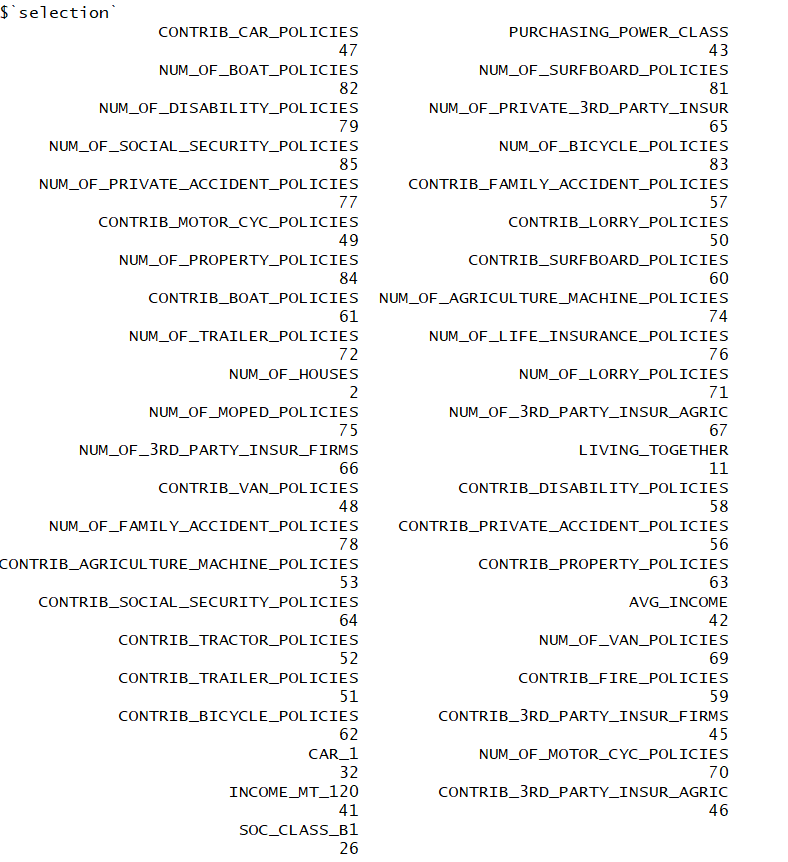

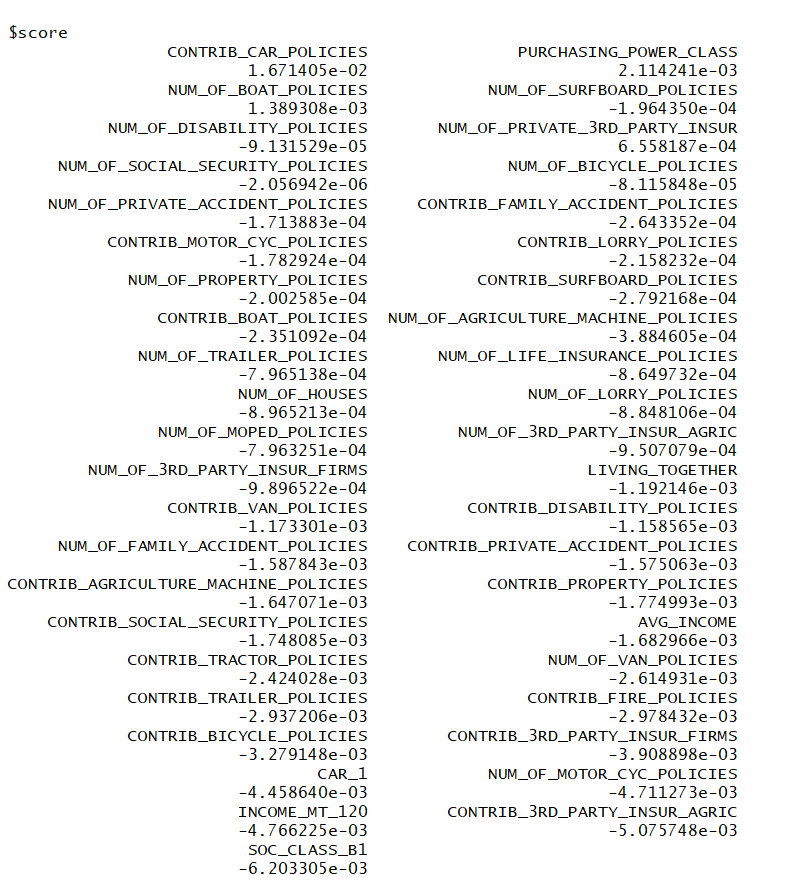


Above are some of the key variables identified from MRMR selection method. 
Now we will create a subset of training data with these features and use them for our prediction.

In [68]:
insTrainData.MRMR=insTrainData[c('CONTRIB_CAR_POLICIES','PURCHASING_POWER_CLASS', 
'NUM_OF_BOAT_POLICIES','NUM_OF_SURFBOARD_POLICIES', 
'NUM_OF_DISABILITY_POLICIES','NUM_OF_PRIVATE_3RD_PARTY_INSUR', 
'NUM_OF_SOCIAL_SECURITY_POLICIES','NUM_OF_BICYCLE_POLICIES', 
'NUM_OF_PRIVATE_ACCIDENT_POLICIES','CONTRIB_FAMILY_ACCIDENT_POLICIES', 
'CONTRIB_MOTOR_CYC_POLICIES','CONTRIB_LORRY_POLICIES', 
'NUM_OF_PROPERTY_POLICIES','CONTRIB_SURFBOARD_POLICIES', 
'CONTRIB_BOAT_POLICIES','NUM_OF_AGRICULTURE_MACHINE_POLICIES', 
'NUM_OF_TRAILER_POLICIES','NUM_OF_LIFE_INSURANCE_POLICIES', 
'NUM_OF_HOUSES','NUM_OF_LORRY_POLICIES', 
'NUM_OF_MOPED_POLICIES','NUM_OF_3RD_PARTY_INSUR_AGRIC', 
'NUM_OF_3RD_PARTY_INSUR_FIRMS','LIVING_TOGETHER', 
'CONTRIB_VAN_POLICIES','CONTRIB_DISABILITY_POLICIES', 
'NUM_OF_FAMILY_ACCIDENT_POLICIES','CONTRIB_PRIVATE_ACCIDENT_POLICIES', 
'CONTRIB_AGRICULTURE_MACHINE_POLICIES','CONTRIB_PROPERTY_POLICIES','CONTRIB_SOCIAL_SECURITY_POLICIES','AVG_INCOME',
    'CONTRIB_TRACTOR_POLICIES','NUM_OF_VAN_POLICIES',
    'CONTRIB_TRAILER_POLICIES','CONTRIB_FIRE_POLICIES',
    'CONTRIB_BICYCLE_POLICIES','CONTRIB_3RD_PARTY_INSUR_FIRMS',
    'CAR_1','NUM_OF_MOTOR_CYC_POLICIES',
    'INCOME_MT_120','CONTRIB_3RD_PARTY_INSUR_AGRIC',
    'SOC_CLASS_B1','CARAVAN')]

insTestData.MRMR=insTestData[c('CONTRIB_CAR_POLICIES','PURCHASING_POWER_CLASS', 
'NUM_OF_BOAT_POLICIES','NUM_OF_SURFBOARD_POLICIES', 
'NUM_OF_DISABILITY_POLICIES','NUM_OF_PRIVATE_3RD_PARTY_INSUR', 
'NUM_OF_SOCIAL_SECURITY_POLICIES','NUM_OF_BICYCLE_POLICIES', 
'NUM_OF_PRIVATE_ACCIDENT_POLICIES','CONTRIB_FAMILY_ACCIDENT_POLICIES', 
'CONTRIB_MOTOR_CYC_POLICIES','CONTRIB_LORRY_POLICIES', 
'NUM_OF_PROPERTY_POLICIES','CONTRIB_SURFBOARD_POLICIES', 
'CONTRIB_BOAT_POLICIES','NUM_OF_AGRICULTURE_MACHINE_POLICIES', 
'NUM_OF_TRAILER_POLICIES','NUM_OF_LIFE_INSURANCE_POLICIES', 
'NUM_OF_HOUSES','NUM_OF_LORRY_POLICIES', 
'NUM_OF_MOPED_POLICIES','NUM_OF_3RD_PARTY_INSUR_AGRIC', 
'NUM_OF_3RD_PARTY_INSUR_FIRMS','LIVING_TOGETHER', 
'CONTRIB_VAN_POLICIES','CONTRIB_DISABILITY_POLICIES', 
'NUM_OF_FAMILY_ACCIDENT_POLICIES','CONTRIB_PRIVATE_ACCIDENT_POLICIES', 
'CONTRIB_AGRICULTURE_MACHINE_POLICIES','CONTRIB_PROPERTY_POLICIES','CONTRIB_SOCIAL_SECURITY_POLICIES','AVG_INCOME',
    'CONTRIB_TRACTOR_POLICIES','NUM_OF_VAN_POLICIES',
    'CONTRIB_TRAILER_POLICIES','CONTRIB_FIRE_POLICIES',
    'CONTRIB_BICYCLE_POLICIES','CONTRIB_3RD_PARTY_INSUR_FIRMS',
    'CAR_1','NUM_OF_MOTOR_CYC_POLICIES',
    'INCOME_MT_120','CONTRIB_3RD_PARTY_INSUR_AGRIC',
    'SOC_CLASS_B1')]

#### Forward Stepwise Selection (Subset Selection )

In forward stepwise selection we will use the regsubsets() function (from the <a href="https://cran.r-project.org/web/packages/leaps/leaps.pdf">leaps</a> package) to perform best subset selection in order to choose the best model containing the predictors variables according to $C_p$, $BIC$, and adjusted $R^2$.
It starts with an empty set of variables/features and progressively add features.


Advantage: Forward selection gives us the direct estimate of the test error, and makes less assumptions about the true underlying model.

We have used this model on the features returned from MRMR to select the variables having low corelation among themselves and high corelation with target variables.

In [69]:
fit_forward <- regsubsets(CARAVAN ~ ., data = insTrainData.MRMR, method = "forward", nvmax=85)

summary.forw=summary(fit_forward)
summary.forw

Subset selection object
Call: regsubsets.formula(CARAVAN ~ ., data = insTrainData.MRMR, method = "forward", 
    nvmax = 85)
43 Variables  (and intercept)
                                     Forced in Forced out
CONTRIB_CAR_POLICIES                     FALSE      FALSE
PURCHASING_POWER_CLASS                   FALSE      FALSE
NUM_OF_BOAT_POLICIES                     FALSE      FALSE
NUM_OF_SURFBOARD_POLICIES                FALSE      FALSE
NUM_OF_DISABILITY_POLICIES               FALSE      FALSE
NUM_OF_PRIVATE_3RD_PARTY_INSUR           FALSE      FALSE
NUM_OF_SOCIAL_SECURITY_POLICIES          FALSE      FALSE
NUM_OF_BICYCLE_POLICIES                  FALSE      FALSE
NUM_OF_PRIVATE_ACCIDENT_POLICIES         FALSE      FALSE
CONTRIB_FAMILY_ACCIDENT_POLICIES         FALSE      FALSE
CONTRIB_MOTOR_CYC_POLICIES               FALSE      FALSE
CONTRIB_LORRY_POLICIES                   FALSE      FALSE
NUM_OF_PROPERTY_POLICIES                 FALSE      FALSE
CONTRIB_SURFBOARD_POLICIES       

To select the variables, we will plot measure of $C_p$, $BIC$, and adjusted $R^2$.
- A better model should have small value of $C_p$ and $BIC$ which actually indicates a low error. 
- A better model should have large value for the Adjusted $R^2$.


[1] "minimum number of variables are  16"


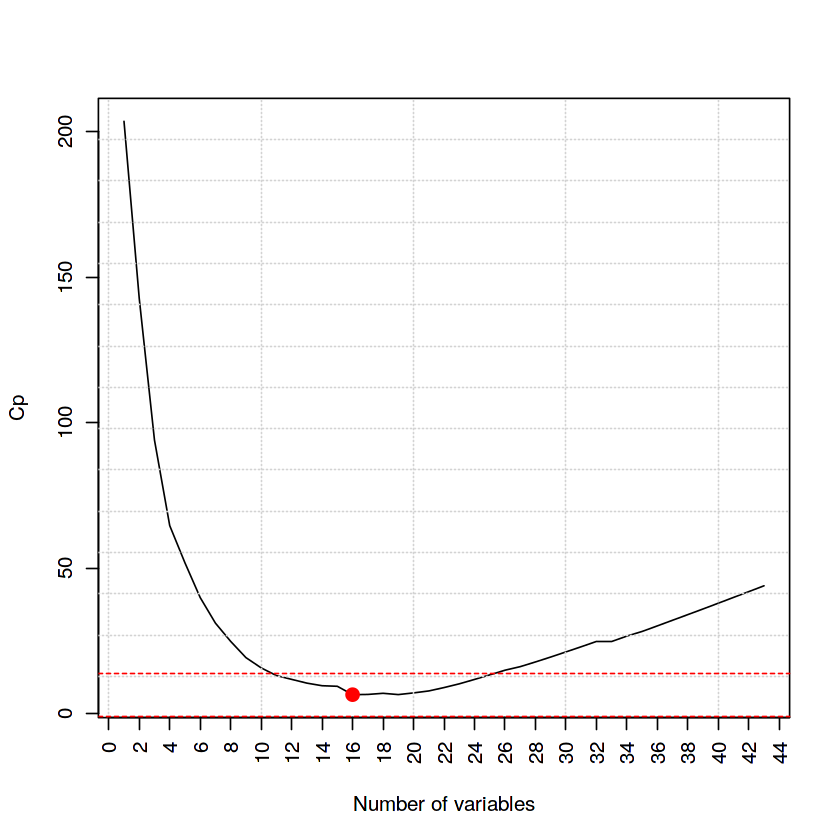

[1] "minimum number of variables are  7"


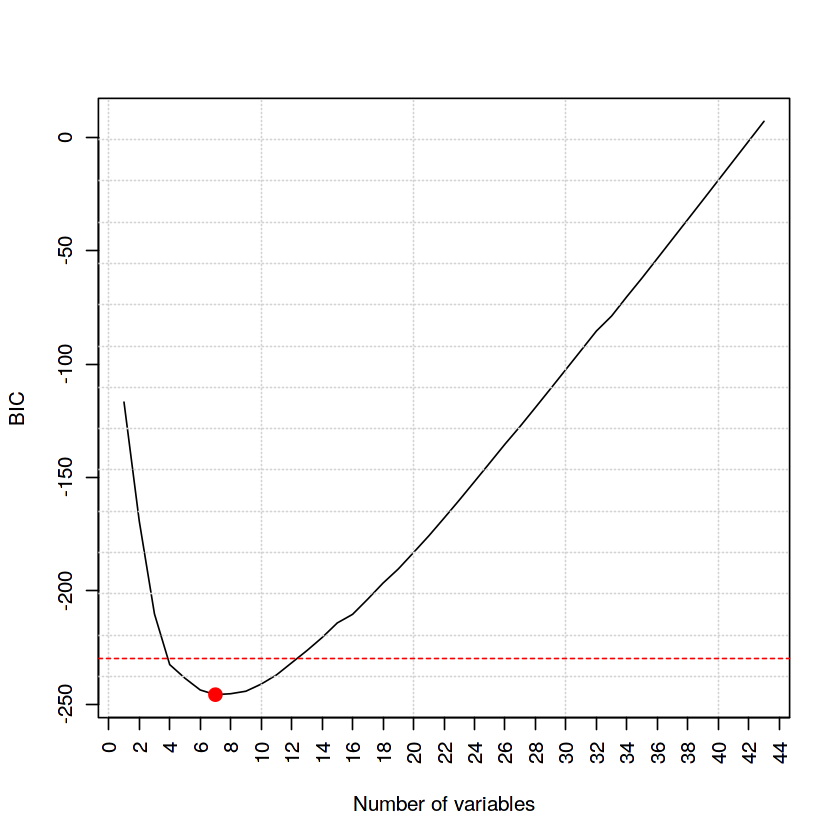

[1] "minimum number of variables are  21"


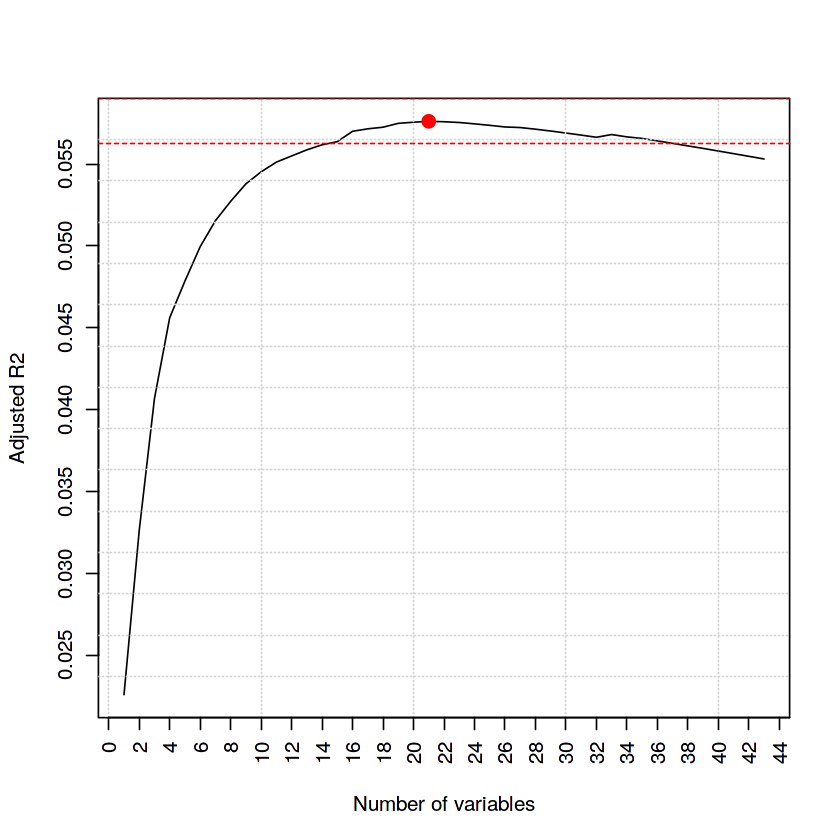

In [70]:
plot(summary.forw$cp, xlab = "Number of variables", ylab = "Cp", type = "l",xaxt='n')
grid(, 15) 
axis(1, at = seq(0, 86, by = 2), las=2)
min.cp <- min(summary.forw$cp)
std.cp <- sd(summary.forw$cp)
abline(h = min.cp + 0.2 * std.cp, col = "red", lty = 2)
abline(h = min.cp - 0.2 * std.cp, col = "red", lty = 2)
min.cp <- which.min(summary.forw$cp)
print(paste("minimum number of variables are ",min.cp))
points(min.cp, summary.forw$cp[min.cp], col = "red", cex = 2, pch = 20)

plot(summary.forw$bic, xlab = "Number of variables", ylab = "BIC", type='l',xaxt='n')
grid(, 15) 
axis(1, at = seq(0, 86, by = 2), las=2)
min.bic <- min(summary.forw$bic)
std.bic <- sd(summary.forw$bic)
abline(h = min.bic + 0.2 * std.bic, col = "red", lty = 2)
abline(h = min.bic - 0.2 * std.bic, col = "red", lty = 2)
min.bic <- which.min(summary.forw$bic)
print(paste("minimum number of variables are ",min.bic))
points(min.bic, summary.forw$bic[which.min(summary.forw$bic)], col = "red", cex = 2, pch = 20)

plot(summary.forw$adjr2, xlab = "Number of variables", ylab = "Adjusted R2", type = "l",xaxt='n')
grid(, 15) 
axis(1, at = seq(0, 86, by = 2), las=2)
max.adjr2 <- max(summary.forw$adjr2)
std.adjr2 <- sd(summary.forw$adjr2)
abline(h = max.adjr2 + 0.2 * std.adjr2, col = "red", lty = 2)
abline(h = max.adjr2 - 0.2 * std.adjr2, col = "red", lty = 2)
max.adjr2 <- which.max(summary.forw$adjr2)
print(paste("minimum number of variables are ",max.adjr2))
points(max.adjr2, summary.forw$adjr2[max.adjr2], col = "red", cex = 2, pch = 20)


We will emphasize more on $C_p$, $BIC$ rather than adjusted $R^2$, as it is related to the training error, which generally is a poor estimate of test error. 

For our model, we will pick 11 as the best subset as it seems like the minimum size of the subset for which the score are within the range of 0.2 standard deviations from optimal value. 

In [71]:
# plot(fit_forward)
coeffs <- coef(fit_forward, id = 11)
MRMR.forward_variables = names(coeffs)
MRMR.forward_variables

[1] "(Intercept)"                     "CONTRIB_CAR_POLICIES"           
 [3] "PURCHASING_POWER_CLASS"          "NUM_OF_BOAT_POLICIES"           
 [5] "NUM_OF_PRIVATE_3RD_PARTY_INSUR"  "NUM_OF_SOCIAL_SECURITY_POLICIES"
 [7] "NUM_OF_BICYCLE_POLICIES"         "NUM_OF_3RD_PARTY_INSUR_AGRIC"   
 [9] "CONTRIB_DISABILITY_POLICIES"     "AVG_INCOME"                     
[11] "CONTRIB_FIRE_POLICIES"           "CAR_1"

We will identify these 11 variables and create a subset which we can use in prediction model to see how it scores on prediction.

In [72]:
insTrainData.fit_fwd=insTrainData[c('CONTRIB_CAR_POLICIES','PURCHASING_POWER_CLASS', 
'NUM_OF_BOAT_POLICIES','NUM_OF_PRIVATE_3RD_PARTY_INSUR', 
'NUM_OF_SOCIAL_SECURITY_POLICIES','NUM_OF_BICYCLE_POLICIES', 
'NUM_OF_3RD_PARTY_INSUR_AGRIC', 
'CONTRIB_DISABILITY_POLICIES', 
'AVG_INCOME','CONTRIB_FIRE_POLICIES',
    'CAR_1','CARAVAN')]

insTestData.fit_fwd=insTestData[c('CONTRIB_CAR_POLICIES','PURCHASING_POWER_CLASS', 
'NUM_OF_BOAT_POLICIES','NUM_OF_PRIVATE_3RD_PARTY_INSUR', 
'NUM_OF_SOCIAL_SECURITY_POLICIES','NUM_OF_BICYCLE_POLICIES', 
'NUM_OF_3RD_PARTY_INSUR_AGRIC', 
'CONTRIB_DISABILITY_POLICIES', 
'AVG_INCOME','CONTRIB_FIRE_POLICIES',
    'CAR_1')]

#### Backward Stepwise Selection (Subset Selection )

In Backward stepwise selection we will use the regsubsets() function (from the <a href="https://cran.r-project.org/web/packages/leaps/leaps.pdf">leaps</a> package) to perform best subset selection in order to choose the best model containing the predictors variables according to $C_p$, $BIC$, and adjusted $R^2$.


Advantage: Forward selection gives us the direct estimate of the test error, and makes less assumptions about the true underlying model.

We have used this model on the features returned from MRMR to select the variables having low corelation among themselves and high corelation with target variables.

In [73]:
fit_backward <- regsubsets(CARAVAN ~ ., data = insTrainData.MRMR, method = "backward", nvmax=85)
summary.back=summary(fit_backward)
summary.back


Subset selection object
Call: regsubsets.formula(CARAVAN ~ ., data = insTrainData.MRMR, method = "backward", 
    nvmax = 85)
43 Variables  (and intercept)
                                     Forced in Forced out
CONTRIB_CAR_POLICIES                     FALSE      FALSE
PURCHASING_POWER_CLASS                   FALSE      FALSE
NUM_OF_BOAT_POLICIES                     FALSE      FALSE
NUM_OF_SURFBOARD_POLICIES                FALSE      FALSE
NUM_OF_DISABILITY_POLICIES               FALSE      FALSE
NUM_OF_PRIVATE_3RD_PARTY_INSUR           FALSE      FALSE
NUM_OF_SOCIAL_SECURITY_POLICIES          FALSE      FALSE
NUM_OF_BICYCLE_POLICIES                  FALSE      FALSE
NUM_OF_PRIVATE_ACCIDENT_POLICIES         FALSE      FALSE
CONTRIB_FAMILY_ACCIDENT_POLICIES         FALSE      FALSE
CONTRIB_MOTOR_CYC_POLICIES               FALSE      FALSE
CONTRIB_LORRY_POLICIES                   FALSE      FALSE
NUM_OF_PROPERTY_POLICIES                 FALSE      FALSE
CONTRIB_SURFBOARD_POLICIES      

To select the variables, we will plot measure of $C_p$, $BIC$, and adjusted $R^2$.
- A better model should have small value of $C_p$ and $BIC$ which actually indicates a low error. 
- A better model should have large value for the Adjusted $R^2$.


[1] "minimum number of variables are  18"


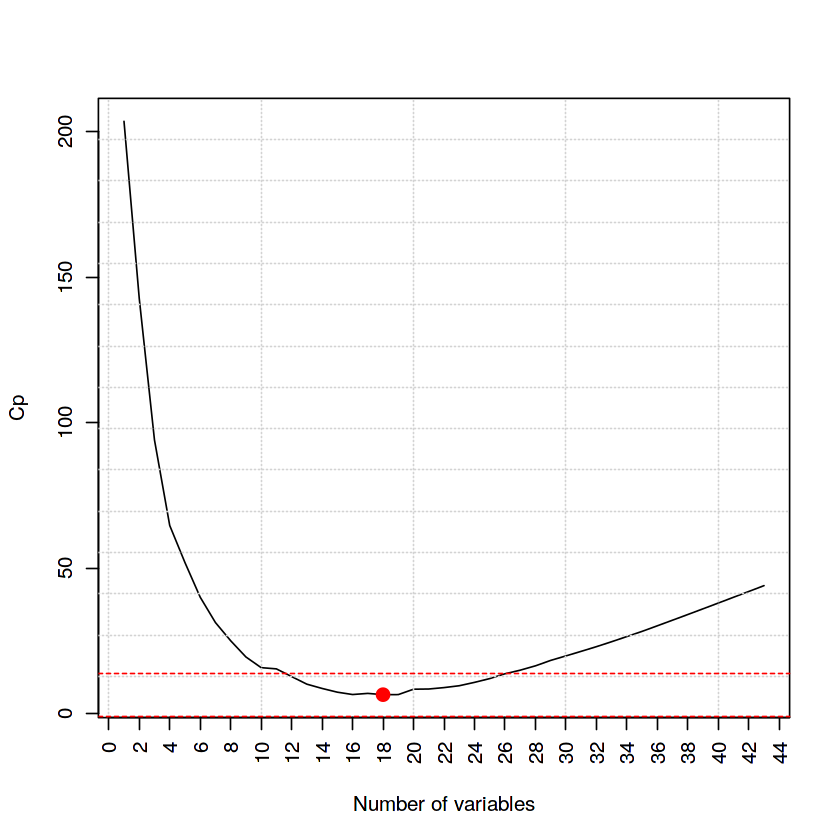

[1] "minimum number of variables are  7"


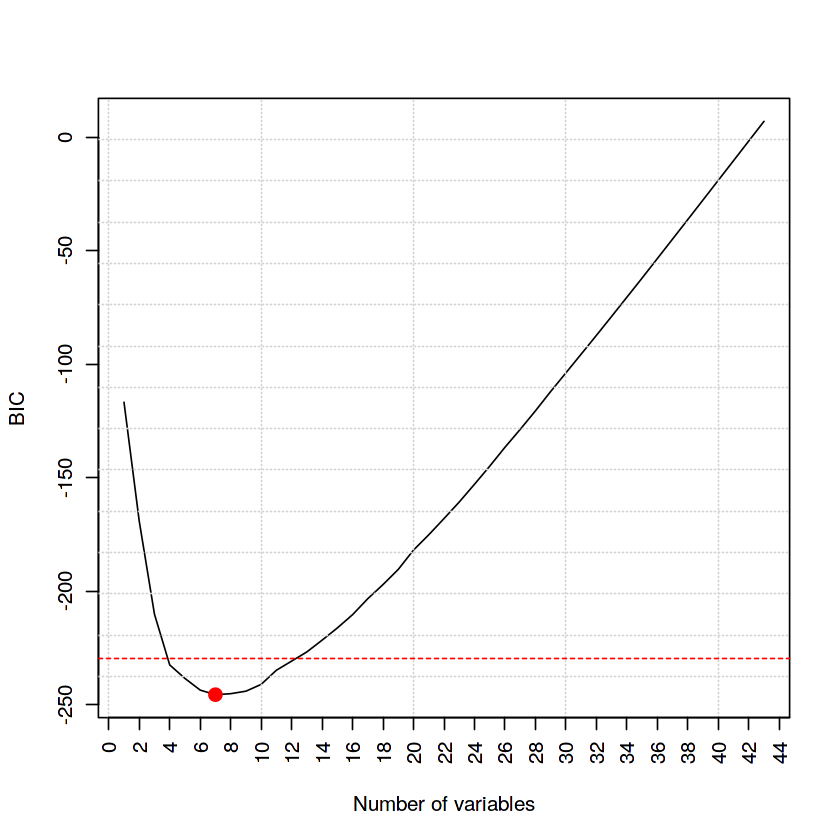

[1] "minimum number of variables are  23"


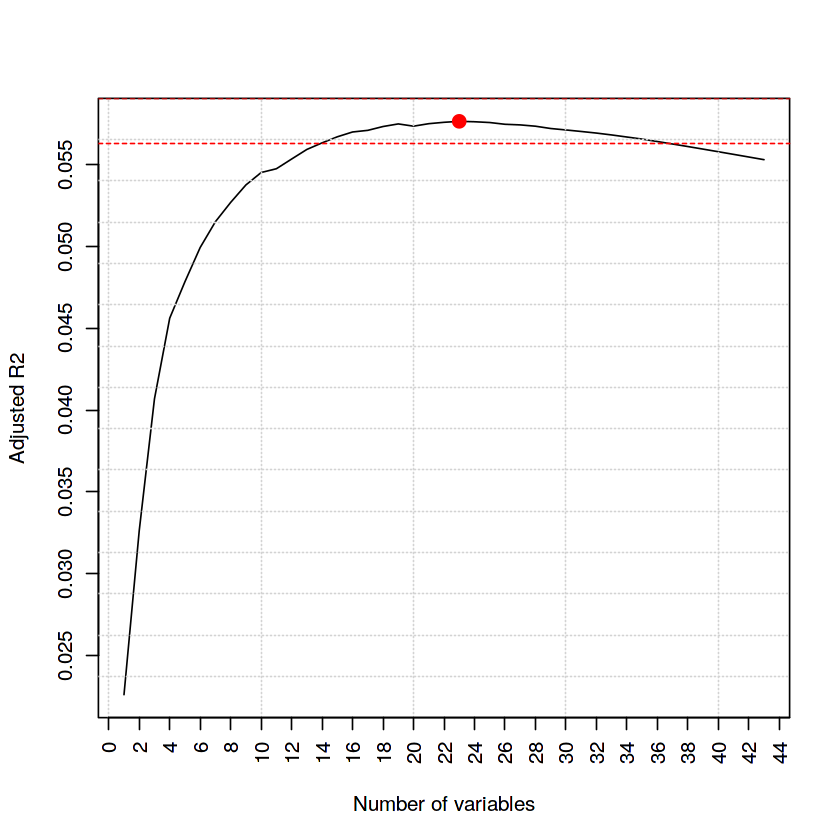

In [74]:
# Backwards 
plot(summary.back$cp, xlab = "Number of variables", ylab = "Cp", type = "l",xaxt='n')
grid(, 15) 
axis(1, at = seq(0, 86, by = 2), las=2)
min.cp <- min(summary.back$cp)
std.cp <- sd(summary.back$cp)
abline(h = min.cp + 0.2 * std.cp, col = "red", lty = 2)
abline(h = min.cp - 0.2 * std.cp, col = "red", lty = 2)
min.cp <- which.min(summary.back$cp)
print(paste("minimum number of variables are ",min.cp))
points(min.cp, summary.back$cp[min.cp], col = "red", cex = 2, pch = 20)

plot(summary.back$bic, xlab = "Number of variables", ylab = "BIC", type='l',xaxt='n')
grid(, 15) 
axis(1, at = seq(0, 86, by = 2), las=2)
min.bic <- min(summary.back$bic)
std.bic <- sd(summary.back$bic)
abline(h = min.bic + 0.2 * std.bic, col = "red", lty = 2)
abline(h = min.bic - 0.2 * std.bic, col = "red", lty = 2)
min.bic <- which.min(summary.back$bic)
print(paste("minimum number of variables are ",min.bic))
points(min.bic, summary.back$bic[which.min(summary.back$bic)], col = "red", cex = 2, pch = 20)

plot(summary.back$adjr2, xlab = "Number of variables", ylab = "Adjusted R2", type = "l",xaxt='n')
grid(, 15) 
axis(1, at = seq(0, 86, by = 2), las=2)
max.adjr2 <- max(summary.back$adjr2)
std.adjr2 <- sd(summary.back$adjr2)
abline(h = max.adjr2 + 0.2 * std.adjr2, col = "red", lty = 2)
abline(h = max.adjr2 - 0.2 * std.adjr2, col = "red", lty = 2)
max.adjr2 <- which.max(summary.back$adjr2)
print(paste("minimum number of variables are ",max.adjr2))
points(max.adjr2, summary.back$adjr2[max.adjr2], col = "red", cex = 2, pch = 20)

We will emphasize more on $C_p$, $BIC$ rather than adjusted $R^2$, as it is related to the training error, which generally is a poor estimate of test error. 

For our model, we will pick 12 as the best subset as it seems like the minimum size of the subset for which the score are within the range of 0.2 standard deviations from optimal value. 

In [75]:
# plot(fit_forward)
coeffs <- coef(fit_backward, id = 12)
MRMR.backward.variables <- names(coeffs)
MRMR.backward.variables

[1] "(Intercept)"                      "CONTRIB_CAR_POLICIES"            
 [3] "PURCHASING_POWER_CLASS"           "NUM_OF_BOAT_POLICIES"            
 [5] "NUM_OF_SOCIAL_SECURITY_POLICIES"  "NUM_OF_BICYCLE_POLICIES"         
 [7] "CONTRIB_FAMILY_ACCIDENT_POLICIES" "CONTRIB_DISABILITY_POLICIES"     
 [9] "NUM_OF_FAMILY_ACCIDENT_POLICIES"  "AVG_INCOME"                      
[11] "CONTRIB_FIRE_POLICIES"            "CAR_1"                           
[13] "CONTRIB_3RD_PARTY_INSUR_AGRIC"

We will identify these 12 variables and create a subset which we can use in prediction model to see how it scores on prediction.

In [76]:
insTrainData.fit_bwd=insTrainData[c('CONTRIB_CAR_POLICIES','PURCHASING_POWER_CLASS', 
'NUM_OF_BOAT_POLICIES','NUM_OF_PRIVATE_3RD_PARTY_INSUR', 
'NUM_OF_SOCIAL_SECURITY_POLICIES','NUM_OF_BICYCLE_POLICIES', 'CONTRIB_FAMILY_ACCIDENT_POLICIES', 
'CONTRIB_DISABILITY_POLICIES', 'NUM_OF_FAMILY_ACCIDENT_POLICIES',
'AVG_INCOME','CONTRIB_FIRE_POLICIES',
    'CAR_1','CONTRIB_3RD_PARTY_INSUR_AGRIC','CARAVAN')]

insTestData.fit_bwd=insTestData[c('CONTRIB_CAR_POLICIES','PURCHASING_POWER_CLASS', 
'NUM_OF_BOAT_POLICIES','NUM_OF_PRIVATE_3RD_PARTY_INSUR', 
'NUM_OF_SOCIAL_SECURITY_POLICIES','NUM_OF_BICYCLE_POLICIES', 'CONTRIB_FAMILY_ACCIDENT_POLICIES', 
'CONTRIB_DISABILITY_POLICIES', 'NUM_OF_FAMILY_ACCIDENT_POLICIES',
'AVG_INCOME','CONTRIB_FIRE_POLICIES',
    'CAR_1','CONTRIB_3RD_PARTY_INSUR_AGRIC')]

#### Lasso (Shrinkage method)

Lasso model (from package glmnet) uses least squares to ﬁt a linear model which contains a subset of the predictors that shrinks the coeﬃcient estimates  by applying L1 penalty of these predictors towards zero when the tuning parameter λ is suﬃciently large.

It is used when the sample size is not large enough, but (considering ~5000 rows are not big size) we will try applying this model to see the results and verify if it works well for our prediction model.

We fit a lasso model with cv.glmnet() function ( cross-validation)

P.S. We will work on filtered MRMR data. When alpha is set to 0 it is Ridge and when alha is 1 it is Lasso.

In [77]:
xmat <- model.matrix(CARAVAN ~. , data = insTrainData.MRMR)
cv.lasso <- cv.glmnet(xmat, insTrainData.MRMR$CARAVAN, alpha = 1)

In [78]:
bestlam.lasso <- cv.lasso$lambda.min
bestlam.lasso
fit.lasso <- glmnet(xmat, insTrainData.MRMR$CARAVAN, alpha = 1)


[1] 0.002000146

 Plot of MSE as a function of the logarithm of $\lambda$ with error bars.


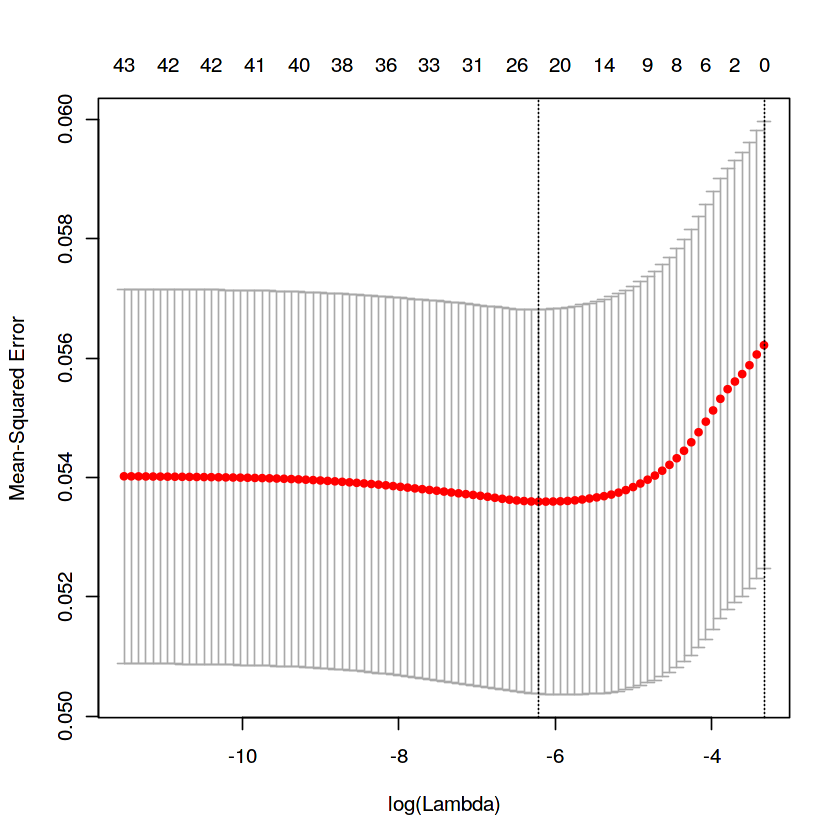

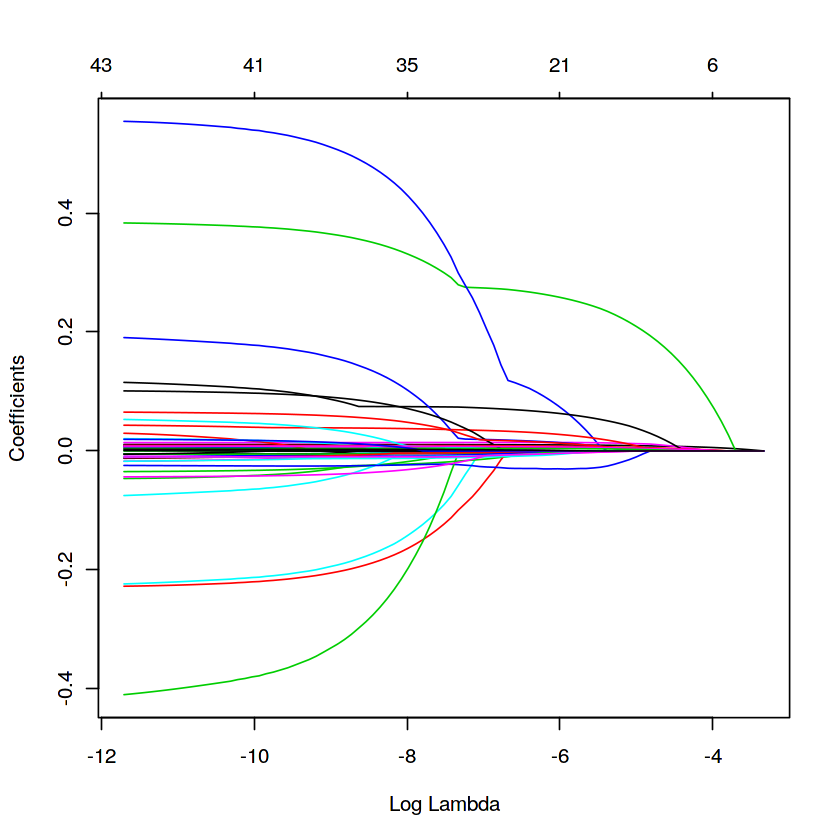

In [79]:
plot(cv.lasso, xvar="lambda")
plot(fit.lasso, xvar="lambda")

In [80]:
predict(fit.lasso, s = bestlam.lasso, type = "coefficients")

45 x 1 sparse Matrix of class "dgCMatrix"
                                                1
(Intercept)                          -0.067033792
(Intercept)                           .          
CONTRIB_CAR_POLICIES                  0.010313849
PURCHASING_POWER_CLASS                0.005293867
NUM_OF_BOAT_POLICIES                  0.263448809
NUM_OF_SURFBOARD_POLICIES             0.092186821
NUM_OF_DISABILITY_POLICIES            .          
NUM_OF_PRIVATE_3RD_PARTY_INSUR        0.014338770
NUM_OF_SOCIAL_SECURITY_POLICIES       0.065729344
NUM_OF_BICYCLE_POLICIES               0.029868114
NUM_OF_PRIVATE_ACCIDENT_POLICIES      .          
CONTRIB_FAMILY_ACCIDENT_POLICIES      0.015640017
CONTRIB_MOTOR_CYC_POLICIES            .          
CONTRIB_LORRY_POLICIES               -0.002223859
NUM_OF_PROPERTY_POLICIES              .          
CONTRIB_SURFBOARD_POLICIES            .          
CONTRIB_BOAT_POLICIES                 .          
NUM_OF_AGRICULTURE_MACHINE_POLICIES   .          
NUM_OF_T

We will identify these 21 variables and create a subset which we can use in prediction model to see how it scores on prediction.

In [81]:
insTrainData.Lasso=insTrainData[c('CONTRIB_CAR_POLICIES'
,'PURCHASING_POWER_CLASS'
,'NUM_OF_BOAT_POLICIES'
,'NUM_OF_SURFBOARD_POLICIES'
,'NUM_OF_PRIVATE_3RD_PARTY_INSUR'
,'NUM_OF_SOCIAL_SECURITY_POLICIES'
,'NUM_OF_BICYCLE_POLICIES'
,'CONTRIB_FAMILY_ACCIDENT_POLICIES'
,'CONTRIB_LORRY_POLICIES'
,'NUM_OF_LIFE_INSURANCE_POLICIES'
,'NUM_OF_3RD_PARTY_INSUR_AGRIC'
,'LIVING_TOGETHER'
,'CONTRIB_DISABILITY_POLICIES'
,'CONTRIB_AGRICULTURE_MACHINE_POLICIES'
,'AVG_INCOME'
,'CONTRIB_TRACTOR_POLICIES'
,'CONTRIB_FIRE_POLICIES'
,'CAR_1'
,'INCOME_MT_120'
,'CONTRIB_3RD_PARTY_INSUR_AGRIC'
,'SOC_CLASS_B1'  ,'CARAVAN')]

insTestData.Lasso=insTestData[c('CONTRIB_CAR_POLICIES'
,'PURCHASING_POWER_CLASS'
,'NUM_OF_BOAT_POLICIES'
,'NUM_OF_SURFBOARD_POLICIES'
,'NUM_OF_PRIVATE_3RD_PARTY_INSUR'
,'NUM_OF_SOCIAL_SECURITY_POLICIES'
,'NUM_OF_BICYCLE_POLICIES'
,'CONTRIB_FAMILY_ACCIDENT_POLICIES'
,'CONTRIB_LORRY_POLICIES'
,'NUM_OF_LIFE_INSURANCE_POLICIES'
,'NUM_OF_3RD_PARTY_INSUR_AGRIC'
,'LIVING_TOGETHER'
,'CONTRIB_DISABILITY_POLICIES'
,'CONTRIB_AGRICULTURE_MACHINE_POLICIES'
,'AVG_INCOME'
,'CONTRIB_TRACTOR_POLICIES'
,'CONTRIB_FIRE_POLICIES'
,'CAR_1'
,'INCOME_MT_120'
,'CONTRIB_3RD_PARTY_INSUR_AGRIC'
,'SOC_CLASS_B1')]

Now that we are done with feature selection, we will reformat the data to factors

In [82]:

col = c('CUST_SUBTYPE','CUST_MAIN_TYPE')
insTrainData [col]= lapply(insTrainData[col], factor)
col = c('CUST_SUBTYPE','CUST_MAIN_TYPE')
insTestData[col] = lapply(insTestData[col], factor)
col = c('CARAVAN')
insEvalData[col] = lapply(insEvalData[col], factor,levels = c("0","1"),labels = c("0", "1") )
insTrainData$CARAVAN= factor(insTrainData$CARAVAN, levels = c("0","1"),labels = c("0", "1"))

insTrainData.fit_fwd$CARAVAN= factor(insTrainData.fit_fwd$CARAVAN, levels = c("0","1"),labels = c("0", "1"))
insTrainData.fit_bwd$CARAVAN= factor(insTrainData.fit_bwd$CARAVAN, levels = c("0","1"),labels = c("0", "1"))
insTrainData.Lasso$CARAVAN= factor(insTrainData.Lasso$CARAVAN, levels = c("0","1"),labels = c("0", "1"))
insTrainData.MRMR$CARAVAN= factor(insTrainData.MRMR$CARAVAN, levels = c("0","1"),labels = c("0", "1"))

# Reference: https://stackoverflow.com/questions/33180058/coerce-multiple-columns-to-factors-at-once

### B. Prediction Model 

One of the aim of this task is to identify if a customer will buy a CARAVAN insurance or not which is a classification problem. 
Hence,  we will be using models more suitable on categorical variables ( i.e. variables wuth fixed values like 0/1 or yes/no)

#### Loggistic regression

One of the easiest and effective way to deal with classification problems is **Loggistic Regression.** We will be using logistic regression to predict the Caravan variables and then test the hit rate/score for the 800 customers who are most likely to have a caravan policy, and then compute the fraction of customers you identified that actually bought a caravan insurance policy using “TICTGTS2000.txt”.

**Reason to use:**
-  it is used for predicting outcome variable because categorical variables violate the notion of linearity in normal regression.
- As the response variable just have 2 classes, it is better to implment the loggistic regression

Now we will expplore the dataset generated by different feature selection methods and will observe the variables in EDA by applying it to loggistic regression model and predict the targert variables and store them in the different dataset (to compare them later)

##### Logistic Regression  with MRMR 

In [83]:
glm.MRMR =glm(CARAVAN ~. , data= insTrainData.MRMR, family= 'binomial')
prob = predict(glm.MRMR, new= insTestData.MRMR, type= "response")
insTestData.MRMR.glm <- cbind(insTestData.MRMR,prob, insEvalData)
sort <- insTestData.MRMR.glm[ order(-prob),]
score= sum(sort[1:800,]$CARAVAN==1)/800
score
#Reference: https://www.statmethods.net/management/sorting.html

[1] 0.14125

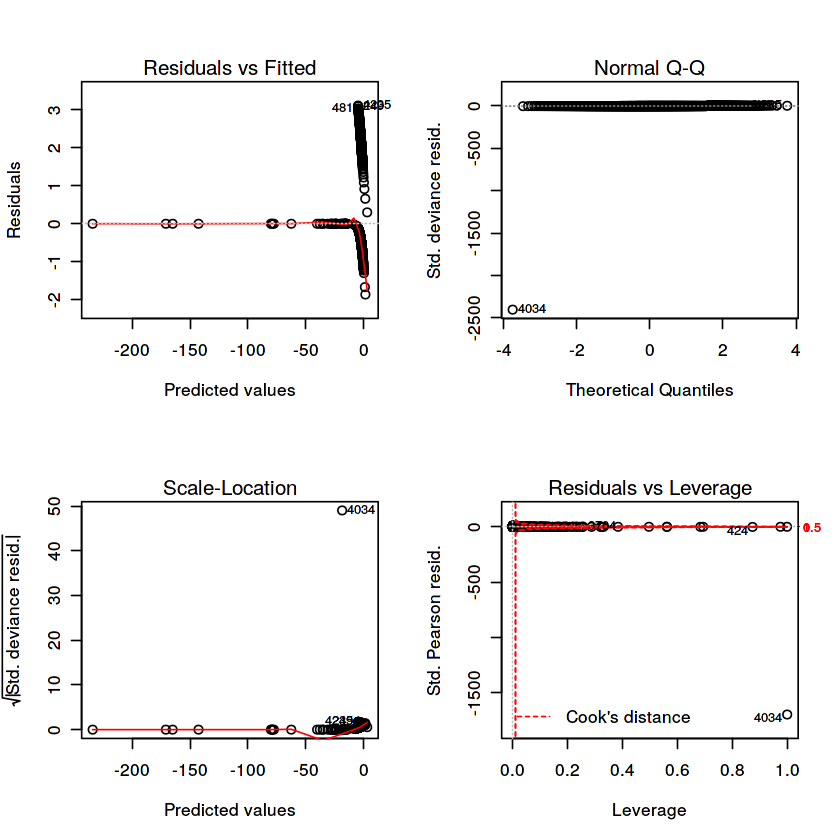

In [84]:
par(mfrow = c(2,2))
plot(glm.MRMR)

##### Logistic Regression with Forward selection

In [85]:
glm.fwd =glm(CARAVAN ~. , data= insTrainData.fit_fwd, family= 'binomial')
prob = predict(glm.fwd, new= insTestData.fit_fwd, type= "response")
insTestData.fit_fwd.glm <- cbind(insTestData.fit_fwd,prob, insEvalData)
sort <- insTestData.fit_fwd.glm[ order(-prob),]
score= sum(sort[1:800,]$CARAVAN==1)/800
score
#Reference: https://www.statmethods.net/management/sorting.html



[1] 0.1425

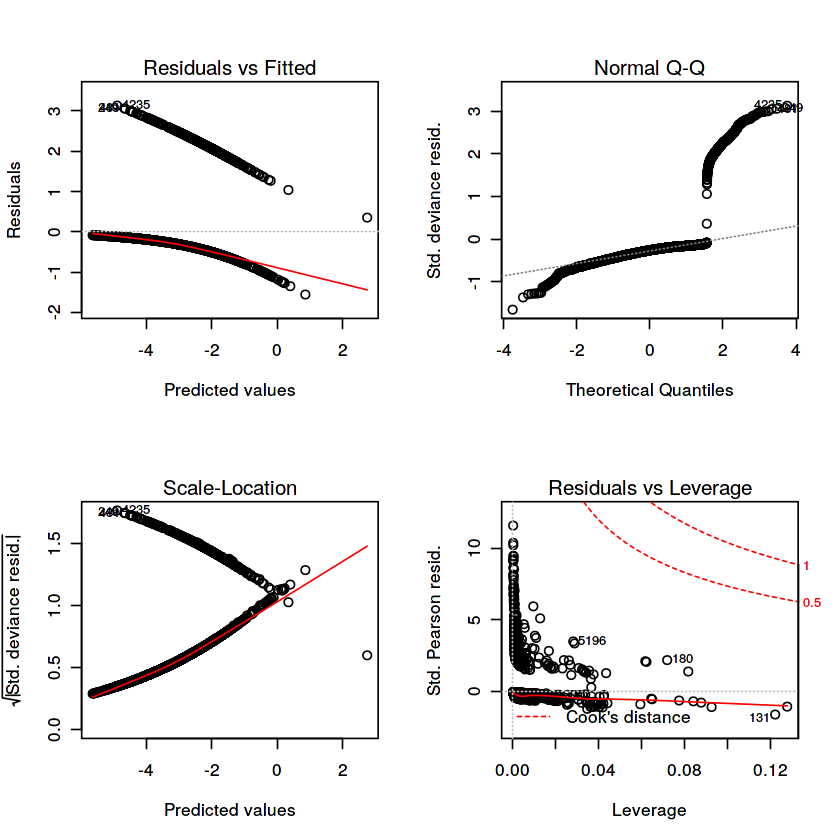

In [86]:
par(mfrow = c(2,2))
plot(glm.fwd)

##### Loggistic Regression with Backward selection

In [87]:
glm.bwd =glm(CARAVAN ~. , data= insTrainData.fit_bwd, family= 'binomial')
prob = predict(glm.bwd, new= insTestData.fit_bwd, type= "response")
insTestData.fit_bwd.glm <- cbind(insTestData.fit_bwd,prob, insEvalData)
sort <- insTestData.fit_bwd.glm[ order(-prob),]
score= sum(sort[1:800,]$CARAVAN==1)/800
score
#Reference: https://www.statmethods.net/management/sorting.html

[1] 0.1425

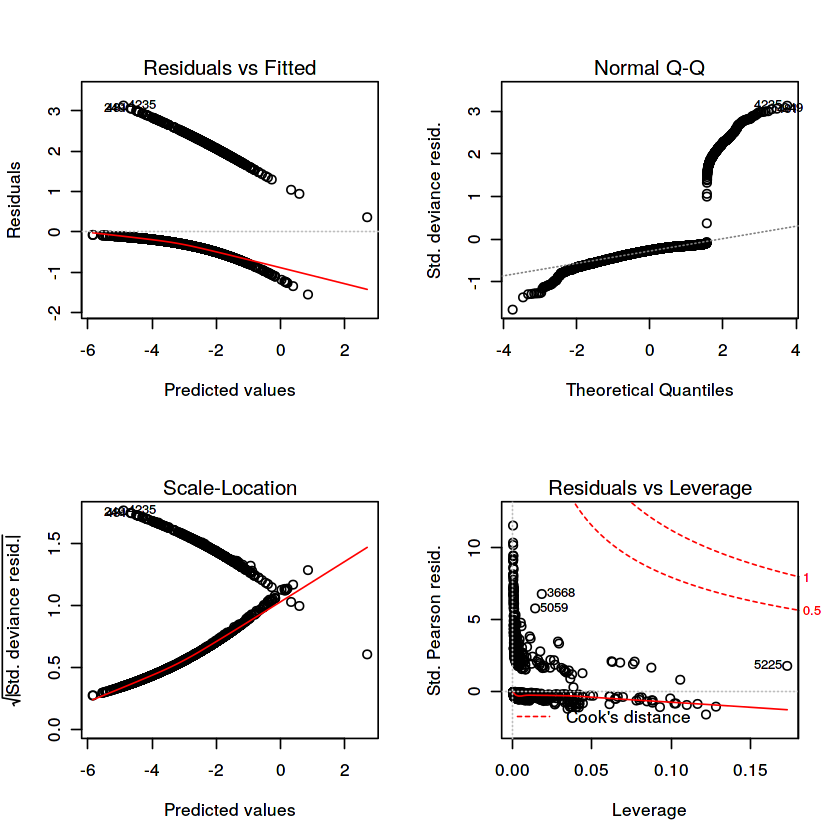

In [88]:
par(mfrow = c(2,2))
plot(glm.bwd)

##### Loggistic Regression with Lasso

In [89]:
glm.lasso =glm(CARAVAN ~. , data= insTrainData.Lasso, family= 'binomial')
prob = predict(glm.lasso, new= insTestData.Lasso, type= "response")
insTestData.lasso.glm <- cbind(insTestData.Lasso,prob, insEvalData)
sort <- insTestData.lasso.glm[ order(-prob),]
score= sum(sort[1:800,]$CARAVAN==1)/800
score
#Reference: https://www.statmethods.net/management/sorting.html


[1] 0.1425

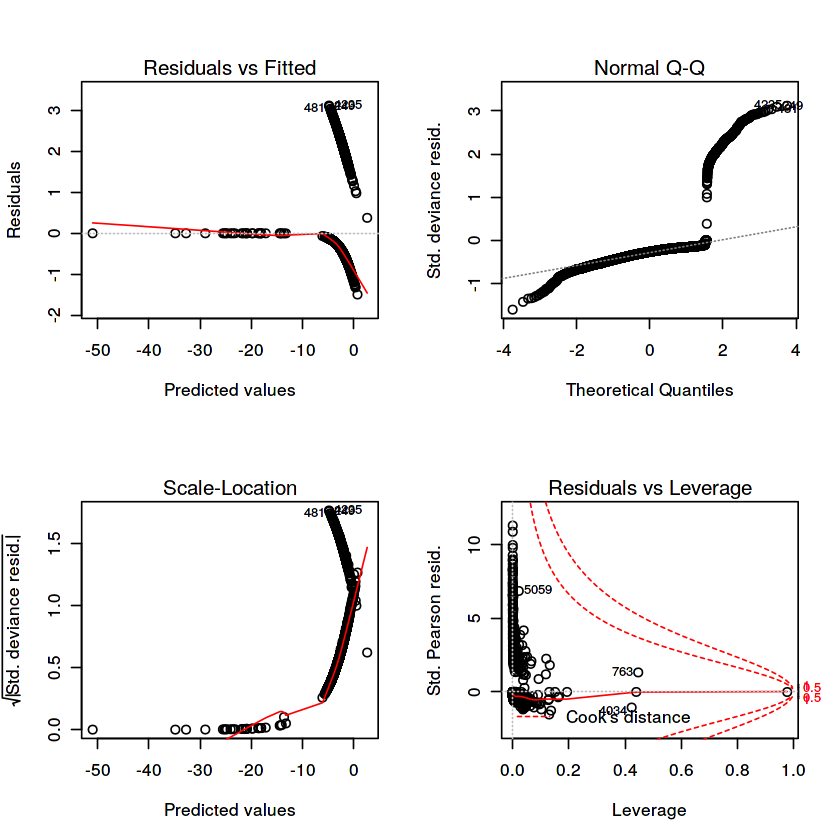

In [90]:
par(mfrow = c(2,2))
plot(glm.lasso)

#### LDA

Next model to predict the target "CARAVAN" is LDA or Linear Discriminant Analysis. It (and QDA) is often preferred over logistic regression in the cases where we have more than two categorical response classes.

"Discriminant analysis belongs to the branch of classiﬁcation methods called generative modelling, where we try to estimate the within class density of X given the class label. Combined with the prior probability (unconditioned probability) of classes, the posterior probability of Y can be obtained by the Bayes formula."

**Reason to use:**
- As we have seen in EDA, most of the predictors of this model are drawn from Gaussian/Multiverse distribution, it is safe to use LDA here.
- LDA model is surprisingly more stable (than loggistic regresion) when classes of the target variable are well separated (i.e. CARAVAN = 0, CARAVAN = 1).


Now we will expplore the dataset generated by different feature selection methods and will observe the variables in EDA by applying it to LDA or Linear Discriminant Analysis model and predict the targert variables and store them in the different dataset (to compare them later)

##### LDA with MRMR data

In [91]:
lda.MRMR = lda(CARAVAN~., data = insTrainData.MRMR)
prob = predict(lda.MRMR, new= insTestData.MRMR, type= "response")
insTestData.MRMR.LDA <- cbind(insTestData.MRMR,prob$posterior[,2], insEvalData)
sort <- insTestData.MRMR.LDA[ order(-prob$posterior[,2]),]
score= sum(sort[1:800,]$CARAVAN==1)/800
score
#Reference: https://www.statmethods.net/management/sorting.html

[1] 0.14375

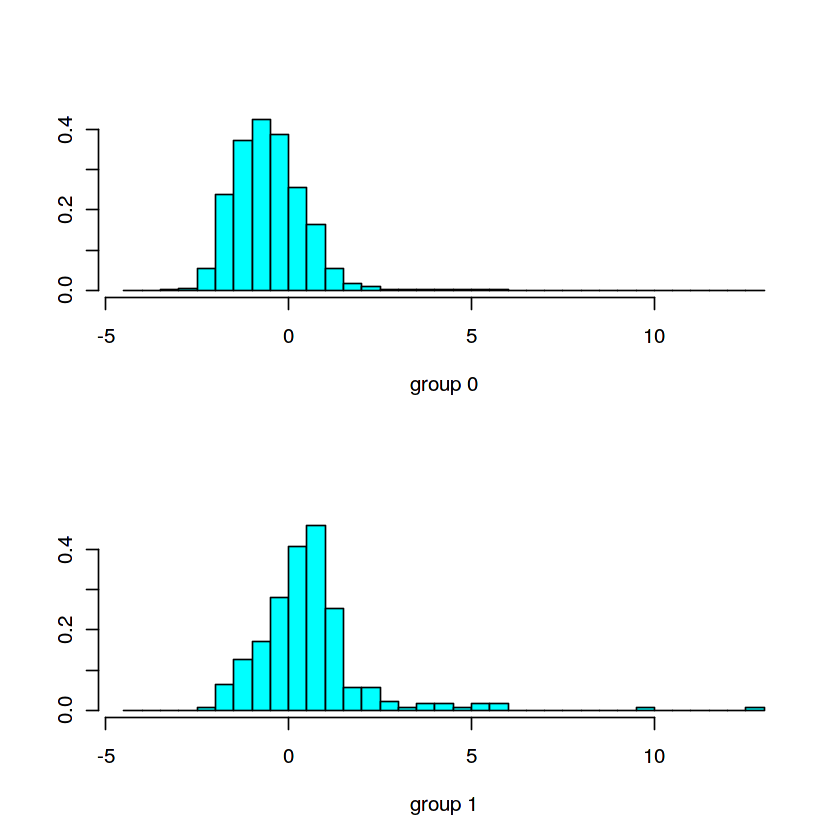

In [92]:
par(mfrow = c(1,2))
plot (lda.MRMR)

##### LDA with forward selection 

In [93]:
lda.fwd = lda(CARAVAN~., data = insTrainData.fit_fwd)
prob = predict(lda.fwd, new= insTestData.fit_fwd, type= "response")
insTestData.fwd.LDA <- cbind(insTestData.fit_fwd,prob$posterior[,2], insEvalData)
sort <- insTestData.fwd.LDA[ order(-prob$posterior[,2]),]
score= sum(sort[1:800,]$CARAVAN==1)/800
score
#Reference: https://www.statmethods.net/management/sorting.html

[1] 0.1425

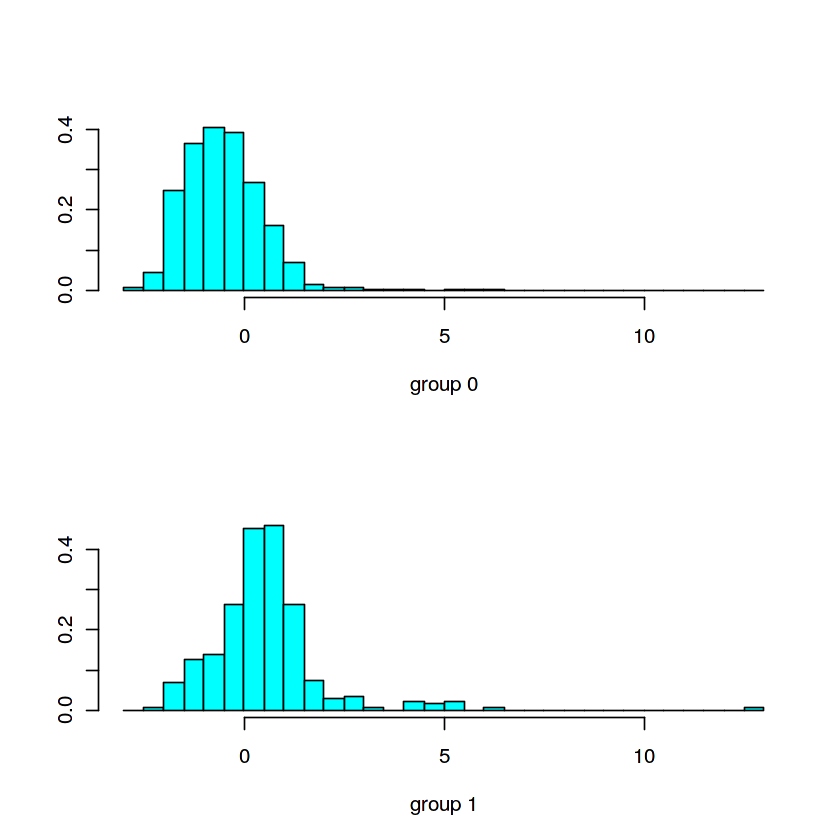

In [94]:
par(mfrow = c(1,2))
plot (lda.fwd)

##### LDA with Backward selection 

In [95]:
lda.bwd = lda(CARAVAN~., data = insTrainData.fit_bwd)
prob = predict(lda.bwd, new= insTestData.fit_bwd, type= "response")
insTestData.bwd.LDA <- cbind(insTestData.fit_bwd,prob$posterior[,2], insEvalData)
sort <- insTestData.bwd.LDA[ order(-prob$posterior[,2]),]
score= sum(sort[1:800,]$CARAVAN==1)/800
score
#Reference: https://www.statmethods.net/management/sorting.html

[1] 0.14375

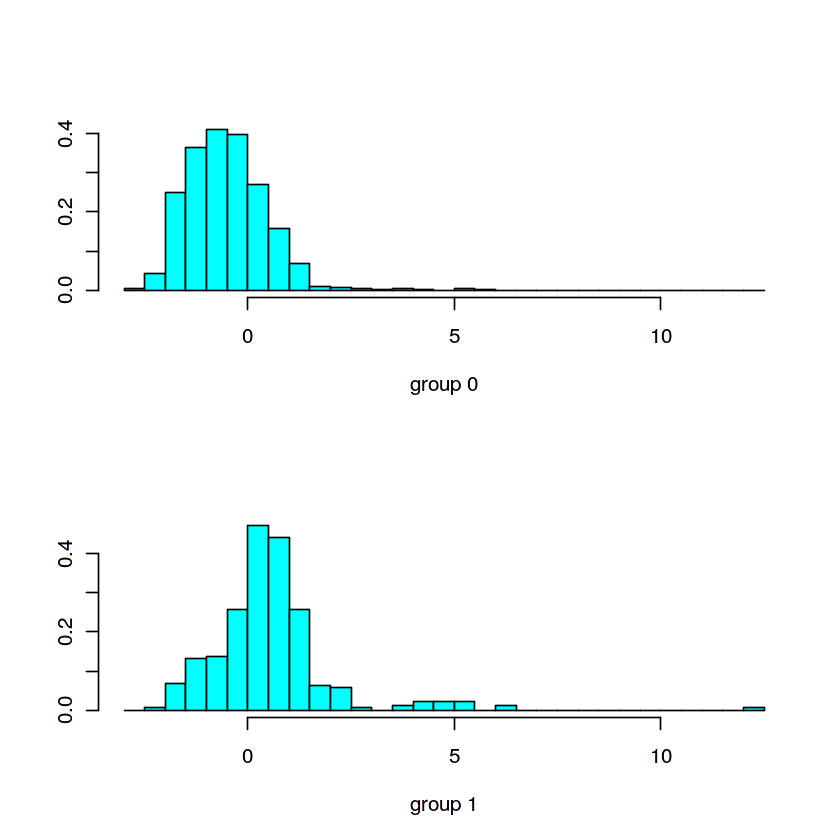

In [96]:
par(mfrow = c(1,2))
plot (lda.bwd)

##### LDA with Lasso 

In [97]:
lda.lasso = lda(CARAVAN~., data = insTrainData.Lasso)
prob = predict(lda.lasso, new= insTestData.Lasso, type= "response")
insTestData.lasso.LDA <- cbind(insTestData.Lasso,prob$posterior[,2], insEvalData)
sort <- insTestData.lasso.LDA[ order(-prob$posterior[,2]),]
score= sum(sort[1:800,]$CARAVAN==1)/800
score
#Reference: https://www.statmethods.net/management/sorting.html

[1] 0.145

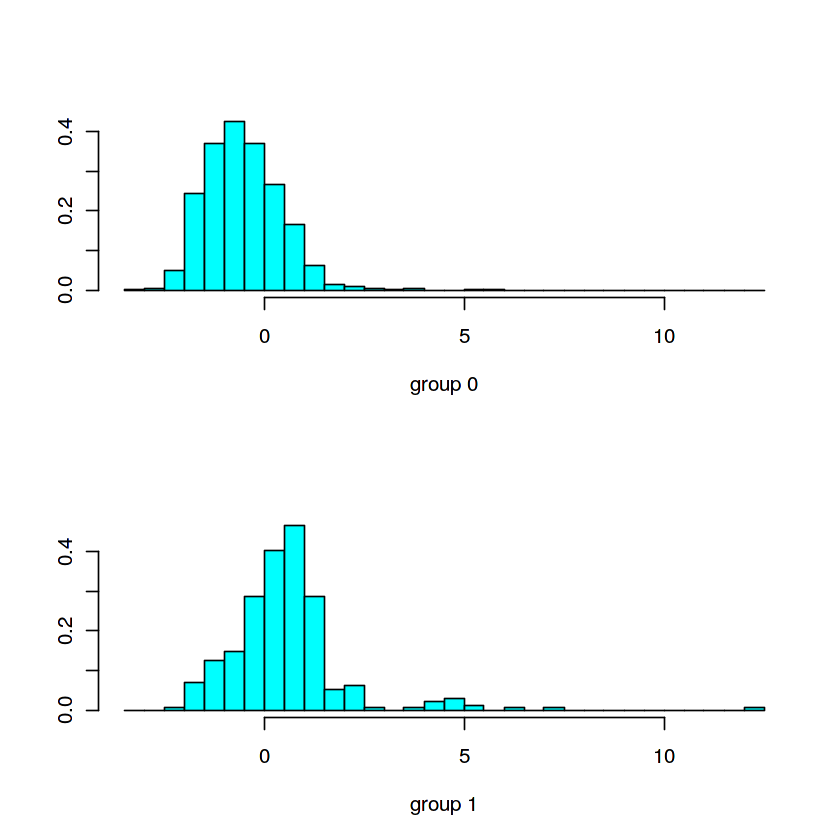

In [98]:
par(mfrow = c(1,2))
plot (lda.lasso)

## 4. Model Comparsion<a class="anchor" id="sec_4"></a>

Now that we have created our models, one thing is quiet clear, which is LDA with Lasso has much better scoring rate than other models.
Now we will compare their accuracy and their features.

#### Comparison of loggistic regression models with different type of step selection method

In [99]:
logit.MRMR <- train(CARAVAN~., data=insTrainData.MRMR, method='glm', family=binomial(link='logit'), preProcess=c('scale', 'center'))
cbind(coef= coef(logit.MRMR$finalModel), confint(logit.MRMR$finalModel))
logit.fwd <- train(CARAVAN~., data=insTrainData.fit_fwd, method='glm', family=binomial(link='logit'), preProcess=c('scale', 'center'))
cbind(coef= coef(logit.fwd$finalModel), confint(logit.fwd$finalModel))
logit.bwd <- train(CARAVAN~., data=insTrainData.fit_bwd, method='glm', family=binomial(link='logit'), preProcess=c('scale', 'center'))
cbind(coef= coef(logit.bwd$finalModel), confint(logit.bwd$finalModel))
logit.lasso <- train(CARAVAN~., data=insTrainData.Lasso, method='glm', family=binomial(link='logit'), preProcess=c('scale', 'center'))
cbind(coef= coef(logit.lasso$finalModel), confint(logit.lasso$finalModel))

Waiting for profiling to be done...


,coef,2.5 %,97.5 %
(Intercept),-3.485354209,-3.52416315,-3.457505320
CONTRIB_CAR_POLICIES,0.677401737,0.53992372,0.821154786
PURCHASING_POWER_CLASS,0.206089765,0.07486971,0.337990456
NUM_OF_BOAT_POLICIES,0.226255512,0.07180348,0.383186144
NUM_OF_SURFBOARD_POLICIES,0.264961118,-4.29025626,NA
NUM_OF_DISABILITY_POLICIES,-0.271393655,-1.12898384,0.043575502
NUM_OF_PRIVATE_3RD_PARTY_INSUR,0.086160246,-0.05420710,0.227880314
NUM_OF_SOCIAL_SECURITY_POLICIES,0.105360602,-0.17405004,0.346152258
NUM_OF_BICYCLE_POLICIES,0.043087219,-0.20298762,0.268135816
NUM_OF_PRIVATE_ACCIDENT_POLICIES,0.002257715,-0.43100249,0.521087918


Waiting for profiling to be done...


,coef,2.5 %,97.5 %
(Intercept),-3.15295076,-3.304506048,-3.0095601
CONTRIB_CAR_POLICIES,0.66915106,0.535156687,0.8091810
PURCHASING_POWER_CLASS,0.20909064,0.080724318,0.3379966
NUM_OF_BOAT_POLICIES,0.17160311,0.111009664,0.2314870
NUM_OF_PRIVATE_3RD_PARTY_INSUR,0.10978678,-0.026882699,0.2480068
NUM_OF_SOCIAL_SECURITY_POLICIES,0.07100058,-0.003521038,0.1383413
NUM_OF_BICYCLE_POLICIES,0.10542630,0.017828711,0.1836200
NUM_OF_3RD_PARTY_INSUR_AGRIC,-0.20619394,-0.411229592,-0.0565107
CONTRIB_DISABILITY_POLICIES,0.08230672,-0.000918218,0.1517452
AVG_INCOME,0.18232470,0.063396758,0.2998826


Waiting for profiling to be done...


,coef,2.5 %,97.5 %
(Intercept),-3.15334652,-3.3049376091,-3.00993160
CONTRIB_CAR_POLICIES,0.66734257,0.5332398787,0.80746444
PURCHASING_POWER_CLASS,0.20962041,0.0812316648,0.33854820
NUM_OF_BOAT_POLICIES,0.17148316,0.1110015852,0.23126305
NUM_OF_PRIVATE_3RD_PARTY_INSUR,0.11018535,-0.0265693148,0.24846552
NUM_OF_SOCIAL_SECURITY_POLICIES,0.06604240,-0.0101199614,0.13475866
NUM_OF_BICYCLE_POLICIES,0.10857208,0.0205613023,0.18706799
CONTRIB_FAMILY_ACCIDENT_POLICIES,0.24529224,-0.1180649019,0.66337211
CONTRIB_DISABILITY_POLICIES,0.08313647,-0.0001621597,0.15271453
NUM_OF_FAMILY_ACCIDENT_POLICIES,-0.23982244,-0.7243166063,0.14153428


Waiting for profiling to be done...


,coef,2.5 %,97.5 %
(Intercept),-3.25618488,-6.042408836,-5.808526087
CONTRIB_CAR_POLICIES,0.67348508,0.538361282,0.814654776
PURCHASING_POWER_CLASS,0.20446959,0.074410170,0.335251179
NUM_OF_BOAT_POLICIES,0.16987969,0.109135950,0.229981112
NUM_OF_SURFBOARD_POLICIES,0.03232914,-0.039933579,0.090901853
NUM_OF_PRIVATE_3RD_PARTY_INSUR,0.09340954,-0.044613207,0.232884151
NUM_OF_SOCIAL_SECURITY_POLICIES,0.06733771,-0.008518488,0.135894818
NUM_OF_BICYCLE_POLICIES,0.10214933,0.014380963,0.180848292
CONTRIB_FAMILY_ACCIDENT_POLICIES,0.02480081,-0.053766387,0.092480484
CONTRIB_LORRY_POLICIES,-0.71485016,NA,2.111458611


In [100]:
summary (logit.MRMR)
summary (logit.fwd)
summary (logit.bwd)
summary (logit.lasso)


Call:
NULL

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-1.8597  -0.3795  -0.2612  -0.1738   3.1068  

Coefficients:
                                       Estimate Std. Error z value Pr(>|z|)    
(Intercept)                           -3.485354   9.363898  -0.372 0.709735    
CONTRIB_CAR_POLICIES                   0.677402   0.071646   9.455  < 2e-16 ***
PURCHASING_POWER_CLASS                 0.206090   0.067095   3.072 0.002129 ** 
NUM_OF_BOAT_POLICIES                   0.226256   0.078685   2.875 0.004035 ** 
NUM_OF_SURFBOARD_POLICIES              0.264961  74.019031   0.004 0.997144    
NUM_OF_DISABILITY_POLICIES            -0.271394   0.247820  -1.095 0.273462    
NUM_OF_PRIVATE_3RD_PARTY_INSUR         0.086160   0.071927   1.198 0.230963    
NUM_OF_SOCIAL_SECURITY_POLICIES        0.105361   0.128063   0.823 0.410666    
NUM_OF_BICYCLE_POLICIES                0.043087   0.118390   0.364 0.715902    
NUM_OF_PRIVATE_ACCIDENT_POLICIES       0.002258   0.262642 


Call:
NULL

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-1.5545  -0.3790  -0.2655  -0.1823   3.1322  

Coefficients:
                                Estimate Std. Error z value Pr(>|z|)    
(Intercept)                     -3.15295    0.07518 -41.941  < 2e-16 ***
CONTRIB_CAR_POLICIES             0.66915    0.06981   9.586  < 2e-16 ***
PURCHASING_POWER_CLASS           0.20909    0.06561   3.187 0.001437 ** 
NUM_OF_BOAT_POLICIES             0.17160    0.03054   5.619 1.92e-08 ***
NUM_OF_PRIVATE_3RD_PARTY_INSUR   0.10979    0.07009   1.566 0.117275    
NUM_OF_SOCIAL_SECURITY_POLICIES  0.07100    0.03594   1.975 0.048224 *  
NUM_OF_BICYCLE_POLICIES          0.10543    0.04189   2.517 0.011846 *  
NUM_OF_3RD_PARTY_INSUR_AGRIC    -0.20619    0.08747  -2.357 0.018405 *  
CONTRIB_DISABILITY_POLICIES      0.08231    0.03813   2.159 0.030873 *  
AVG_INCOME                       0.18232    0.06031   3.023 0.002504 ** 
CONTRIB_FIRE_POLICIES            0.25353    0.07136   3.


Call:
NULL

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-1.5533  -0.3787  -0.2652  -0.1827   3.1299  

Coefficients:
                                 Estimate Std. Error z value Pr(>|z|)    
(Intercept)                      -3.15335    0.07519 -41.938  < 2e-16 ***
CONTRIB_CAR_POLICIES              0.66734    0.06986   9.553  < 2e-16 ***
PURCHASING_POWER_CLASS            0.20962    0.06562   3.195 0.001400 ** 
NUM_OF_BOAT_POLICIES              0.17148    0.03049   5.625 1.86e-08 ***
NUM_OF_PRIVATE_3RD_PARTY_INSUR    0.11019    0.07013   1.571 0.116141    
NUM_OF_SOCIAL_SECURITY_POLICIES   0.06604    0.03671   1.799 0.072036 .  
NUM_OF_BICYCLE_POLICIES           0.10857    0.04209   2.579 0.009901 ** 
CONTRIB_FAMILY_ACCIDENT_POLICIES  0.24529    0.19161   1.280 0.200497    
CONTRIB_DISABILITY_POLICIES       0.08314    0.03818   2.177 0.029445 *  
NUM_OF_FAMILY_ACCIDENT_POLICIES  -0.23982    0.21116  -1.136 0.256065    
AVG_INCOME                        0.17905    


Call:
NULL

Deviance Residuals: 
    Min       1Q   Median       3Q      Max  
-1.4933  -0.3808  -0.2626  -0.1801   3.1164  

Coefficients:
                                     Estimate Std. Error z value Pr(>|z|)    
(Intercept)                          -3.25618    2.38485  -1.365 0.172139    
CONTRIB_CAR_POLICIES                  0.67349    0.07039   9.568  < 2e-16 ***
PURCHASING_POWER_CLASS                0.20447    0.06651   3.074 0.002111 ** 
NUM_OF_BOAT_POLICIES                  0.16988    0.03062   5.549 2.88e-08 ***
NUM_OF_SURFBOARD_POLICIES             0.03233    0.03021   1.070 0.284579    
NUM_OF_PRIVATE_3RD_PARTY_INSUR        0.09341    0.07076   1.320 0.186793    
NUM_OF_SOCIAL_SECURITY_POLICIES       0.06734    0.03660   1.840 0.065781 .  
NUM_OF_BICYCLE_POLICIES               0.10215    0.04209   2.427 0.015216 *  
CONTRIB_FAMILY_ACCIDENT_POLICIES      0.02480    0.03675   0.675 0.499728    
CONTRIB_LORRY_POLICIES               -0.71485   33.43086  -0.021 0.982940    
N

Now we will compare different properties of each model.

**Test Statistic/Difference in Residuals**

In [101]:
with(logit.MRMR$finalModel, null.deviance - deviance)
with(logit.fwd$finalModel, null.deviance - deviance)
with(logit.bwd$finalModel, null.deviance - deviance)
with(logit.lasso$finalModel, null.deviance - deviance)

[1] 323.9826

[1] 294.2659

[1] 296.329

[1] 307.9243

**Number of predictor variables**

In [102]:
with(logit.MRMR$finalModel, df.null - df.residual)
with(logit.fwd$finalModel, df.null - df.residual)
with(logit.bwd$finalModel, df.null - df.residual)
with(logit.lasso$finalModel, df.null - df.residual)

[1] 43

[1] 11

[1] 13

[1] 21

**P value**

In [103]:
with(logit.MRMR$finalModel, pchisq(null.deviance - deviance, df.null - df.residual, lower.tail = FALSE))
with(logit.fwd$finalModel, pchisq(null.deviance - deviance, df.null - df.residual, lower.tail = FALSE))
with(logit.bwd$finalModel, pchisq(null.deviance - deviance, df.null - df.residual, lower.tail = FALSE))
with(logit.lasso$finalModel, pchisq(null.deviance - deviance, df.null - df.residual, lower.tail = FALSE))

[1] 9.043441e-45

[1] 1.413186e-56

[1] 1.409789e-55

[1] 7.738355e-53

Now we will check the **chi square statistic** of each of our loggistic regression model

In [104]:
anova(logit.MRMR$finalModel,logit.bwd$finalModel,logit.lasso$finalModel,logit.fwd$finalModel,test = "Chisq")

Resid. Df,Resid. Dev,Df,Deviance,Pr(>Chi)
5778,2311.558,NA,NA,NA
5808,2339.211,-30,-27.65353,0.5887911
5800,2327.616,8,11.59527,0.1701960
5810,2341.275,-10,-13.65837,0.1891521


As we are aware that p-value shows how the models are statistically different.
In this case as the *p-value is little low*. 
It means that adding the interaction term would hardly make a difference.

Below is the **accuracy** of logistic regression model with MRMR selection.

In [105]:
confusionMatrix(predict(logit.MRMR, insTestData.MRMR), insEvalData$CARAVAN)

Confusion Matrix and Statistics

          Reference
Prediction    0    1
         0 3758  236
         1    4    2
                                          
               Accuracy : 0.94            
                 95% CI : (0.9322, 0.9472)
    No Information Rate : 0.9405          
    P-Value [Acc > NIR] : 0.5701          
                                          
                  Kappa : 0.0135          
 Mcnemar's Test P-Value : <2e-16          
                                          
            Sensitivity : 0.998937        
            Specificity : 0.008403        
         Pos Pred Value : 0.940911        
         Neg Pred Value : 0.333333        
             Prevalence : 0.940500        
         Detection Rate : 0.939500        
   Detection Prevalence : 0.998500        
      Balanced Accuracy : 0.503670        
                                          
       'Positive' Class : 0               
                                          

Below is the **accuracy** of logistic regression model with Fit Forward selection.

In [106]:
confusionMatrix(predict(logit.fwd, insTestData.fit_fwd), insEvalData$CARAVAN)

Confusion Matrix and Statistics

          Reference
Prediction    0    1
         0 3758  236
         1    4    2
                                          
               Accuracy : 0.94            
                 95% CI : (0.9322, 0.9472)
    No Information Rate : 0.9405          
    P-Value [Acc > NIR] : 0.5701          
                                          
                  Kappa : 0.0135          
 Mcnemar's Test P-Value : <2e-16          
                                          
            Sensitivity : 0.998937        
            Specificity : 0.008403        
         Pos Pred Value : 0.940911        
         Neg Pred Value : 0.333333        
             Prevalence : 0.940500        
         Detection Rate : 0.939500        
   Detection Prevalence : 0.998500        
      Balanced Accuracy : 0.503670        
                                          
       'Positive' Class : 0               
                                          

Below is the **accuracy** of logistic regression model with Fit Backward selection.

In [107]:
confusionMatrix(predict(logit.bwd, insTestData.fit_bwd), insEvalData$CARAVAN)

Confusion Matrix and Statistics

          Reference
Prediction    0    1
         0 3758  236
         1    4    2
                                          
               Accuracy : 0.94            
                 95% CI : (0.9322, 0.9472)
    No Information Rate : 0.9405          
    P-Value [Acc > NIR] : 0.5701          
                                          
                  Kappa : 0.0135          
 Mcnemar's Test P-Value : <2e-16          
                                          
            Sensitivity : 0.998937        
            Specificity : 0.008403        
         Pos Pred Value : 0.940911        
         Neg Pred Value : 0.333333        
             Prevalence : 0.940500        
         Detection Rate : 0.939500        
   Detection Prevalence : 0.998500        
      Balanced Accuracy : 0.503670        
                                          
       'Positive' Class : 0               
                                          

Below is the **accuracy** of logistic regression model with Lasso selection.

In [108]:
confusionMatrix(predict(logit.lasso, insTestData.Lasso), insEvalData$CARAVAN)

Confusion Matrix and Statistics

          Reference
Prediction    0    1
         0 3757  236
         1    5    2
                                          
               Accuracy : 0.9398          
                 95% CI : (0.9319, 0.9469)
    No Information Rate : 0.9405          
    P-Value [Acc > NIR] : 0.5961          
                                          
                  Kappa : 0.013           
 Mcnemar's Test P-Value : <2e-16          
                                          
            Sensitivity : 0.998671        
            Specificity : 0.008403        
         Pos Pred Value : 0.940897        
         Neg Pred Value : 0.285714        
             Prevalence : 0.940500        
         Detection Rate : 0.939250        
   Detection Prevalence : 0.998250        
      Balanced Accuracy : 0.503537        
                                          
       'Positive' Class : 0               
                                          

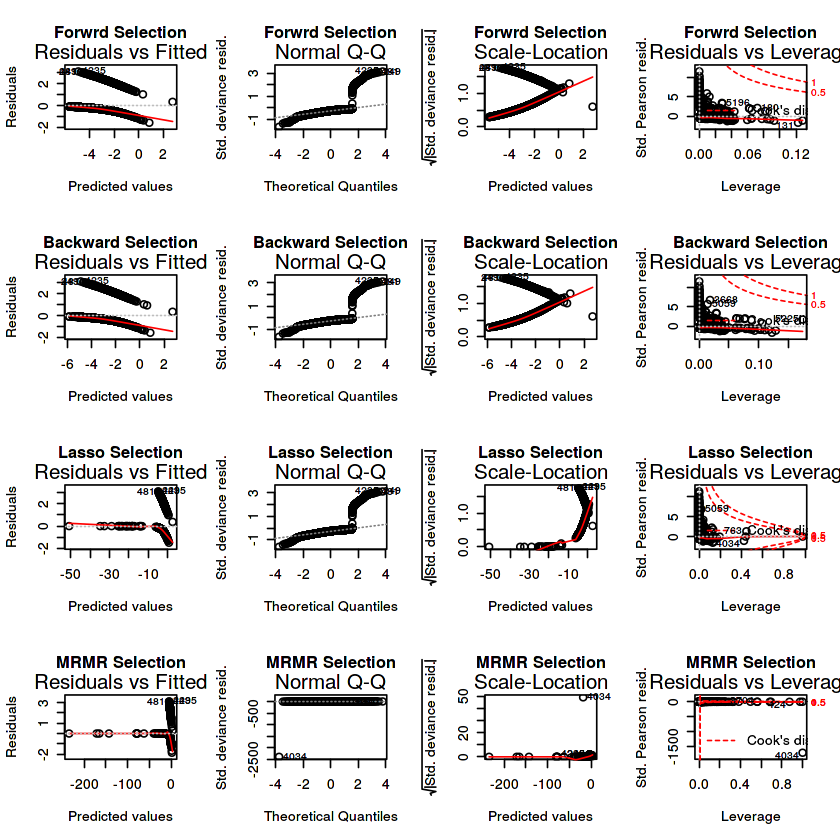

In [109]:
par(mfrow = c(4,4))
plot(glm.fwd, main="Forwrd Selection")
plot(glm.bwd, main="Backward Selection")
plot (glm.lasso, main="Lasso Selection")
plot (glm.MRMR,  main="MRMR Selection")

#### Comparison of LDA model with different type of step selection method

In [110]:
lda.MRMR
lda.fwd
lda.bwd
lda.lasso

Call:
lda(CARAVAN ~ ., data = insTrainData.MRMR)

Prior probabilities of groups:
         0          1 
0.94022673 0.05977327 

Group means:
  CONTRIB_CAR_POLICIES PURCHASING_POWER_CLASS NUM_OF_BOAT_POLICIES
0             2.859335               4.187797          0.003836317
1             4.718391               5.000000          0.040229885
  NUM_OF_SURFBOARD_POLICIES NUM_OF_DISABILITY_POLICIES
0              0.0003653635                0.004201681
1              0.0028735632                0.011494253
  NUM_OF_PRIVATE_3RD_PARTY_INSUR NUM_OF_SOCIAL_SECURITY_POLICIES
0                      0.3918524                      0.01223968
1                      0.5775862                      0.04597701
  NUM_OF_BICYCLE_POLICIES NUM_OF_PRIVATE_ACCIDENT_POLICIES
0              0.02995981                      0.005480453
1              0.06034483                      0.002873563
  CONTRIB_FAMILY_ACCIDENT_POLICIES CONTRIB_MOTOR_CYC_POLICIES
0                       0.01333577                  0.17409

Call:
lda(CARAVAN ~ ., data = insTrainData.fit_fwd)

Prior probabilities of groups:
         0          1 
0.94022673 0.05977327 

Group means:
  CONTRIB_CAR_POLICIES PURCHASING_POWER_CLASS NUM_OF_BOAT_POLICIES
0             2.859335               4.187797          0.003836317
1             4.718391               5.000000          0.040229885
  NUM_OF_PRIVATE_3RD_PARTY_INSUR NUM_OF_SOCIAL_SECURITY_POLICIES
0                      0.3918524                      0.01223968
1                      0.5775862                      0.04597701
  NUM_OF_BICYCLE_POLICIES NUM_OF_3RD_PARTY_INSUR_AGRIC
0              0.02995981                   0.02137377
1              0.06034483                   0.00862069
  CONTRIB_DISABILITY_POLICIES AVG_INCOME CONTRIB_FIRE_POLICIES    CAR_1
0                  0.02064304   3.754476              1.782974 6.012970
1                  0.06896552   4.255747              2.531609 6.471264

Coefficients of linear discriminants:
                                       L

Call:
lda(CARAVAN ~ ., data = insTrainData.fit_bwd)

Prior probabilities of groups:
         0          1 
0.94022673 0.05977327 

Group means:
  CONTRIB_CAR_POLICIES PURCHASING_POWER_CLASS NUM_OF_BOAT_POLICIES
0             2.859335               4.187797          0.003836317
1             4.718391               5.000000          0.040229885
  NUM_OF_PRIVATE_3RD_PARTY_INSUR NUM_OF_SOCIAL_SECURITY_POLICIES
0                      0.3918524                      0.01223968
1                      0.5775862                      0.04597701
  NUM_OF_BICYCLE_POLICIES CONTRIB_FAMILY_ACCIDENT_POLICIES
0              0.02995981                       0.01333577
1              0.06034483                       0.04597701
  CONTRIB_DISABILITY_POLICIES NUM_OF_FAMILY_ACCIDENT_POLICIES AVG_INCOME
0                  0.02064304                     0.005845817   3.754476
1                  0.06896552                     0.017241379   4.255747
  CONTRIB_FIRE_POLICIES    CAR_1 CONTRIB_3RD_PARTY_INSUR_AGRIC
0

Call:
lda(CARAVAN ~ ., data = insTrainData.Lasso)

Prior probabilities of groups:
         0          1 
0.94022673 0.05977327 

Group means:
  CONTRIB_CAR_POLICIES PURCHASING_POWER_CLASS NUM_OF_BOAT_POLICIES
0             2.859335               4.187797          0.003836317
1             4.718391               5.000000          0.040229885
  NUM_OF_SURFBOARD_POLICIES NUM_OF_PRIVATE_3RD_PARTY_INSUR
0              0.0003653635                      0.3918524
1              0.0028735632                      0.5775862
  NUM_OF_SOCIAL_SECURITY_POLICIES NUM_OF_BICYCLE_POLICIES
0                      0.01223968              0.02995981
1                      0.04597701              0.06034483
  CONTRIB_FAMILY_ACCIDENT_POLICIES CONTRIB_LORRY_POLICIES
0                       0.01333577              0.0100475
1                       0.04597701              0.0000000
  NUM_OF_LIFE_INSURANCE_POLICIES NUM_OF_3RD_PARTY_INSUR_AGRIC LIVING_TOGETHER
0                     0.07307271                   0.0

Now we will identify the models in terms of accuracy with different selection methods

In [111]:
lda.fwd.new <- train(CARAVAN~., data = insTrainData.fit_fwd, method = 'lda', preProcess=c('scale', 'center'))
lda.bwd.new <- train(CARAVAN~., data = insTrainData.fit_bwd, method = 'lda', preProcess=c('scale', 'center'))
lda.MRMR.new <- train(CARAVAN~., data = insTrainData.MRMR, method = 'lda', preProcess=c('scale', 'center'))
lda.lasso.new <- train(CARAVAN~., data = insTrainData.Lasso, method = 'lda', preProcess=c('scale', 'center'))


Below is the **accuracy** of LDA model with Forward selection.

In [112]:
confusionMatrix(predict(lda.fwd.new, insTestData.fit_fwd), insEvalData$CARAVAN)

Confusion Matrix and Statistics

          Reference
Prediction    0    1
         0 3746  234
         1   16    4
                                          
               Accuracy : 0.9375          
                 95% CI : (0.9295, 0.9448)
    No Information Rate : 0.9405          
    P-Value [Acc > NIR] : 0.7991          
                                          
                  Kappa : 0.022           
 Mcnemar's Test P-Value : <2e-16          
                                          
            Sensitivity : 0.99575         
            Specificity : 0.01681         
         Pos Pred Value : 0.94121         
         Neg Pred Value : 0.20000         
             Prevalence : 0.94050         
         Detection Rate : 0.93650         
   Detection Prevalence : 0.99500         
      Balanced Accuracy : 0.50628         
                                          
       'Positive' Class : 0               
                                          

Below is the **accuracy** of LDA model with Backward selection.

In [113]:
confusionMatrix(predict(lda.bwd.new, insTestData.fit_bwd), insEvalData$CARAVAN)

Confusion Matrix and Statistics

          Reference
Prediction    0    1
         0 3740  231
         1   22    7
                                          
               Accuracy : 0.9368          
                 95% CI : (0.9288, 0.9441)
    No Information Rate : 0.9405          
    P-Value [Acc > NIR] : 0.8498          
                                          
                  Kappa : 0.04            
 Mcnemar's Test P-Value : <2e-16          
                                          
            Sensitivity : 0.99415         
            Specificity : 0.02941         
         Pos Pred Value : 0.94183         
         Neg Pred Value : 0.24138         
             Prevalence : 0.94050         
         Detection Rate : 0.93500         
   Detection Prevalence : 0.99275         
      Balanced Accuracy : 0.51178         
                                          
       'Positive' Class : 0               
                                          

Below is the **accuracy** of LDA model with MRMR selection.

In [114]:
confusionMatrix(predict(lda.MRMR.new, insTestData.MRMR), insEvalData$CARAVAN)

Confusion Matrix and Statistics

          Reference
Prediction    0    1
         0 3733  230
         1   29    8
                                          
               Accuracy : 0.9352          
                 95% CI : (0.9272, 0.9427)
    No Information Rate : 0.9405          
    P-Value [Acc > NIR] : 0.9232          
                                          
                  Kappa : 0.0429          
 Mcnemar's Test P-Value : <2e-16          
                                          
            Sensitivity : 0.99229         
            Specificity : 0.03361         
         Pos Pred Value : 0.94196         
         Neg Pred Value : 0.21622         
             Prevalence : 0.94050         
         Detection Rate : 0.93325         
   Detection Prevalence : 0.99075         
      Balanced Accuracy : 0.51295         
                                          
       'Positive' Class : 0               
                                          

Below is the **accuracy** of LDA model with Lasso selection.

In [115]:
confusionMatrix(predict(lda.lasso.new, insTestData.Lasso), insEvalData$CARAVAN)

Confusion Matrix and Statistics

          Reference
Prediction    0    1
         0 3745  232
         1   17    6
                                         
               Accuracy : 0.9378         
                 95% CI : (0.9298, 0.945)
    No Information Rate : 0.9405         
    P-Value [Acc > NIR] : 0.7802         
                                         
                  Kappa : 0.0359         
 Mcnemar's Test P-Value : <2e-16         
                                         
            Sensitivity : 0.99548        
            Specificity : 0.02521        
         Pos Pred Value : 0.94166        
         Neg Pred Value : 0.26087        
             Prevalence : 0.94050        
         Detection Rate : 0.93625        
   Detection Prevalence : 0.99425        
      Balanced Accuracy : 0.51035        
                                         
       'Positive' Class : 0              
                                         

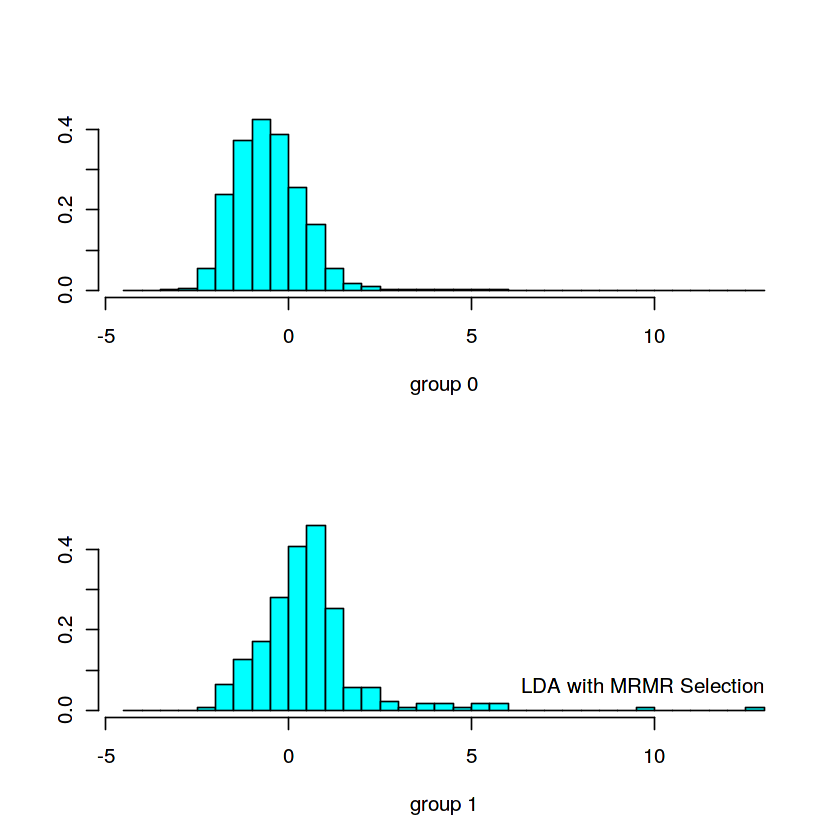

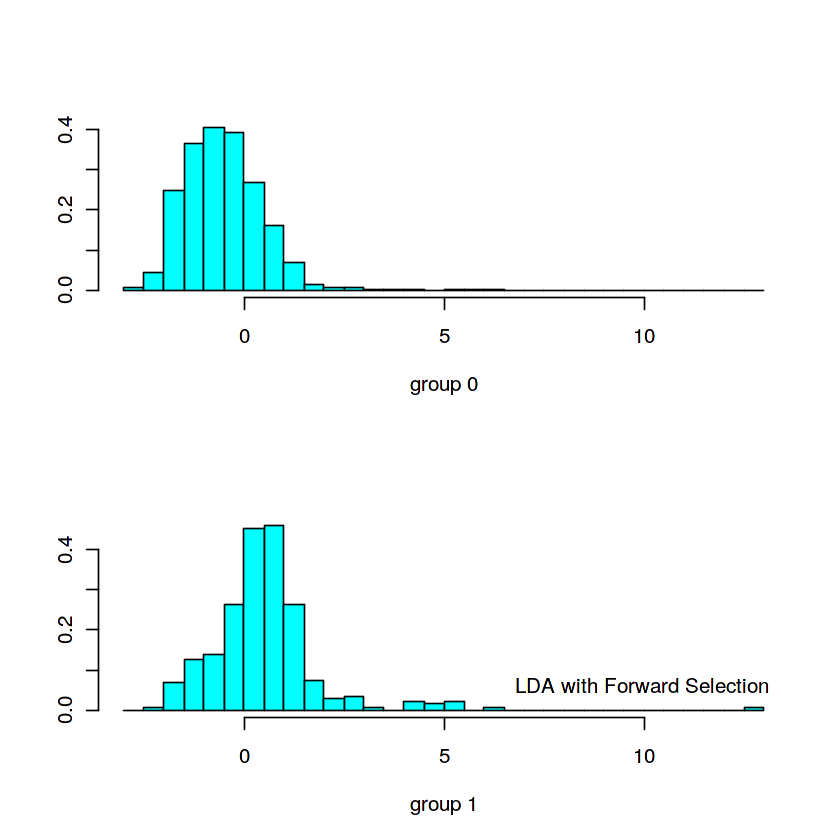

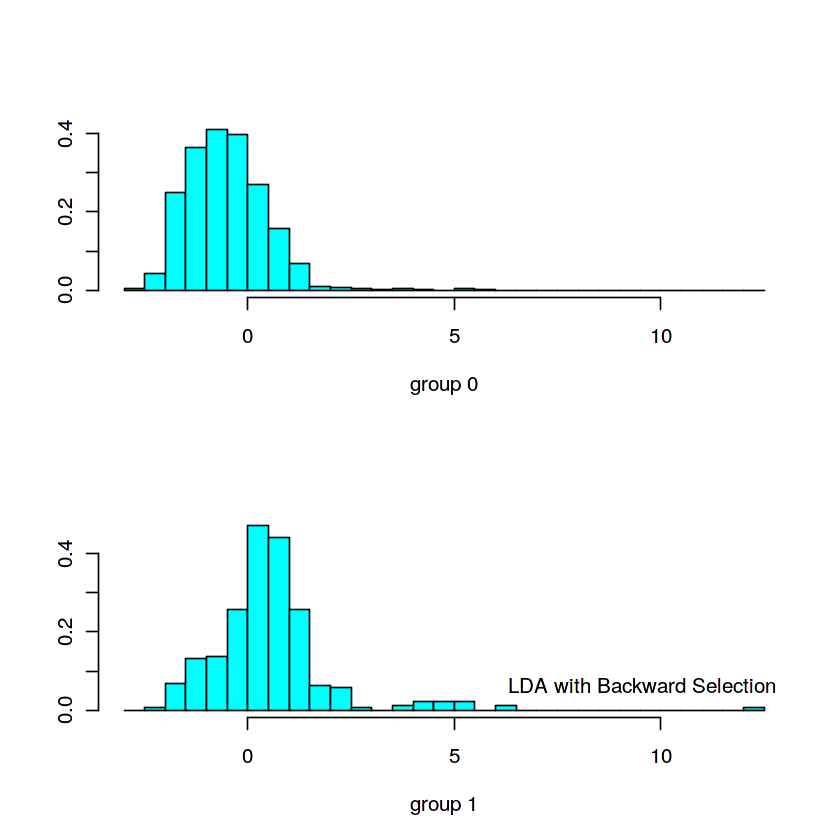

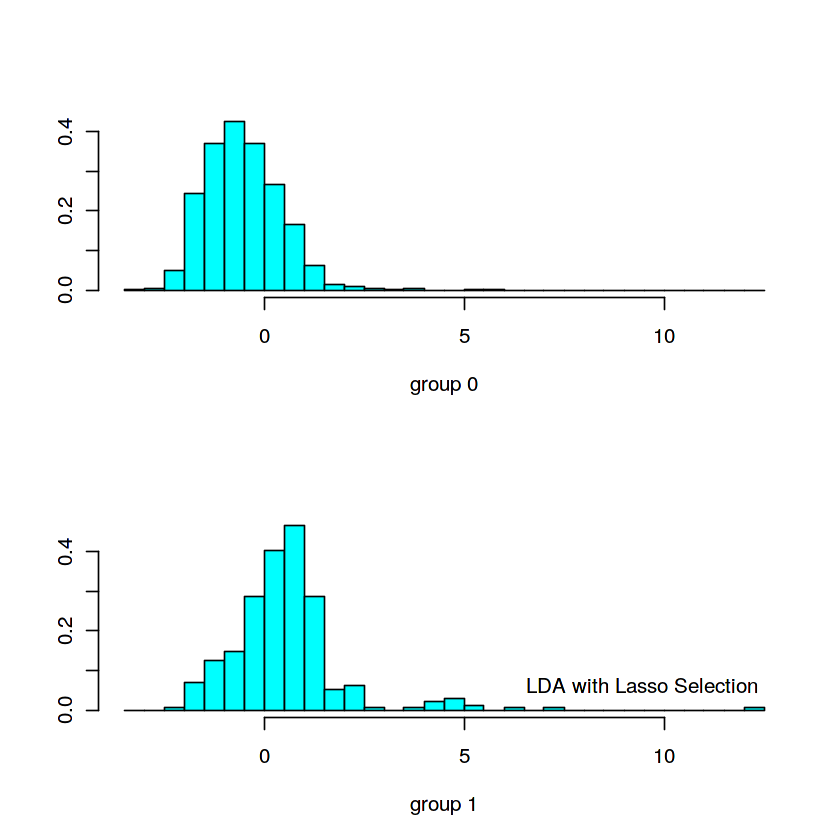

In [116]:
par(mfrow = c(4,2))

plot (lda.MRMR,  main="MRMR Selection")
mtext("LDA with MRMR Selection")
plot(lda.fwd, main="LDA with Forwrd Selection")
mtext("LDA with Forward Selection")
plot(lda.bwd, main="LDA with Backward Selection")
mtext("LDA with Backward Selection")
plot (lda.lasso, main="Lasso Selection")
mtext("LDA with Lasso Selection")




#### Comparison of LDA with Loggistic Regression

As we have seen in previous sections **accuracy of Loggistic regression with forward and back ward selection is around 94 %** while **LDA model gives best accuracy by lasso selection method which is of 93.78 %**

Although, when we go through the score of customers identified that actually bought a caravan insurance policy.
We can clearly see that **LDA with Lasso selection has a score of 14.5% where logistic regression has score of 14.25%**. 

In [117]:
lda.lasso = lda(CARAVAN~., data = insTrainData.Lasso)
prob = predict(lda.lasso, new= insTestData.Lasso, type= "response")
insTestData.lasso.LDA <- cbind(insTestData.Lasso,prob$posterior[,2], insEvalData)
sort <- insTestData.lasso.LDA[ order(-prob$posterior[,2]),]
score= sum(sort[1:800,]$CARAVAN==1)/800
score
#Reference: https://www.statmethods.net/management/sorting.html

[1] 0.145

We can see the score of LDA with Lasso is of 14.5 %

In [118]:
glm.lasso =glm(CARAVAN ~. , data= insTrainData.Lasso, family= 'binomial')
prob = predict(glm.lasso, new= insTestData.Lasso, type= "response")
insTestData.lasso.glm <- cbind(insTestData.Lasso,prob, insEvalData)
sort <- insTestData.lasso.glm[ order(-prob),]
score= sum(sort[1:800,]$CARAVAN==1)/800
score
#Reference: https://www.statmethods.net/management/sorting.html


[1] 0.1425

We can see the score of Logistic regression is 14.25 %

In [119]:
# plot(varImp(logit, scale = TRUE), main = "Variable importance for logistic regression")

## 5. Variable Identification and Explanation <a class="anchor" id="sec_5"></a>

##### According to Logistic Regression

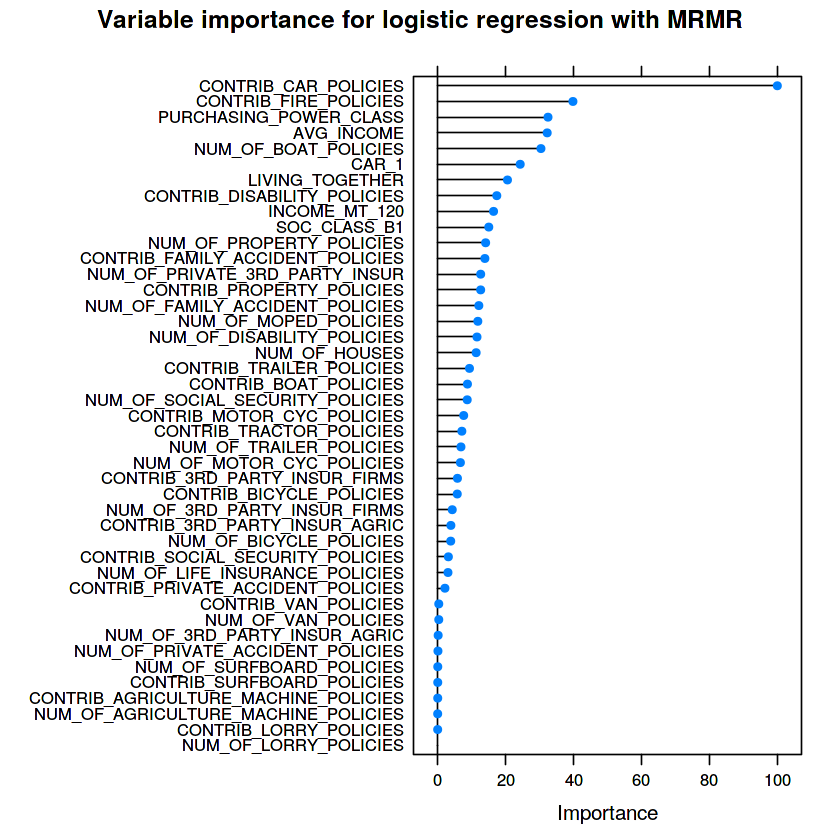

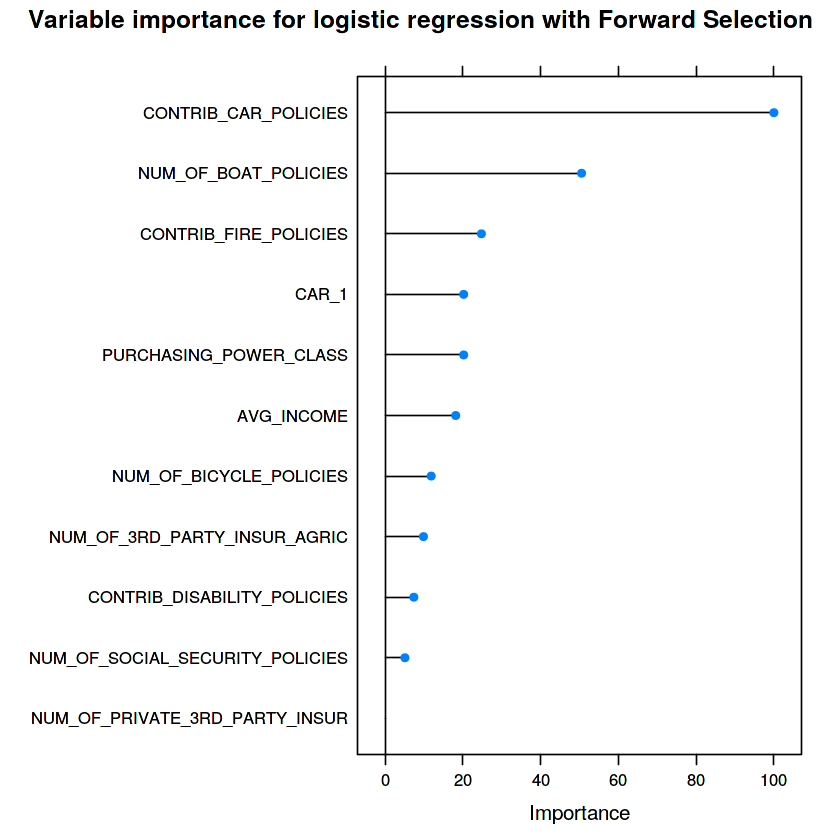

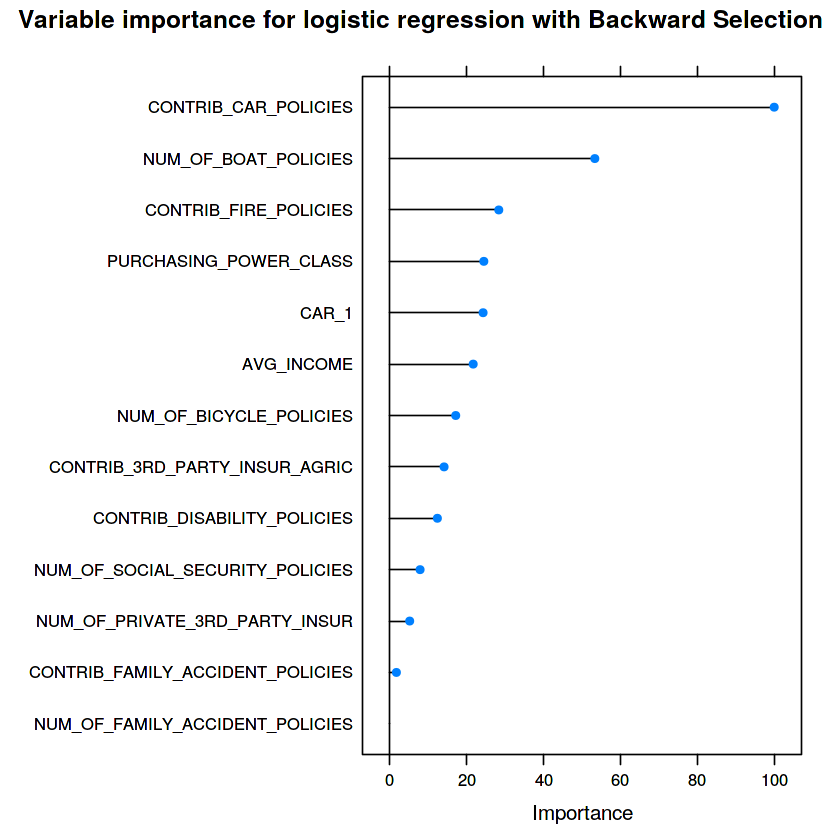

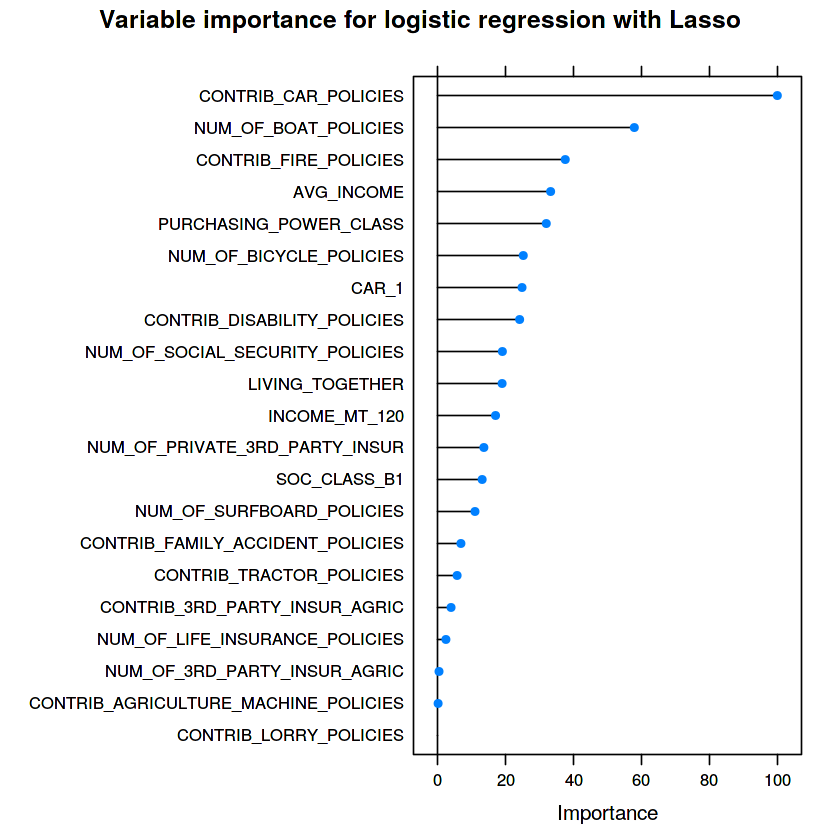

In [120]:
par(mfrow = c(2,2))
plot(varImp(logit.MRMR, scale = TRUE), main = "Variable importance for logistic regression with MRMR")
plot(varImp(logit.fwd, scale = TRUE), main = "Variable importance for logistic regression with Forward Selection")
plot(varImp(logit.bwd, scale = TRUE), main = "Variable importance for logistic regression with Backward Selection")
plot(varImp(logit.lasso, scale = TRUE), main = "Variable importance for logistic regression with Lasso")



It is very clear that customer CONTRIB_CAR_POLICIES, NUM_OF_BOAT_POLICIES, CONTRIB_FIRE_POLICIES are very critical features for a customer to buy insurance which is also evident through EDA and corelation matrix. 


##### According to LDA model

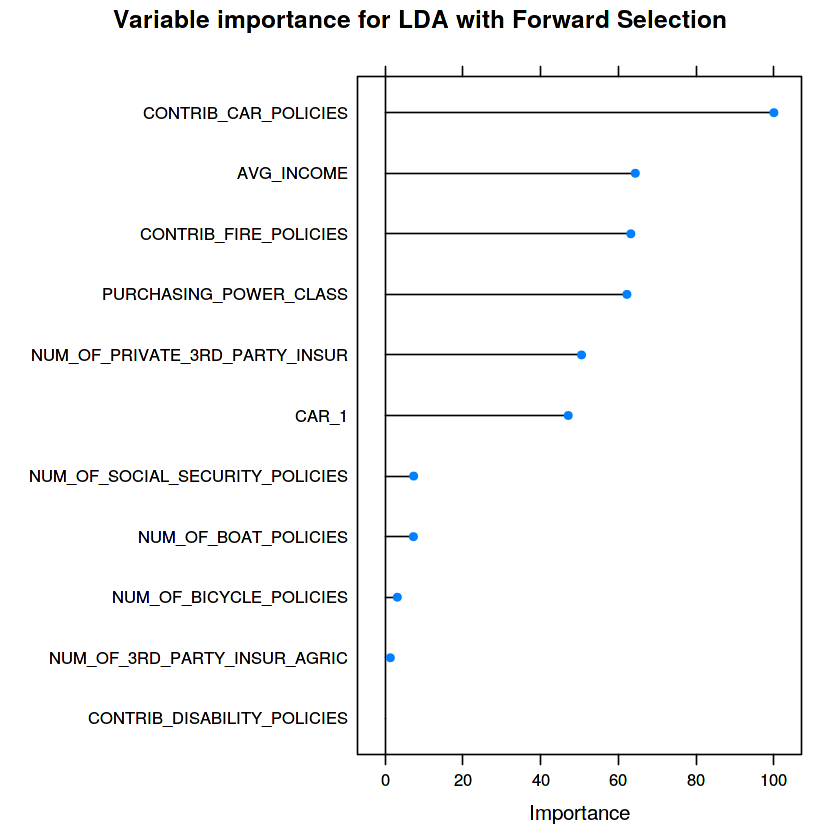

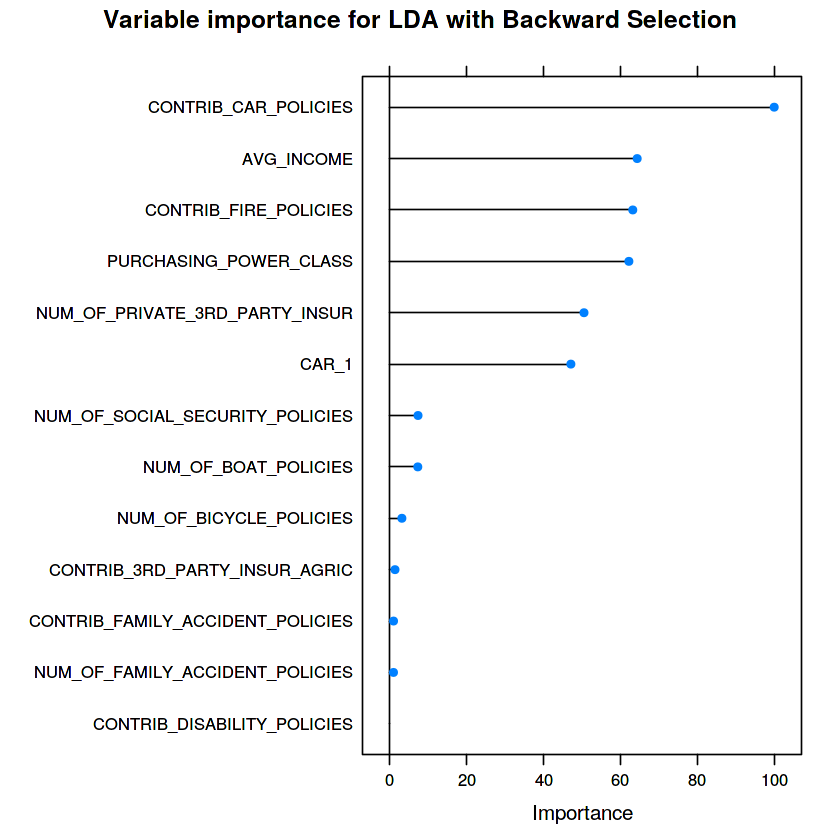

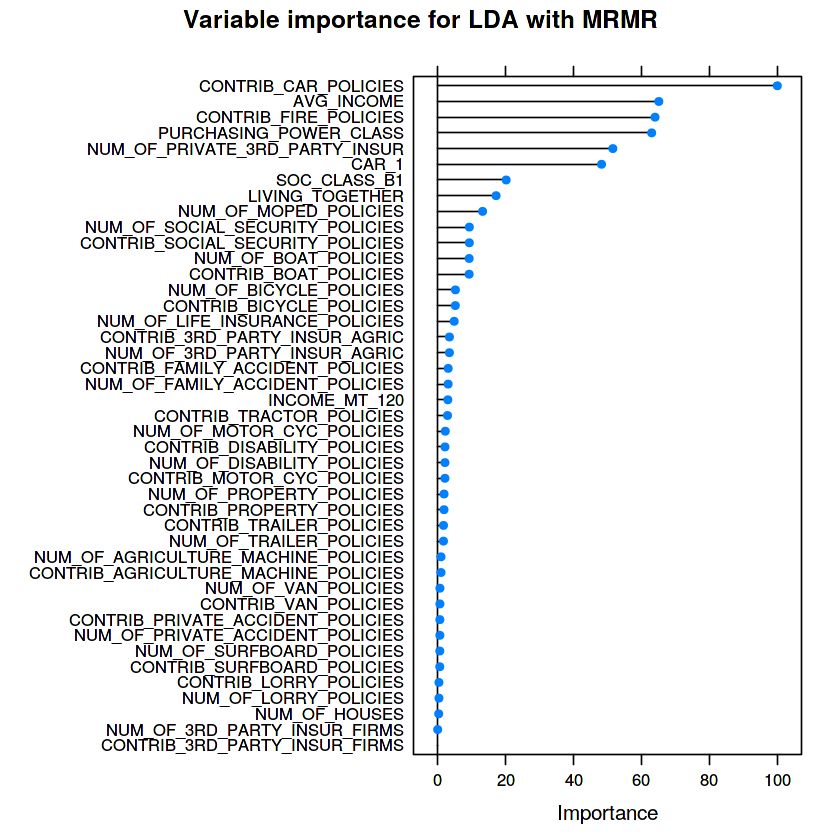

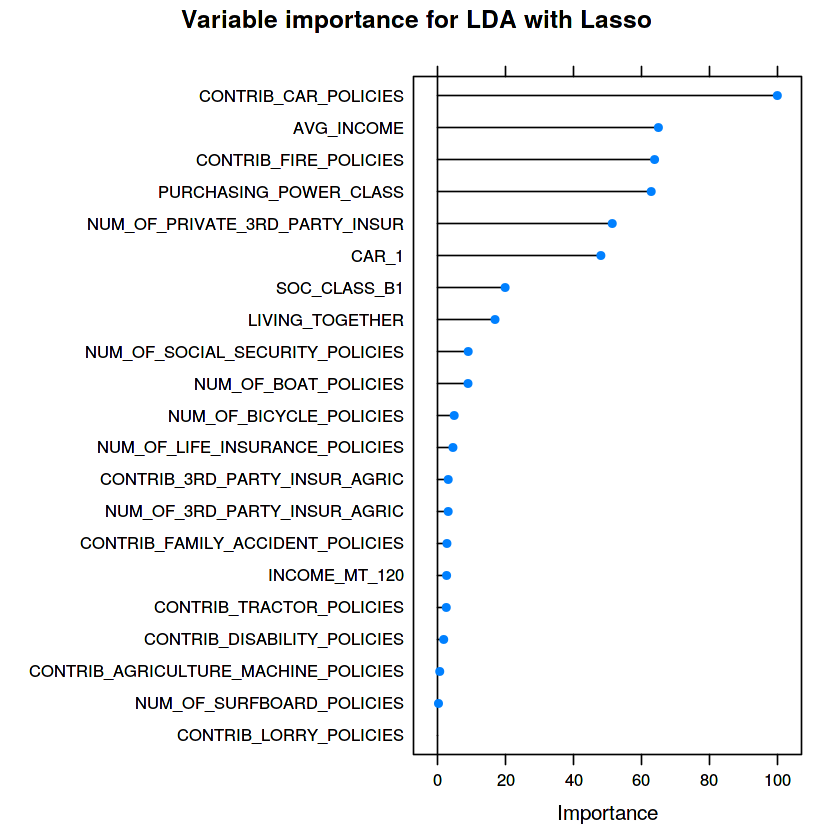

In [121]:
plot(varImp(lda.fwd.new, scale = TRUE), main = "Variable importance for LDA with Forward Selection")
plot(varImp(lda.bwd.new, scale = TRUE), main = "Variable importance for LDA with Backward Selection")
plot(varImp(lda.MRMR.new, scale = TRUE), main = "Variable importance for LDA with MRMR")
plot(varImp(lda.lasso.new, scale = TRUE), main = "Variable importance for LDA with Lasso ")


According to LDA important variables for this model are CONTRIB_CAR_POLICIES, AVG_INCOME, CONTRIB_FIRE_POLICIES, PURCHASING_POWER_CLASS which is also evident through corelation matrix

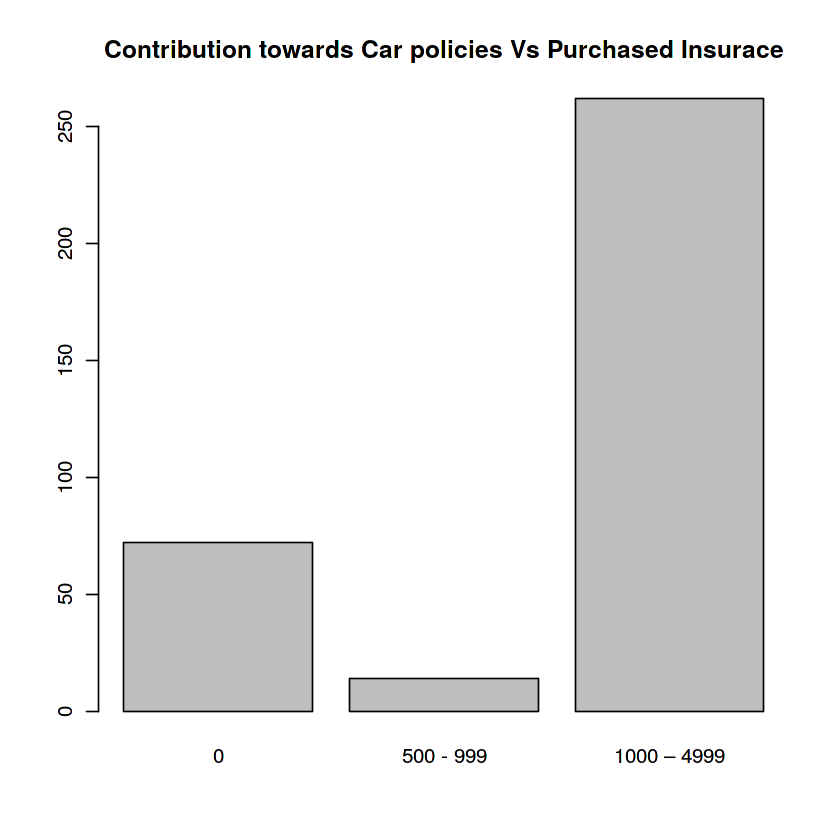

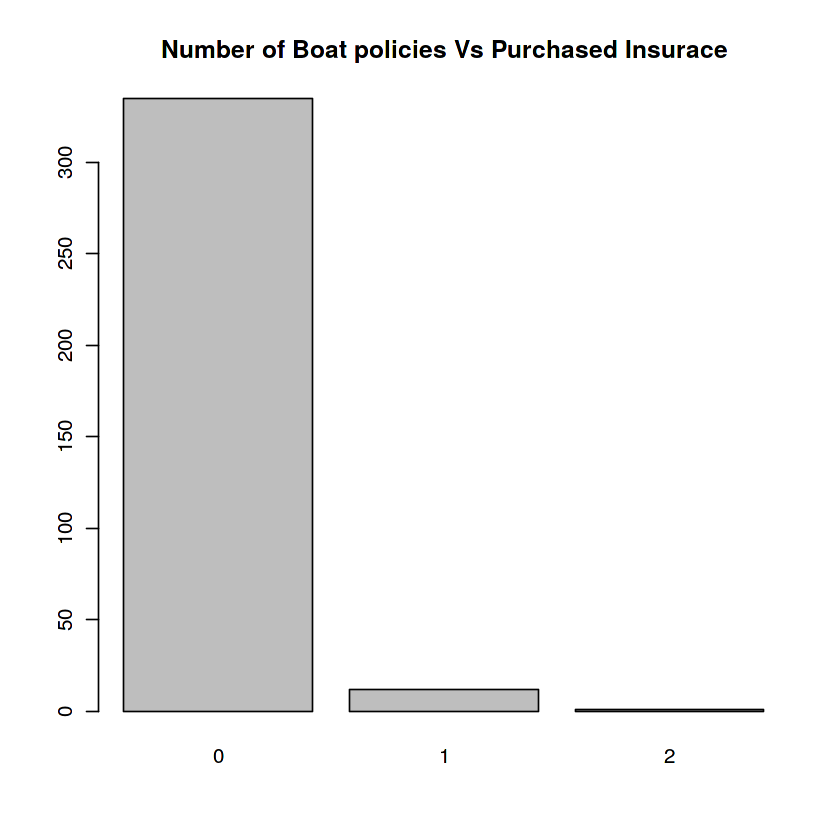

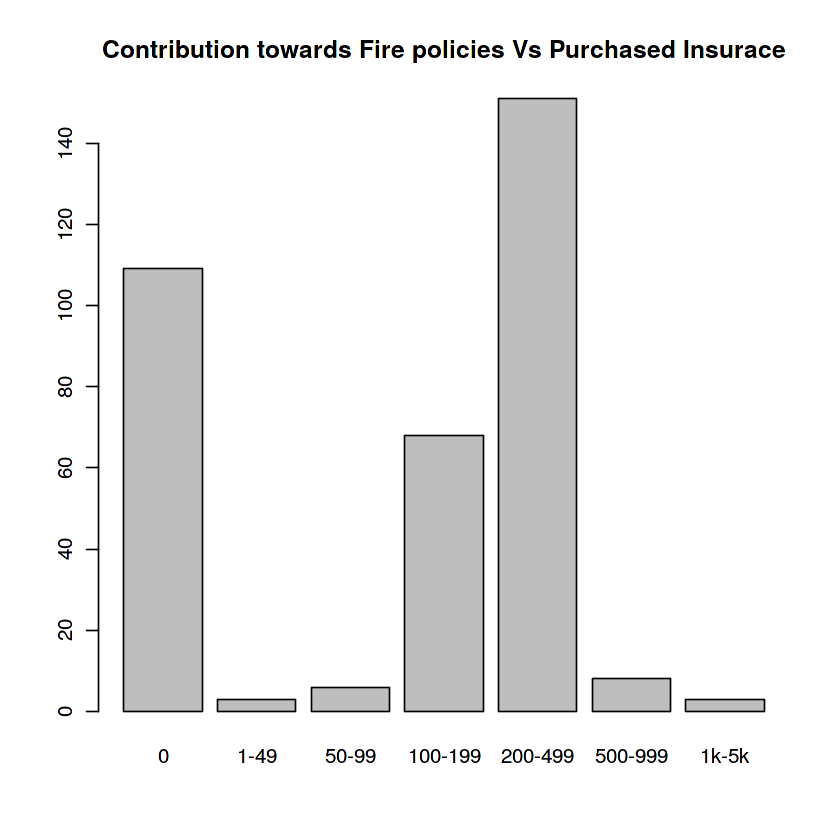

In [122]:
barplot(table(insTrainData$CONTRIB_CAR_POLICIES[insTrainData$CARAVAN==1]), main ="Contribution towards Car policies Vs Purchased Insurace", names= c("0","500 - 999","1000 – 4999"))
barplot(table(insTrainData$NUM_OF_BOAT_POLICIES[insTrainData$CARAVAN==1]), main ="Number of Boat policies Vs Purchased Insurace") 

barplot(table(insTrainData$CONTRIB_FIRE_POLICIES[insTrainData$CARAVAN==1]), main ="Contribution towards Fire policies Vs Purchased Insurace",names= c("0","1-49","50-99","100-199","200-499","500-999", "1k-5k") )

It is safe to say that customer who does **not buy any boat policy** , invest more than 100 dollar in **fire** or **Car** policy is more likely to buy the Caravan Insurance

## 6. Conclusion <a class="anchor" id="sec_6"></a>

- As it is evident from the report, we would chose LDA with Lasso selection as a model for this problem because emphasis of this task is to identify customers who would actually buy a caravan insurance. 
- We can also conclude that features like number, contriution towards other policies (like Car, boat, fire, etc) pkays a key role in our model.

## 7. References <a class="anchor" id="sec_7"></a>

- https://www.rdocumentation.org/packages/praznik/versions/5.0.0
- https://stackoverflow.com/questions/33180058/coerce-multiple-columns-to-factors-at-once
- https://www.statmethods.net/management/sorting.html
- https://stackoverflow.com/questions/16194212/how-to-suppress-warnings-globally-in-an-r-script

